In [1]:
print("EDA для Задания для курсовой работы")

EDA для Задания для курсовой работы


In [2]:
# === ЭТАП 0: Инициализация окружения и базовая загрузка ===

# 📦 Импорт необходимых библиотек
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# 📐 Для анализа признаков и проекций (на следующих этапах)
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
import umap.umap_ as umap

# 🧠 Для оценки взаимной информации
from sklearn.feature_selection import mutual_info_regression

# 🛑 Отключаем предупреждения и настраиваем графики
warnings.filterwarnings("ignore")
sns.set(style="whitegrid")

# 📁 Создание необходимых папок
os.makedirs("plots/eda", exist_ok=True)
os.makedirs("data", exist_ok=True)

# 📥 Загрузка исходных данных
df = pd.read_excel("data/Данные_для_курсовои_Классическое_МО.xlsx")

# 📊 Первичный анализ
print("✅ Размерность датафрейма:", df.shape)
print("📋 Первые 5 строк:")
print(df.head())

# 🔍 Проверка типов
print("📦 Типы данных:")
print(df.dtypes.value_counts())
print("🔍 object-колонки:")
print(df.dtypes[df.dtypes == 'object'])

# 🔍 Проверка дубликатов и NaN по строкам
print("📌 Дубликатов в данных:", df.duplicated().sum())
print("📌 Строк с более чем 20 NaN:", (df.isnull().sum(axis=1) > 20).sum())

# Подсчёт NaN по каждому столбцу
nan_counts = df.isnull().sum()
nan_counts = nan_counts[nan_counts > 0]

if nan_counts.empty:
    print("✅ Пропущенных значений в датафрейме НЕТ.")
else:
    print("🧨 Найдены пропуски:")
    print(nan_counts.sort_values(ascending=False))


✅ Размерность датафрейма: (1001, 214)
📋 Первые 5 строк:
   Unnamed: 0    IC50, mM    CC50, mM         SI  MaxAbsEStateIndex  \
0           0    6.239374  175.482382  28.125000           5.094096   
1           1    0.771831    5.402819   7.000000           3.961417   
2           2  223.808778  161.142320   0.720000           2.627117   
3           3    1.705624  107.855654  63.235294           5.097360   
4           4  107.131532  139.270991   1.300000           5.150510   

   MaxEStateIndex  MinAbsEStateIndex  MinEStateIndex       qed        SPS  \
0        5.094096           0.387225        0.387225  0.417362  42.928571   
1        3.961417           0.533868        0.533868  0.462473  45.214286   
2        2.627117           0.543231        0.543231  0.260923  42.187500   
3        5.097360           0.390603        0.390603  0.377846  41.862069   
4        5.150510           0.270476        0.270476  0.429038  36.514286   

   ...  fr_sulfide  fr_sulfonamd  fr_sulfone  fr_term_

In [3]:
df

,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,...,0,0,0,0,0,0,0,0,3,0
1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,...,0,0,0,0,0,0,0,0,3,0
2,2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,...,0,0,0,0,0,0,0,0,3,0
3,3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,...,0,0,0,0,0,0,0,0,4,0
4,4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,996,31.000104,34.999650,1.129017,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,...,0,0,0,0,0,0,0,0,0,0
997,997,31.999934,33.999415,1.062484,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,...,0,0,0,0,0,0,0,0,0,0
998,998,30.999883,33.999458,1.096761,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,...,1,0,0,0,0,0,0,0,0,0
999,999,31.998959,32.999644,1.031272,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,...,0,0,0,0,0,0,0,0,0,0


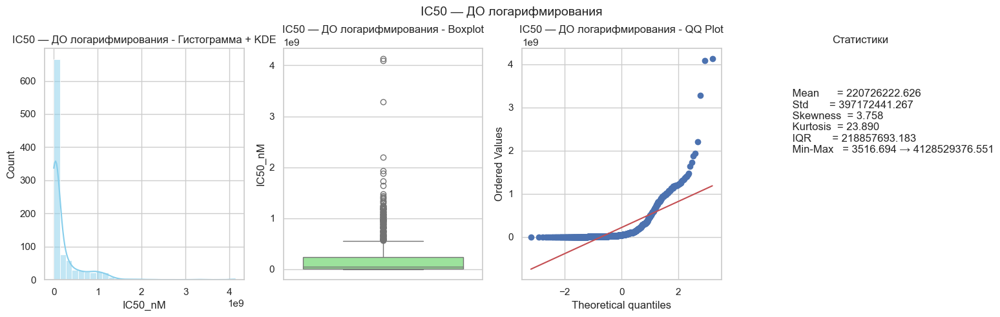

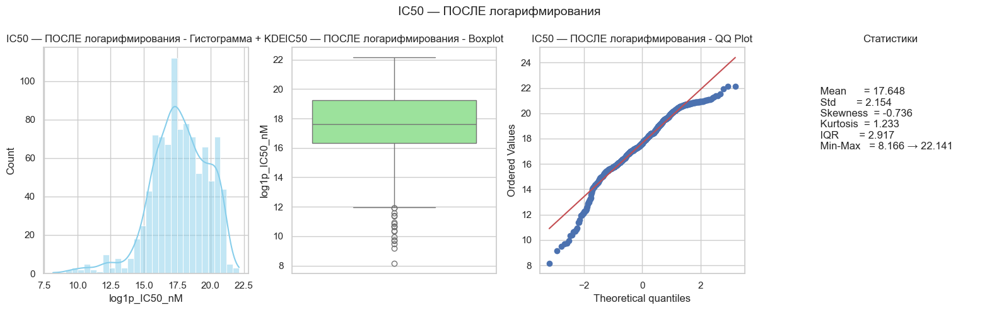

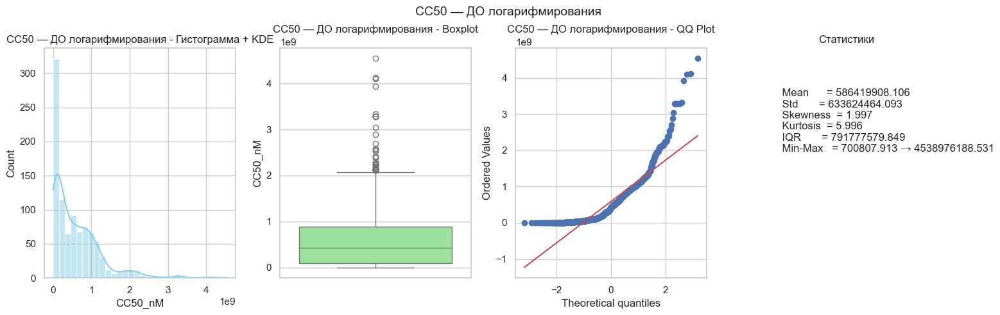

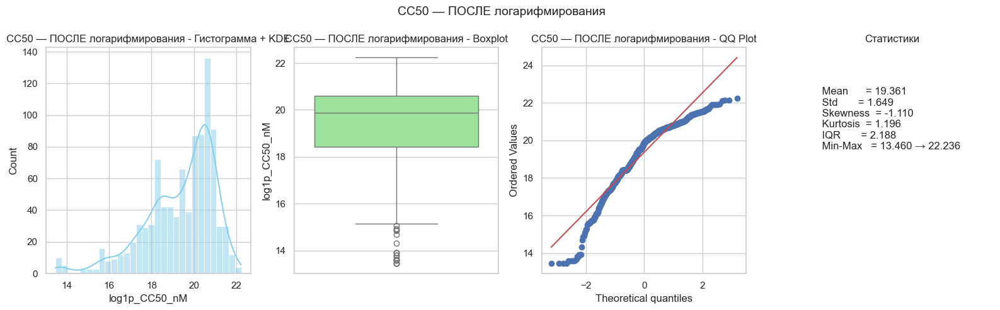

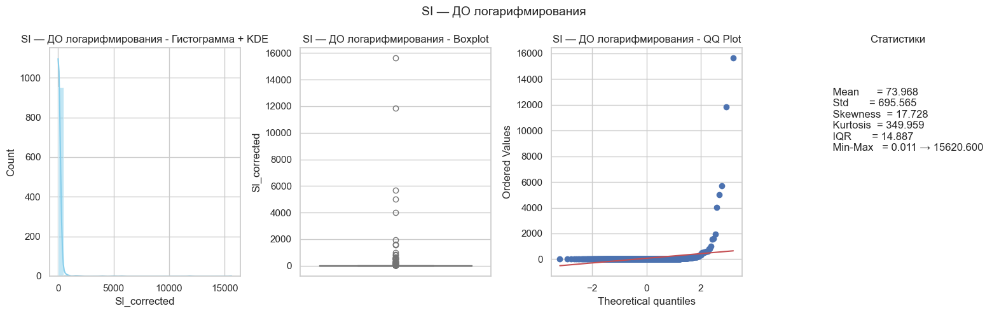

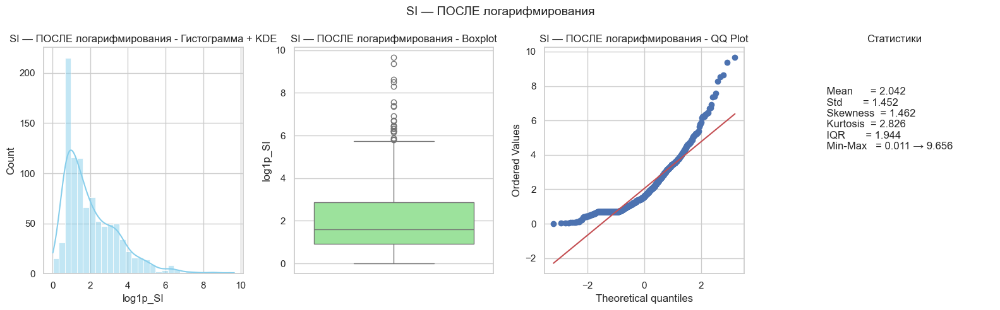

✅ Размерность после обработки: (969, 217)

📊 Описание лог-таргетов:
       log1p_IC50_nM  log1p_CC50_nM    log1p_SI
count     969.000000     969.000000  969.000000
mean       17.648264      19.361038    2.042414
std         2.154213       1.649432    1.452492
min         8.165561      13.459991    0.011424
25%        16.342470      18.420674    0.911517
50%        17.629664      19.865636    1.589235
75%        19.259542      20.608727    2.855032
max        22.141187      22.235967    9.656410

📊 Распределение классов:
IC50_gt_median:
   class  fraction
0      0  0.500516
1      1  0.499484

CC50_gt_median:
   class  fraction
0      0  0.500516
1      1  0.499484

SI_gt_median:
   class  fraction
0      0  0.500516
1      1  0.499484

SI_gt_8:
   class  fraction
0      0  0.646027
1      1  0.353973

✅ Пропущенных значений в датафрейме НЕТ.
💾 Сохранено: data/data_clean.csv


In [4]:
### === ЭТАП 1: Подготовка целевых переменных и признаков ===

import numpy as np
import pandas as pd

# --- Шаг 1: Очистка названий колонок ---
df = df.drop(columns=["Unnamed: 0"], errors="ignore")
df.columns = df.columns.str.strip().str.replace(",", "").str.replace(" ", "_")

# --- Шаг 2: Удаление дубликатов ---
df = df.drop_duplicates()

# --- Шаг 2.1: Заполнение пропусков по среднему по всем числовым признакам ---
df = df.fillna(df.mean(numeric_only=True))

# --- Шаг 3: Преобразование IC50 и CC50 в наноМоли ---
df["IC50_nM"] = df["IC50_mM"] * 1e6
df["CC50_nM"] = df["CC50_mM"] * 1e6

# --- Логарифмирование (log1p) ---
df["log1p_IC50_nM"] = np.log1p(df["IC50_nM"])
df["log1p_CC50_nM"] = np.log1p(df["CC50_nM"])

# --- Расчёт SI и логарифмирование ---
df["SI_corrected"] = df["CC50_nM"] / df["IC50_nM"]
df["SI_corrected"] = df["SI_corrected"].replace([np.inf, -np.inf], np.nan)
df["log1p_SI"] = np.log1p(df["SI_corrected"])

# --- Шаг 4: Удаление строк с NaN в критичных таргетах ---
df = df.dropna(subset=["log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI"])

# --- Шаг 4.1: Удаление исходных таргетов (после использования) ---
df = df.drop(columns=["IC50_mM", "CC50_mM", "SI"], errors="ignore")

# --- Шаг 5: Бинаризация таргетов для классификации ---
df["IC50_gt_median"] = (df["IC50_nM"] > df["IC50_nM"].median()).astype(int)
df["CC50_gt_median"] = (df["CC50_nM"] > df["CC50_nM"].median()).astype(int)
df["SI_gt_median"] = (df["SI_corrected"] > df["SI_corrected"].median()).astype(int)
df["SI_gt_8"] = (df["SI_corrected"] > 8).astype(int)

# === ДО-ПОСЛЕ графики логарифмирования таргетов ===
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
import scipy.stats as stats
import os
# === Папка для сохранения ===
os.makedirs("plots/eda/targets/log_transform", exist_ok=True)

# === Исходные и лог-преобразованные значения ===
targets = {
    "IC50": ("IC50_nM", "log1p_IC50_nM"),
    "CC50": ("CC50_nM", "log1p_CC50_nM"),
    "SI": ("SI_corrected", "log1p_SI")
}

def plot_comparison(before, after, label, save_name):
    fig = plt.figure(figsize=(16, 5))
    spec = gridspec.GridSpec(ncols=4, nrows=1, figure=fig)

    # Гистограмма + KDE
    ax0 = fig.add_subplot(spec[0, 0])
    sns.histplot(before, kde=True, bins=30, ax=ax0, color="skyblue")
    ax0.set_title(f"{label} - Гистограмма + KDE")

    # Boxplot
    ax1 = fig.add_subplot(spec[0, 1])
    sns.boxplot(y=before, ax=ax1, color="lightgreen")
    ax1.set_title(f"{label} - Boxplot")

    # QQ-plot
    ax2 = fig.add_subplot(spec[0, 2])
    stats.probplot(before, dist="norm", plot=ax2)
    ax2.set_title(f"{label} - QQ Plot")

    # Статистики
    mean = before.mean()
    std = before.std()
    skew = before.skew()
    kurt = before.kurt()
    iqr = before.quantile(0.75) - before.quantile(0.25)
    val_range = (before.min(), before.max())

    stats_text = f"""
    Mean      = {mean:.3f}
    Std       = {std:.3f}
    Skewness  = {skew:.3f}
    Kurtosis  = {kurt:.3f}
    IQR       = {iqr:.3f}
    Min-Max   = {val_range[0]:.3f} → {val_range[1]:.3f}
    """

    ax3 = fig.add_subplot(spec[0, 3])
    ax3.text(0.1, 0.5, stats_text, fontsize=12)
    ax3.axis("off")
    ax3.set_title("Статистики")

    # Финал
    plt.suptitle(f"{label}", fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.savefig(f"plots/eda/targets/log_transform/{save_name}.png")
    plt.show()

# === Генерация графиков для всех таргетов ===
for name, (raw_col, log_col) in targets.items():
    plot_comparison(df[raw_col], df[raw_col], f"{name} — ДО логарифмирования", f"{name}_before_log")
    plot_comparison(df[log_col], df[log_col], f"{name} — ПОСЛЕ логарифмирования", f"{name}_after_log")


# 🔴 УДАЛЕНИЕ вспомогательных признаков на основе таргета (во избежание утечек)
df = df.drop(columns=["IC50_nM", "CC50_nM", "SI_corrected"], errors="ignore")


# --- Шаг 6: Проверка ---
print("✅ Размерность после обработки:", df.shape)

# Лог-таргеты
print("\n📊 Описание лог-таргетов:")
print(df[["log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI"]].describe())

# Классы
print("\n📊 Распределение классов:")
for col in ["IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"]:
    print(f"{col}:")
    print(df[col].value_counts(normalize=True).rename_axis("class").reset_index(name="fraction"))
    print()

# --- Шаг 7: Сохраняем датасет ---
df.to_csv("data/data_clean.csv", index=False)

# Подсчёт NaN по каждому столбцу
nan_counts = df.isnull().sum()
nan_counts = nan_counts[nan_counts > 0]

if nan_counts.empty:
    print("✅ Пропущенных значений в датафрейме НЕТ.")
else:
    print("🧨 Найдены пропуски:")
    print(nan_counts.sort_values(ascending=False))

print("💾 Сохранено: data/data_clean.csv")


In [5]:
df

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_thiophene,fr_unbrch_alkane,fr_urea,log1p_IC50_nM,log1p_CC50_nM,log1p_SI,IC50_gt_median,CC50_gt_median,SI_gt_median,SI_gt_8
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,0,3,0,15.646391,18.983049,3.371597,0,0,1,1
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,0,3,0,13.556523,15.502432,2.079442,0,0,1,0
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,0,3,0,19.226303,18.897799,0.542324,1,0,0,0
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,0,4,0,14.349442,18.496304,4.162553,0,0,1,1
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,0,0,0,18.489568,18.751932,0.832909,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,...,0,0,0,17.249501,17.370849,0.755660,0,0,0,0
997,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,...,0,0,0,17.281244,17.341854,0.723911,0,0,0,0
998,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,210,...,0,0,0,17.249494,17.341855,0.740394,0,0,0,0
999,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,208,...,0,0,0,17.281214,17.312007,0.708662,0,0,0,0


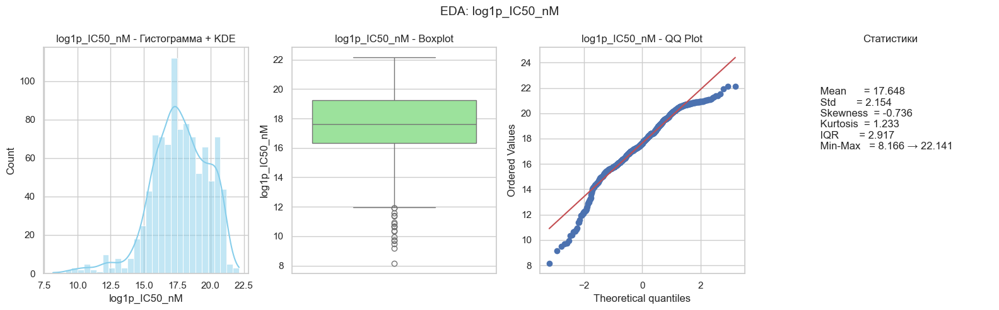

📌 Анализ переменной log1p_IC50_nM:
• Среднее (mean):       17.648
• Стандартное отклонение (std): 2.154
• Асимметрия (skew):    -0.736
• Эксцесс (kurtosis):   1.233
• Межквартильный размах (IQR): 2.917
• Диапазон значений:    8.166 → 22.141
------------------------------------------------------------


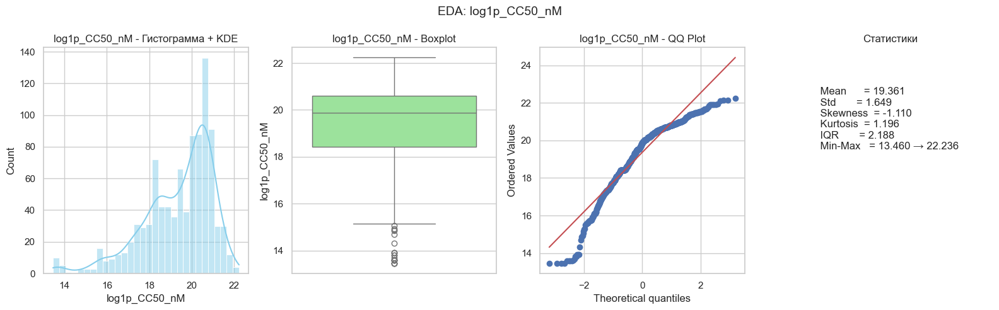

📌 Анализ переменной log1p_CC50_nM:
• Среднее (mean):       19.361
• Стандартное отклонение (std): 1.649
• Асимметрия (skew):    -1.110
• Эксцесс (kurtosis):   1.196
• Межквартильный размах (IQR): 2.188
• Диапазон значений:    13.460 → 22.236
------------------------------------------------------------


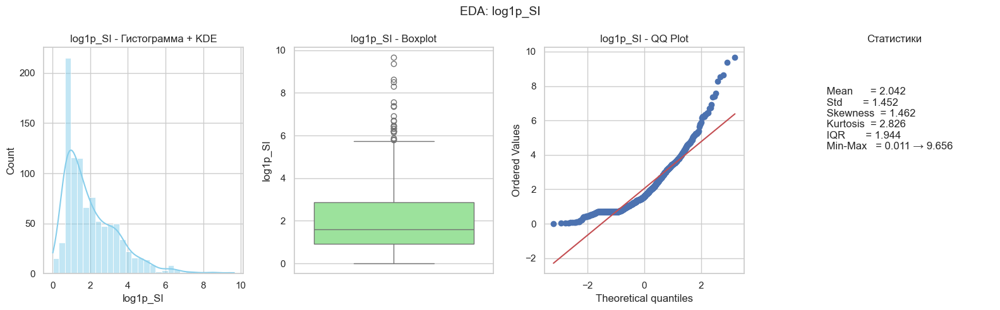

📌 Анализ переменной log1p_SI:
• Среднее (mean):       2.042
• Стандартное отклонение (std): 1.452
• Асимметрия (skew):    1.462
• Эксцесс (kurtosis):   2.826
• Межквартильный размах (IQR): 1.944
• Диапазон значений:    0.011 → 9.656
------------------------------------------------------------


In [6]:
# === ЭТАП 2: Анализ распределений лог-таргетов ===

import os
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

# 📁 Каталог для графиков
os.makedirs("plots/eda/targets", exist_ok=True)

# 🎯 Целевые лог-таргеты
targets = ["log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI"]

# 📊 Визуализация + текстовый вывод
for col in targets:
    fig = plt.figure(figsize=(16, 5))
    spec = gridspec.GridSpec(ncols=4, nrows=1, figure=fig)

    # Гистограмма + KDE
    ax0 = fig.add_subplot(spec[0, 0])
    sns.histplot(df[col], kde=True, bins=30, ax=ax0, color="skyblue")
    ax0.set_title(f"{col} - Гистограмма + KDE")

    # Boxplot
    ax1 = fig.add_subplot(spec[0, 1])
    sns.boxplot(y=df[col], ax=ax1, color="lightgreen")
    ax1.set_title(f"{col} - Boxplot")

    # QQ-plot
    ax2 = fig.add_subplot(spec[0, 2])
    stats.probplot(df[col], dist="norm", plot=ax2)
    ax2.set_title(f"{col} - QQ Plot")

    # Расчет статистик
    mean = df[col].mean()
    std = df[col].std()
    skew = df[col].skew()
    kurt = df[col].kurt()
    iqr = df[col].quantile(0.75) - df[col].quantile(0.25)
    val_range = (df[col].min(), df[col].max())

    stats_text = f"""
    Mean      = {mean:.3f}
    Std       = {std:.3f}
    Skewness  = {skew:.3f}
    Kurtosis  = {kurt:.3f}
    IQR       = {iqr:.3f}
    Min-Max   = {val_range[0]:.3f} → {val_range[1]:.3f}
    """

    ax3 = fig.add_subplot(spec[0, 3])
    ax3.text(0.1, 0.5, stats_text, fontsize=12)
    ax3.axis("off")
    ax3.set_title("Статистики")

    # Сохранение и вывод
    plt.suptitle(f"EDA: {col}", fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.savefig(f"plots/eda/targets/{col}_distribution.png")
    plt.show()

    # ✍️ Письменный вывод 
    print(f"📌 Анализ переменной {col}:")
    print(f"• Среднее (mean):       {mean:.3f}")
    print(f"• Стандартное отклонение (std): {std:.3f}")
    print(f"• Асимметрия (skew):    {skew:.3f}")
    print(f"• Эксцесс (kurtosis):   {kurt:.3f}")
    print(f"• Межквартильный размах (IQR): {iqr:.3f}")
    print(f"• Диапазон значений:    {val_range[0]:.3f} → {val_range[1]:.3f}")
    print("-" * 60)



In [7]:
df

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_thiophene,fr_unbrch_alkane,fr_urea,log1p_IC50_nM,log1p_CC50_nM,log1p_SI,IC50_gt_median,CC50_gt_median,SI_gt_median,SI_gt_8
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,0,3,0,15.646391,18.983049,3.371597,0,0,1,1
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,0,3,0,13.556523,15.502432,2.079442,0,0,1,0
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,0,3,0,19.226303,18.897799,0.542324,1,0,0,0
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,0,4,0,14.349442,18.496304,4.162553,0,0,1,1
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,0,0,0,18.489568,18.751932,0.832909,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,...,0,0,0,17.249501,17.370849,0.755660,0,0,0,0
997,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,...,0,0,0,17.281244,17.341854,0.723911,0,0,0,0
998,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,210,...,0,0,0,17.249494,17.341855,0.740394,0,0,0,0
999,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,208,...,0,0,0,17.281214,17.312007,0.708662,0,0,0,0


In [8]:
# === ЭТАП: Проверка признаков и удаление выбросов по 99.5 перцентилю ===

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# === Путь к данным ===
INPUT_PATH = "data/data_clean.csv"
OUTPUT_PATH = "data/data_clean.csv"  # перезапишем очищенный датасет

# === Шаг 1: Загрузка данных ===
df = pd.read_csv(INPUT_PATH)

# === Шаг 2: Статистики по числовым признакам ===
desc = df.describe().T.sort_values("max", ascending=False)
print("📊 Топ признаков по максимуму:")
print(desc[["mean", "std", "min", "25%", "50%", "75%", "max"]].head(10))

# === Шаг 3: Поиск подозрительных признаков с max > 900 ===
suspect_cols = desc[desc["max"] > 900].index.tolist()
print(f"\n⚠️ Подозрительные признаки (max > 900): {suspect_cols}")

# === Шаг 4: Удаление выбросов по 99.5 перцентилю для каждого подозрительного признака ===
df_filtered = df.copy()
for col in suspect_cols:
    threshold = df_filtered[col].quantile(0.995)
    n_before = df_filtered.shape[0]
    df_filtered = df_filtered[df_filtered[col] < threshold]
    n_after = df_filtered.shape[0]
    print(f"🧹 {col}: удалено {n_before - n_after} строк (порог: {threshold:.2f})")

print(f"\n✅ Осталось строк после очистки: {df_filtered.shape[0]} из {df.shape[0]}")

# === Шаг 5: (опционально) исключаем выбросной признак 'Ipc' перед PCA ===
if "Ipc" in df_filtered.columns:
    df_filtered = df_filtered.drop(columns=["Ipc"])

# === Шаг 6: Сохраняем очищенный датафрейм ===
df_filtered.to_csv(OUTPUT_PATH, index=False)
print(f"💾 Датафрейм сохранён: {OUTPUT_PATH}")


📊 Топ признаков по максимуму:
                             mean           std         min           25%  \
Ipc                  4.991263e+10  1.276529e+12  107.107191  20478.213705   
BertzCT              7.648316e+02  4.374651e+02  113.625488    421.423181   
MolWt                3.514861e+02  1.273882e+02  110.156000    266.252000   
ExactMolWt           3.511597e+02  1.272498e+02  110.073165    266.057909   
HeavyAtomMolWt       3.275719e+02  1.220372e+02  100.076000    248.200000   
TPSA                 6.208195e+01  4.598097e+01    0.000000     29.460000   
LabuteASA            1.480337e+02  5.275139e+01   46.234269    113.132727   
NumValenceElectrons  1.332343e+02  4.693846e+01   42.000000    102.000000   
EState_VSA5          1.883242e+01  2.256933e+01    0.000000      5.563451   
MolMR                9.506206e+01  3.458039e+01   28.088500     73.009700   

                               50%           75%           max  
Ipc                  120493.158191  5.643087e+06  3.95178

In [9]:
# === 2.1 - Обработка лог таргетов, удаление выбросов методом IQR


📊 Обработка переменной: log1p_IC50_nM


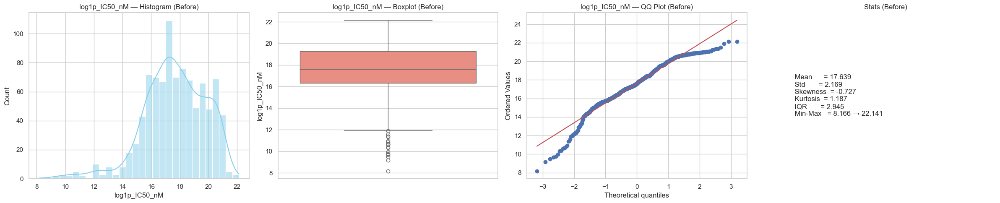

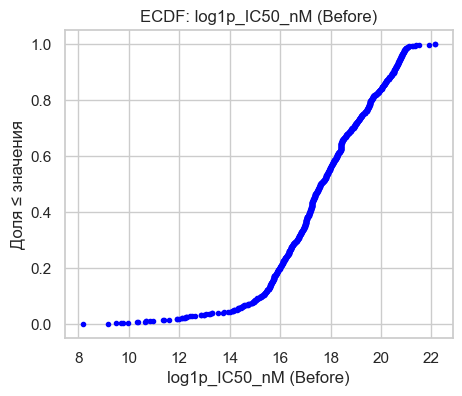

🧨 Удаляется выбросов по log1p_IC50_nM: 25 строк (метод: IQR, множитель=1.5)
  → Квантили: Q1=0.22, Q3=0.68


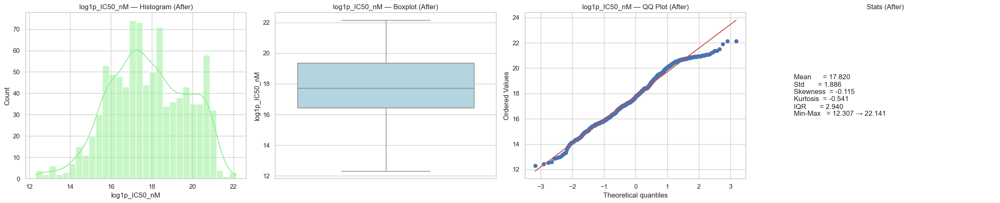

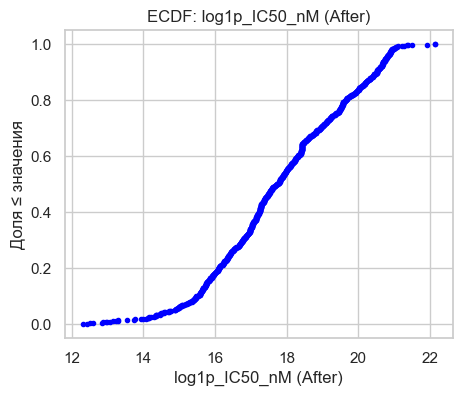


📊 Обработка переменной: log1p_CC50_nM


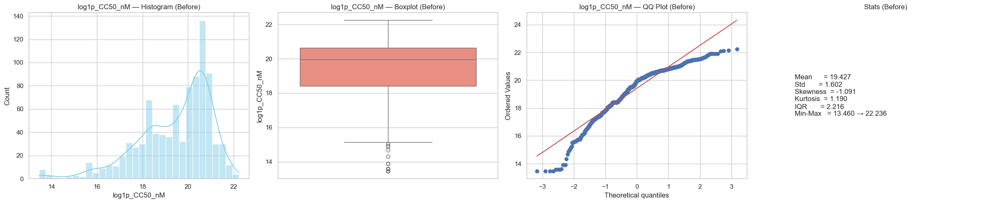

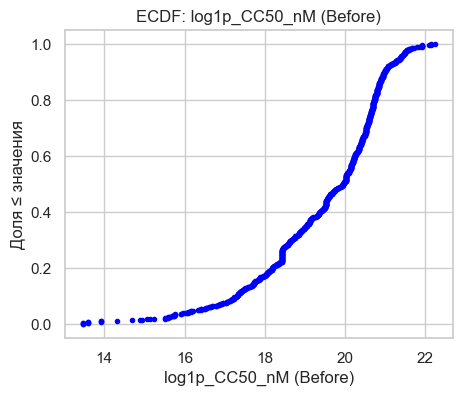

🧨 Удаляется выбросов по log1p_CC50_nM: 17 строк (метод: IQR, множитель=1.5)
  → Квантили: Q1=0.22, Q3=0.68


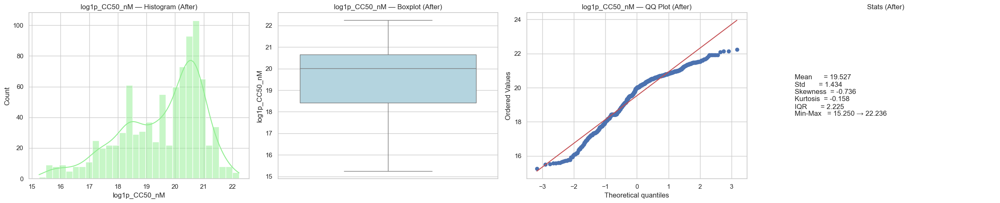

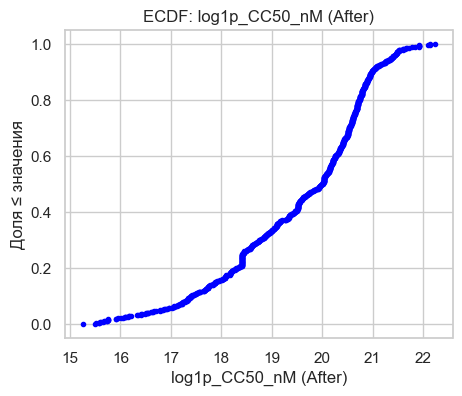


📊 Обработка переменной: log1p_SI


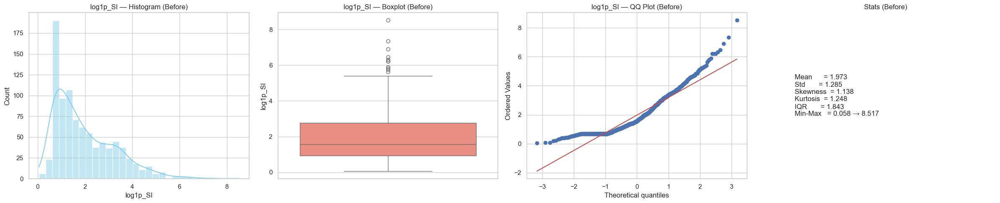

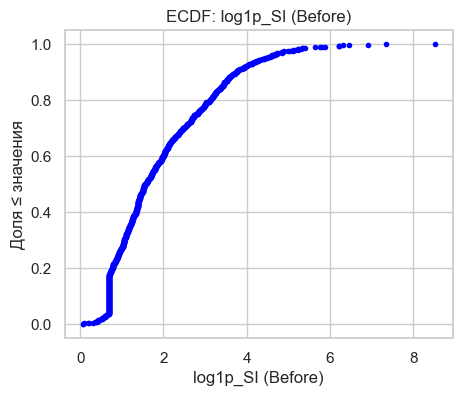

🧨 Удаляется выбросов по log1p_SI: 35 строк (метод: IQR, множитель=1.5)
  → Квантили: Q1=0.22, Q3=0.68


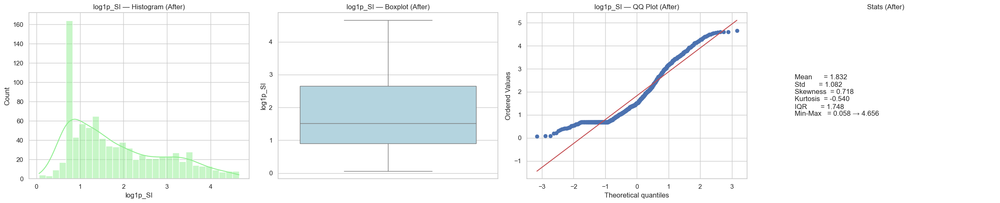

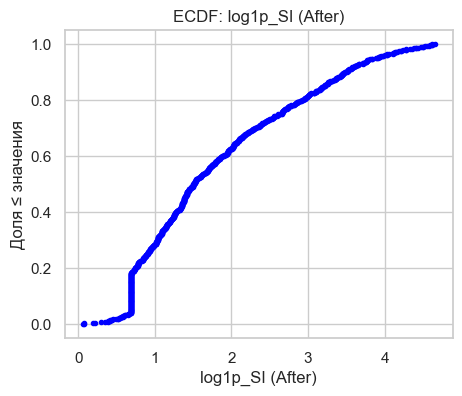

In [10]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from matplotlib import gridspec


# === Загрузка очищенного датасета после логарифмирования ===
df = pd.read_csv("data/data_clean.csv")  # <--- замените на нужный путь при необходимости



# === Папки ===
os.makedirs("plotsjp/eda/outliers", exist_ok=True)

# === Таргеты ===
target_cols = ["log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI"]

# === Статистика
def get_stats_text(series):
    return f"""
    Mean      = {series.mean():.3f}
    Std       = {series.std():.3f}
    Skewness  = {series.skew():.3f}
    Kurtosis  = {series.kurt():.3f}
    IQR       = {series.quantile(0.75) - series.quantile(0.25):.3f}
    Min-Max   = {series.min():.3f} → {series.max():.3f}
    """

# === Адаптивный выбор квартилей
def get_quantiles_robust(series):
    skew = series.skew()
    kurt = series.kurt()
    n = len(series)
    if n < 200:
        return 0.25, 0.75, 1.5, "IQR"
    if abs(skew) > 2 or kurt > 5:
        return None, None, 3, "MAD"
    if abs(skew) > 1.2 or kurt > 2.5:
        return 0.2, 0.6, 1.0, "IQR"
    if abs(skew) > 0.5 or kurt > 1.5:
        return 0.22, 0.68, 1.5, "IQR"
    return 0.25, 0.75, 1.5, "IQR"

# === ECDF
def plot_ecdf(series, title, path):
    x = np.sort(series)
    y = np.arange(1, len(x) + 1) / len(x)
    plt.figure(figsize=(5, 4))
    plt.plot(x, y, marker='.', linestyle='none', color='blue')
    plt.xlabel(title)
    plt.ylabel("Доля ≤ значения")
    plt.title(f"ECDF: {title}")
    plt.grid(True)
    plt.savefig(path)
    plt.show()

# === Обработка всех лог-таргетов
for col in target_cols:
    print(f"\n📊 Обработка переменной: {col}")
    
    # Графики до
    fig = plt.figure(figsize=(24, 5))
    spec = gridspec.GridSpec(ncols=4, nrows=1, figure=fig)

    ax0 = fig.add_subplot(spec[0, 0])
    sns.histplot(df[col], kde=True, bins=30, color="skyblue", ax=ax0)
    ax0.set_title(f"{col} — Histogram (Before)")

    ax1 = fig.add_subplot(spec[0, 1])
    sns.boxplot(y=df[col], color="salmon", ax=ax1)
    ax1.set_title(f"{col} — Boxplot (Before)")

    ax2 = fig.add_subplot(spec[0, 2])
    stats.probplot(df[col], dist="norm", plot=ax2)
    ax2.set_title(f"{col} — QQ Plot (Before)")

    ax3 = fig.add_subplot(spec[0, 3])
    ax3.text(0.05, 0.5, get_stats_text(df[col]), fontsize=12, verticalalignment='center')
    ax3.axis("off")
    ax3.set_title("Stats (Before)")

    plt.tight_layout()
    plt.savefig(f"plotsjp/eda/outliers/{col}_before_outliers.png")
    plt.show()

    # ECDF до
    plot_ecdf(df[col], f"{col} (Before)", f"plotsjp/eda/outliers/{col}_ecdf_before.png")

    # === Подбор метода
    Q1_q, Q3_q, mult, method = get_quantiles_robust(df[col])

    if method == "IQR":
        Q1 = df[col].quantile(Q1_q)
        Q3 = df[col].quantile(Q3_q)
        IQR = Q3 - Q1
        lower = Q1 - mult * IQR
        upper = Q3 + mult * IQR
    elif method == "MAD":
        med = df[col].median()
        mad = np.median(np.abs(df[col] - med))
        lower = med - mult * mad
        upper = med + mult * mad

    outliers = df[(df[col] < lower) | (df[col] > upper)]
    print(f"🧨 Удаляется выбросов по {col}: {outliers.shape[0]} строк (метод: {method}, множитель={mult})")
    if method == "IQR":
        print(f"  → Квантили: Q1={Q1_q}, Q3={Q3_q}")

    # Сохраняем удалённые
    outliers.to_csv(f"plotsjp/eda/outliers/removed_{col}.csv", index=False)

    # Удаление
    df = df[(df[col] >= lower) & (df[col] <= upper)]

    # Графики после
    fig = plt.figure(figsize=(24, 5))
    spec = gridspec.GridSpec(ncols=4, nrows=1, figure=fig)

    ax0 = fig.add_subplot(spec[0, 0])
    sns.histplot(df[col], kde=True, bins=30, color="lightgreen", ax=ax0)
    ax0.set_title(f"{col} — Histogram (After)")

    ax1 = fig.add_subplot(spec[0, 1])
    sns.boxplot(y=df[col], color="lightblue", ax=ax1)
    ax1.set_title(f"{col} — Boxplot (After)")

    ax2 = fig.add_subplot(spec[0, 2])
    stats.probplot(df[col], dist="norm", plot=ax2)
    ax2.set_title(f"{col} — QQ Plot (After)")

    ax3 = fig.add_subplot(spec[0, 3])
    ax3.text(0.05, 0.5, get_stats_text(df[col]), fontsize=12, verticalalignment='center')
    ax3.axis("off")
    ax3.set_title("Stats (After)")

    plt.tight_layout()
    plt.savefig(f"plotsjp/eda/outliers/{col}_after_outliers.png")
    plt.show()

    # ECDF после
    plot_ecdf(df[col], f"{col} (After)", f"plotsjp/eda/outliers/{col}_ecdf_after.png")


In [11]:
# Где наблюдаются максимальные частоты
df["log1p_IC50_nM"].value_counts().sort_values(ascending=False).head(10)

log1p_IC50_nM
20.523230    2
15.759264    2
15.776643    2
19.555899    2
17.900742    2
18.020233    2
18.405726    2
19.743418    2
20.281889    2
20.896675    2
Name: count, dtype: int64

In [12]:
# Где наблюдаются максимальные частоты
df["log1p_CC50_nM"].value_counts().sort_values(ascending=False).head(10)

log1p_CC50_nM
21.912429    5
20.146611    4
18.420671    4
18.064027    4
20.953891    3
21.479391    3
18.420685    3
21.039504    3
21.356387    3
20.676354    3
Name: count, dtype: int64

In [13]:
# Где наблюдаются максимальные частоты
df["log1p_SI"].value_counts().sort_values(ascending=False).head(10)

log1p_SI
0.693147    122
1.016934      5
1.386294      4
3.931826      3
1.098612      3
1.386294      3
1.196251      3
1.218157      3
1.425009      3
1.252763      3
Name: count, dtype: int64

In [14]:
df

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_thiophene,fr_unbrch_alkane,fr_urea,log1p_IC50_nM,log1p_CC50_nM,log1p_SI,IC50_gt_median,CC50_gt_median,SI_gt_median,SI_gt_8
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,0,3,0,15.646391,18.983049,3.371597,0,0,1,1
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,0,3,0,13.556523,15.502432,2.079442,0,0,1,0
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,0,3,0,19.226303,18.897799,0.542324,1,0,0,0
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,0,4,0,14.349442,18.496304,4.162553,0,0,1,1
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,0,0,0,18.489568,18.751932,0.832909,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
944,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,...,0,0,0,17.249501,17.370849,0.755660,0,0,0,0
945,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,...,0,0,0,17.281244,17.341854,0.723911,0,0,0,0
946,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,210,...,0,0,0,17.249494,17.341855,0.740394,0,0,0,0
947,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,208,...,0,0,0,17.281214,17.312007,0.708662,0,0,0,0


In [15]:
# === 2.2 - Тестирование Dummy Regressor 


📊 Dummy Regressor Report — log1p_IC50_nM
RMSE: 1.7618
MAE:  1.4467
R²:   -0.0016


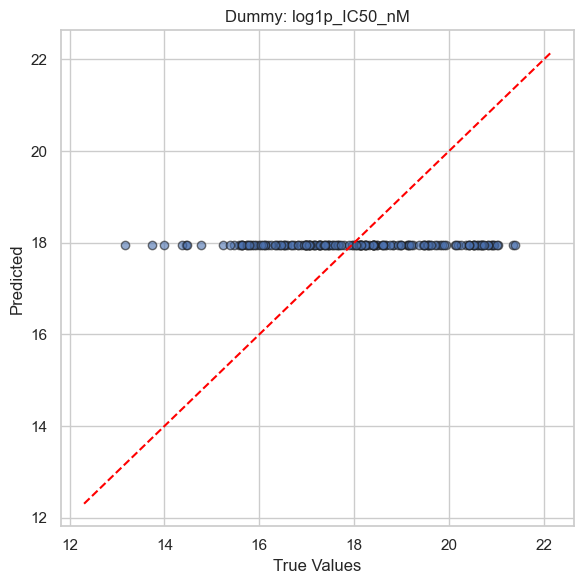

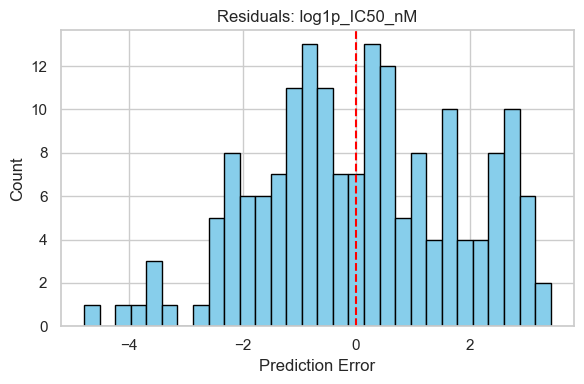


📊 Dummy Regressor Report — log1p_CC50_nM
RMSE: 1.4242
MAE:  1.2129
R²:   -0.0055


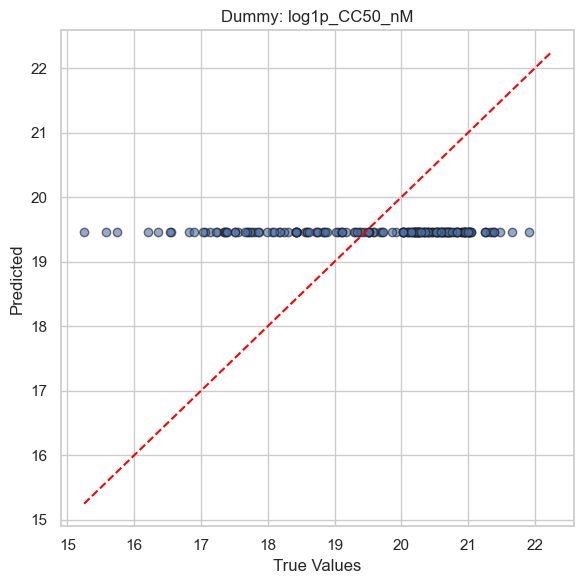

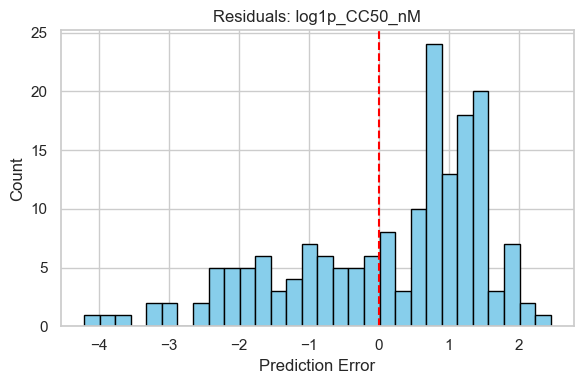


📊 Dummy Regressor Report — log1p_SI
RMSE: 1.1399
MAE:  0.9617
R²:   -0.0020


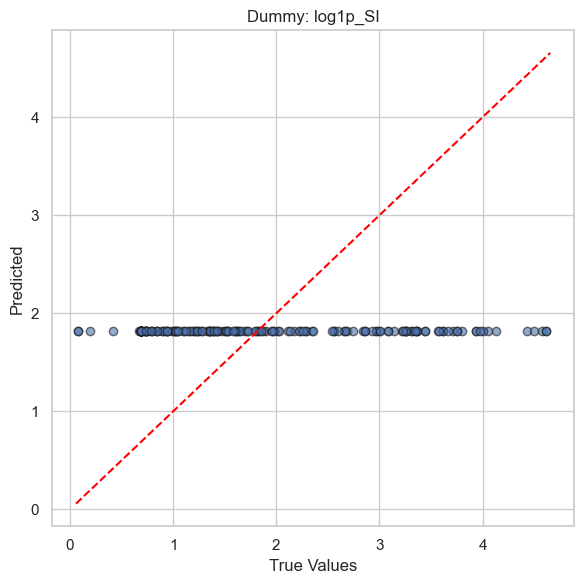

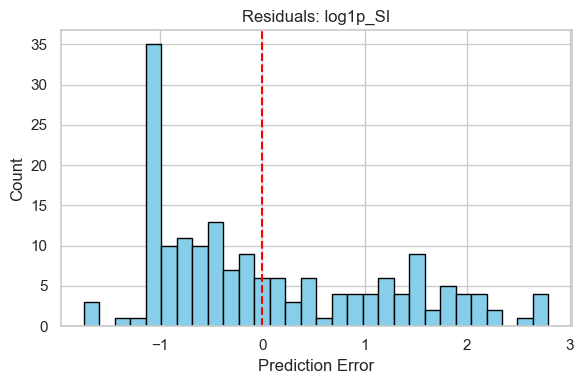

In [16]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Папка для графиков ===
os.makedirs("plotsjp/dummy", exist_ok=True)

# === Целевые переменные ===
targets = ["log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI"]

# === Основной цикл по каждому таргету ===
for target in targets:
    print(f"\n📊 Dummy Regressor Report — {target}")

    # 🎯 Таргет
    y = df[target]

    # 📦 Признаки — удаляем всё, что связано с таргетами и их бинаризацией
    X = df.drop(columns=[
        "IC50_nM", "CC50_nM", "SI_corrected",
        "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
        "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"
    ], errors="ignore")

    # Только числовые признаки
    X = X.select_dtypes(include="number")

    # 📐 Разделение
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # === Dummy-модель (предсказывает среднее) ===
    dummy = DummyRegressor(strategy="mean")
    dummy.fit(X_train, y_train)
    y_pred = dummy.predict(X_test)

    # === Метрики
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # === Вывод
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"R²:   {r2:.4f}")

    # === График 1: y_true vs y_pred
    plt.figure(figsize=(6, 6))
    plt.scatter(y_test, y_pred, alpha=0.6, edgecolors="k")
    plt.plot([y.min(), y.max()], [y.min(), y.max()], color="red", linestyle="--")
    plt.xlabel("True Values")
    plt.ylabel("Predicted")
    plt.title(f"Dummy: {target}")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"plotsjp/dummy/{target}_scatter.png")
    plt.show()

    # === График 2: Распределение ошибок
    residuals = y_test - y_pred
    plt.figure(figsize=(6, 4))
    plt.hist(residuals, bins=30, color="skyblue", edgecolor="black")
    plt.axvline(0, color="red", linestyle="--")
    plt.xlabel("Prediction Error")
    plt.ylabel("Count")
    plt.title(f"Residuals: {target}")
    plt.tight_layout()
    plt.savefig(f"plotsjp/dummy/{target}_residuals.png")
    plt.show()


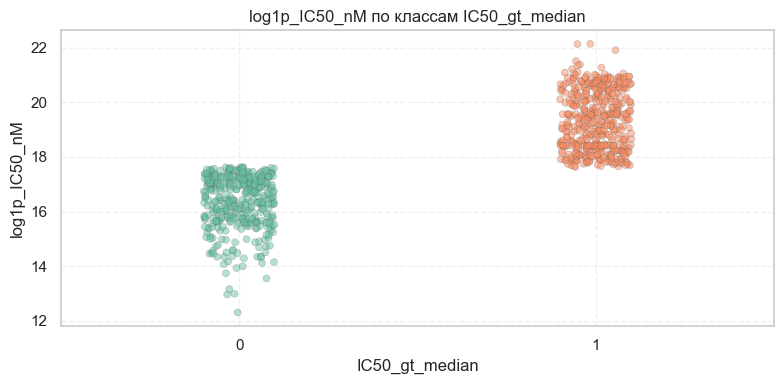

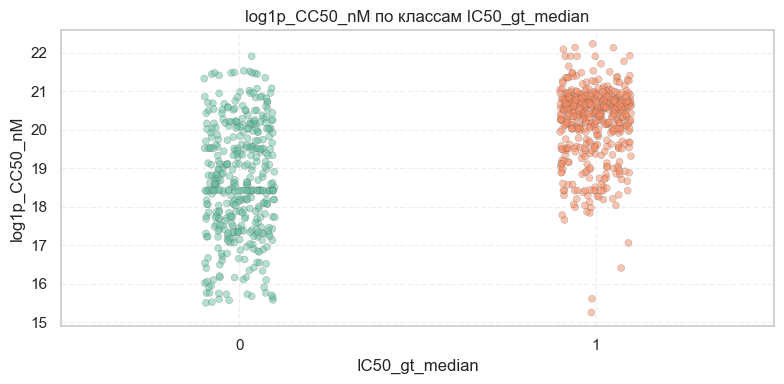

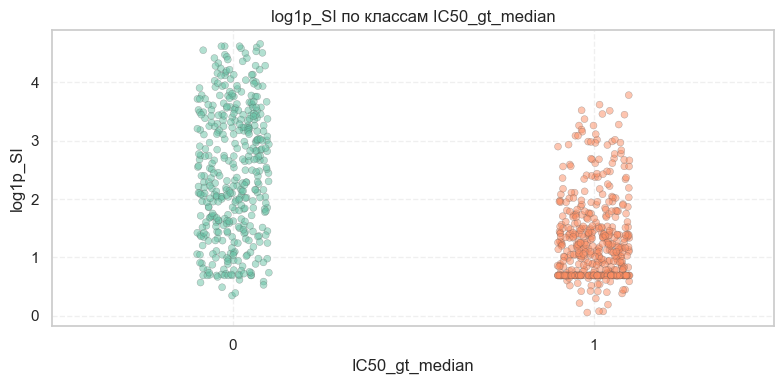

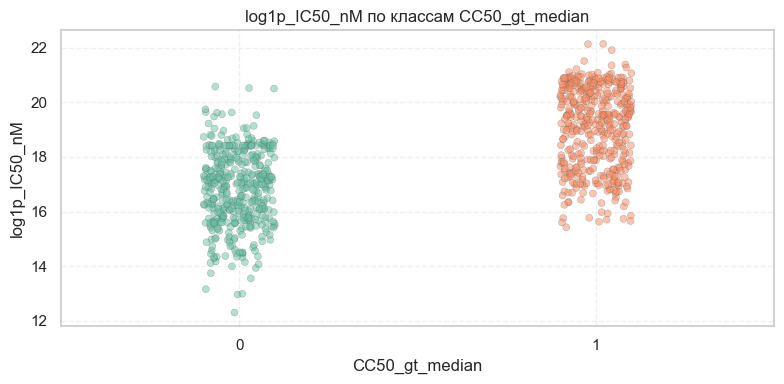

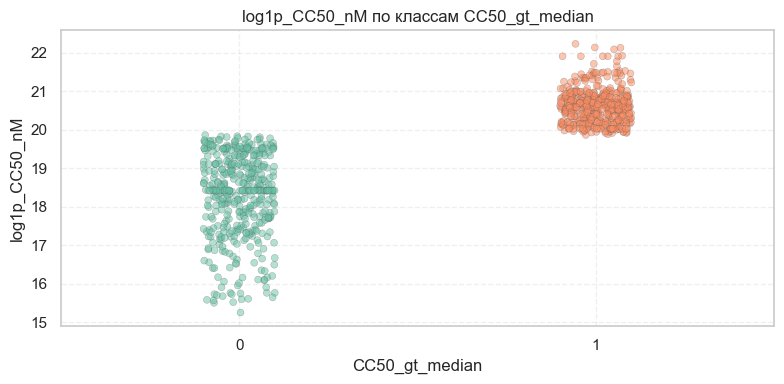

...

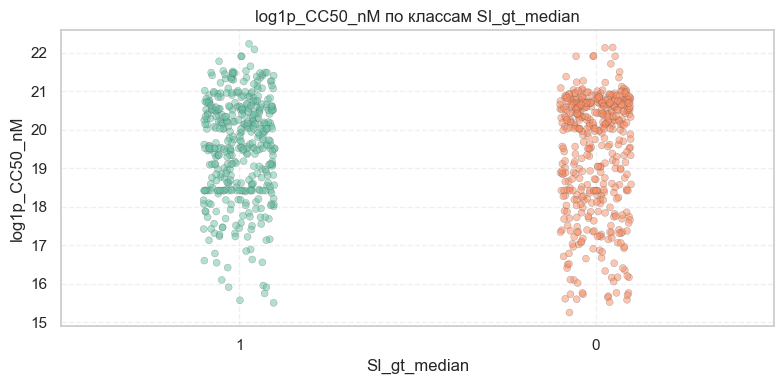

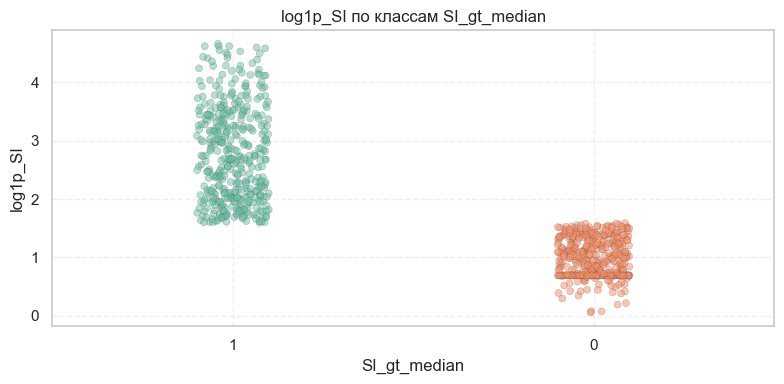

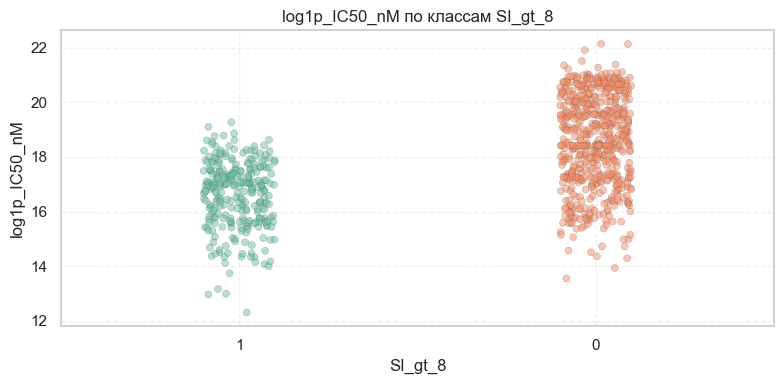

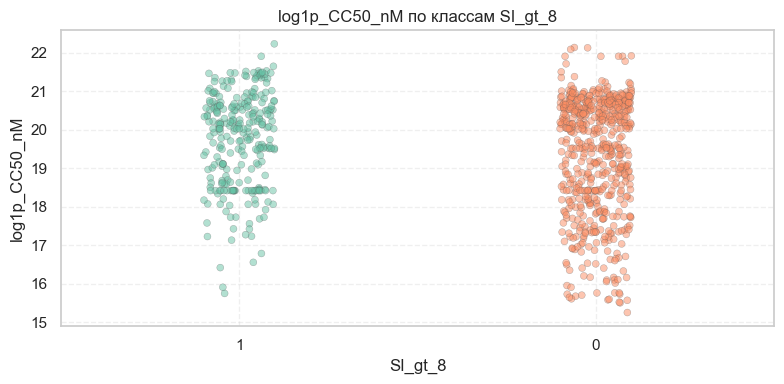

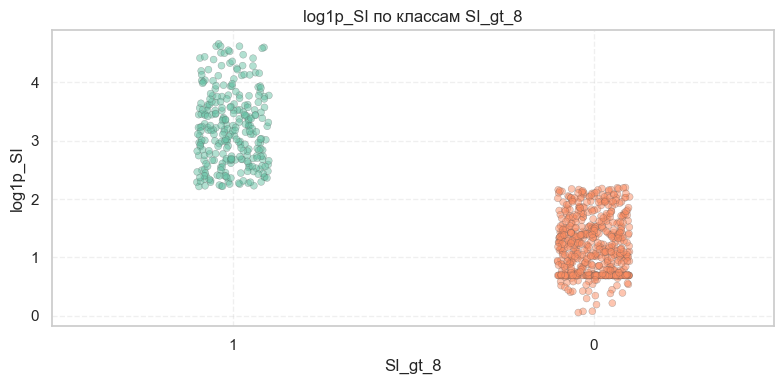

In [17]:
# === ЭТАП 2.3: Stripplot — визуальный анализ разделимости рег. таргетов по классам ===

import os
import seaborn as sns
import matplotlib.pyplot as plt

# === Шаг 2.3.1: Создание папки для графиков ===
os.makedirs("plotsjp/eda/targets/strip", exist_ok=True)

# === Шаг 2.3.2: Определение таргетов ===
reg_targets = ["log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI"]
binary_targets = ["IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"]

# === Шаг 2.3.3: Цикл построения графиков stripplot ===
for hue_target in binary_targets:
    for reg_col in reg_targets:
        plt.figure(figsize=(8, 4))
        sns.stripplot(
            x=df[hue_target].astype(str),  # важно: x — категориальный
            y=df[reg_col],
            jitter=True,
            alpha=0.5,
            palette="Set2",
            edgecolor="gray",
            linewidth=0.3
        )
        plt.title(f"{reg_col} по классам {hue_target}")
        plt.xlabel(hue_target)
        plt.ylabel(reg_col)
        plt.grid(True, linestyle="--", alpha=0.3)
        plt.tight_layout()
        plt.savefig(f"plotsjp/eda/targets/strip/{reg_col}_by_{hue_target}.png")
        plt.show()


=== ЭТАП 3: Анализ бинарных классификационных меток ===


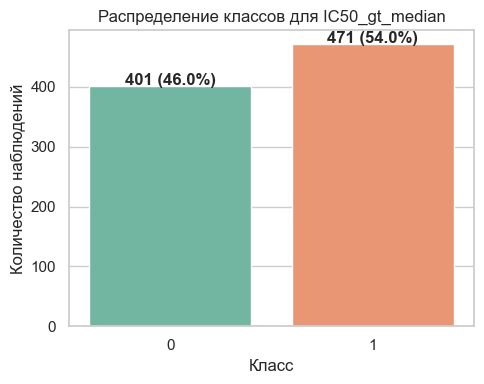

📌 IC50_gt_median:
  Класс 0: 401 наблюдений (45.99%)
  Класс 1: 471 наблюдений (54.01%)
--------------------------------------------------


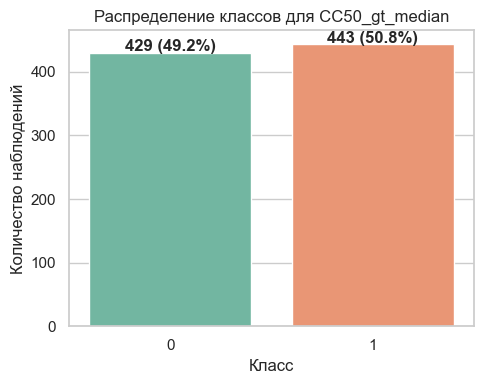

📌 CC50_gt_median:
  Класс 0: 429 наблюдений (49.20%)
  Класс 1: 443 наблюдений (50.80%)
--------------------------------------------------


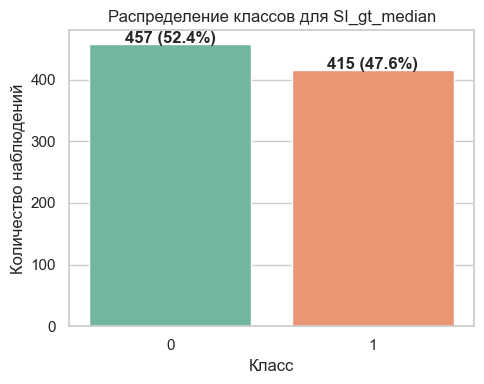

📌 SI_gt_median:
  Класс 0: 457 наблюдений (52.41%)
  Класс 1: 415 наблюдений (47.59%)
--------------------------------------------------


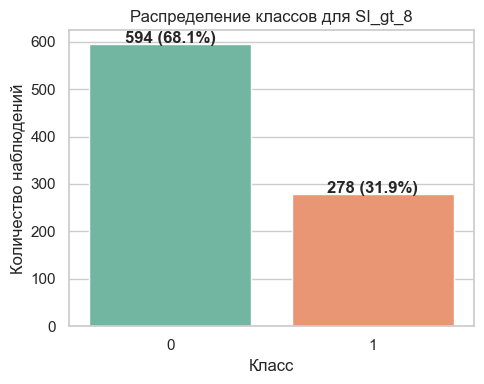

📌 SI_gt_8:
  Класс 0: 594 наблюдений (68.12%)
  Класс 1: 278 наблюдений (31.88%)
--------------------------------------------------


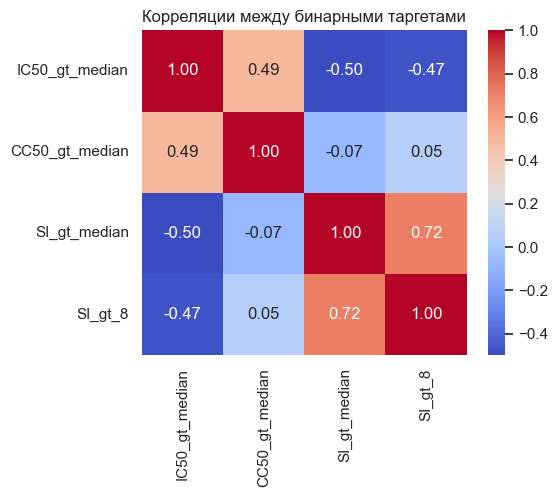

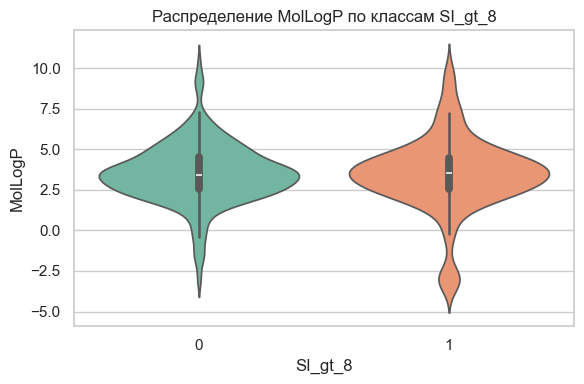


=== ЭТАП 3.4: DummyClassifier sanity check по ВСЕМ задачам классификации ===

🔍 DummyClassifier для задачи: IC50_gt_median
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        80
           1       0.54      1.00      0.70        95

    accuracy                           0.54       175
   macro avg       0.27      0.50      0.35       175
weighted avg       0.29      0.54      0.38       175



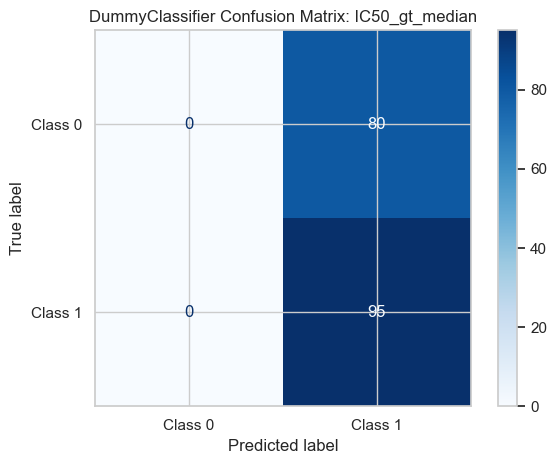


🔍 DummyClassifier для задачи: CC50_gt_median
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        86
           1       0.51      1.00      0.67        89

    accuracy                           0.51       175
   macro avg       0.25      0.50      0.34       175
weighted avg       0.26      0.51      0.34       175



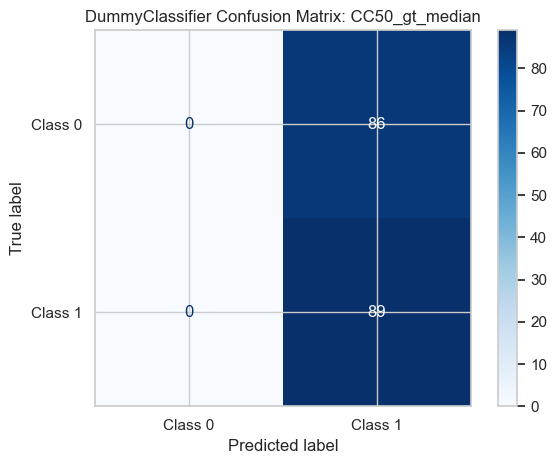


🔍 DummyClassifier для задачи: SI_gt_median
              precision    recall  f1-score   support

           0       0.53      1.00      0.69        92
           1       0.00      0.00      0.00        83

    accuracy                           0.53       175
   macro avg       0.26      0.50      0.34       175
weighted avg       0.28      0.53      0.36       175



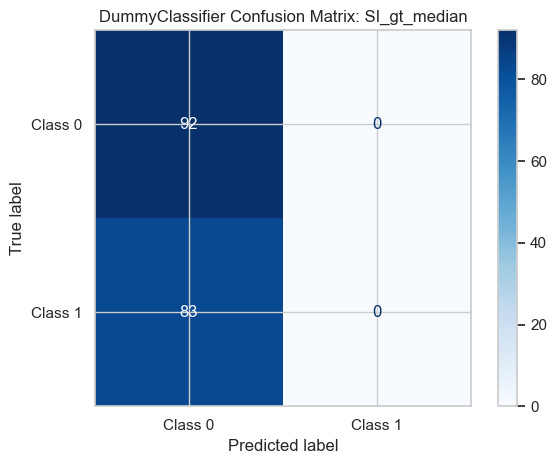


🔍 DummyClassifier для задачи: SI_gt_8
              precision    recall  f1-score   support

           0       0.68      1.00      0.81       119
           1       0.00      0.00      0.00        56

    accuracy                           0.68       175
   macro avg       0.34      0.50      0.40       175
weighted avg       0.46      0.68      0.55       175



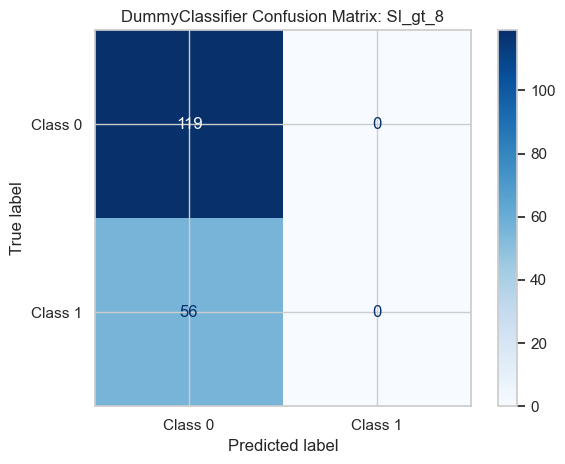

In [18]:
print("=== ЭТАП 3: Анализ бинарных классификационных меток ===")

import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split

# 📁 Папки для сохранения графиков
os.makedirs("plots/eda/classification_targets", exist_ok=True)
os.makedirs("plots/eda/classification_targets/analysis", exist_ok=True)

# 📌 Бинарные метки из задачи
binary_targets = ["IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"]

# === 3.1: Распределение классов для каждой метки ===
for col in binary_targets:
    counts = df[col].value_counts().sort_index()
    percentages = counts / counts.sum() * 100

    plt.figure(figsize=(5, 4))
    ax = sns.barplot(x=counts.index.astype(str), y=counts.values, palette="Set2")
    for i, (v, p) in enumerate(zip(counts.values, percentages.values)):
        ax.text(i, v + 3, f"{v} ({p:.1f}%)", ha='center', fontweight='bold')
    plt.title(f"Распределение классов для {col}")
    plt.xlabel("Класс"); plt.ylabel("Количество наблюдений")
    plt.tight_layout()
    plt.savefig(f"plots/eda/classification_targets/{col}_distribution.png")
    plt.show()

    print(f"📌 {col}:")
    for cls in counts.index:
        print(f"  Класс {cls}: {counts[cls]} наблюдений ({percentages[cls]:.2f}%)")
    print("-" * 50)

# === 3.2: Корреляции между бинарными метками ===
plt.figure(figsize=(6, 5))
corr = df[binary_targets].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Корреляции между бинарными таргетами")
plt.tight_layout()
plt.savefig("plots/eda/classification_targets/analysis/binary_targets_corr_heatmap.png")
plt.show()

# === 3.3: Violinplot признака MolLogP по классам SI_gt_8 ===
if "MolLogP" in df.columns:
    plt.figure(figsize=(6, 4))
    sns.violinplot(x="SI_gt_8", y="MolLogP", data=df, palette="Set2")
    plt.title("Распределение MolLogP по классам SI_gt_8")
    plt.tight_layout()
    plt.savefig("plots/eda/classification_targets/analysis/MolLogP_by_SI_gt_8.png")
    plt.show()

print("\n=== ЭТАП 3.4: DummyClassifier sanity check по ВСЕМ задачам классификации ===")

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# 📁 Папка для визуализации
os.makedirs("plots/eda/classification_targets/dummy_reports", exist_ok=True)

# 🔁 Обрабатываем все классификационные таргеты
for target_col in binary_targets:
    print(f"\n🔍 DummyClassifier для задачи: {target_col}")

    # Удаляем все таргеты и производные признаки из X
    drop_cols = binary_targets + ["IC50_nM", "CC50_nM", "SI_corrected"]
    X = df.drop(columns=drop_cols, errors="ignore").select_dtypes(include="number")
    y = df[target_col]

    # Стратифицированный train/test split
    stratify_y = y if y.nunique() >= 2 and y.value_counts().min() >= 2 else None
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=stratify_y)

    # Обучение DummyClassifier
    dummy = DummyClassifier(strategy="most_frequent")
    dummy.fit(X_train, y_train)
    y_pred = dummy.predict(X_test)

    # Текстовый отчет
    print(classification_report(y_test, y_pred, zero_division=0))

    # Confusion matrix plot
    cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Class 0", "Class 1"])
    disp.plot(cmap="Blues", values_format='d')
    plt.title(f"DummyClassifier Confusion Matrix: {target_col}")
    plt.tight_layout()
    plt.savefig(f"plots/eda/classification_targets/dummy_reports/{target_col}_confusion_matrix.png")
    plt.show()



=== ЭТАП 4: Feature Engineering и фильтрация признаков ===

📌 Добавляем новые признаки:
✅ EState_Delta
✅ HAcceptors_to_HDonors_Ratio
✅ MolLogP_sq
✅ MolWt_x_TPSA

🔢 Числовых признаков до фильтрации: 213
⚠️ Признаков с >30% NaN: 0
❌ Константные признаки: 18
⚠️ Низковариативные признаки (< 0.01): 18
🧹 Удаляется всего: 18 признаков
✅ После удаления: 202 колонок


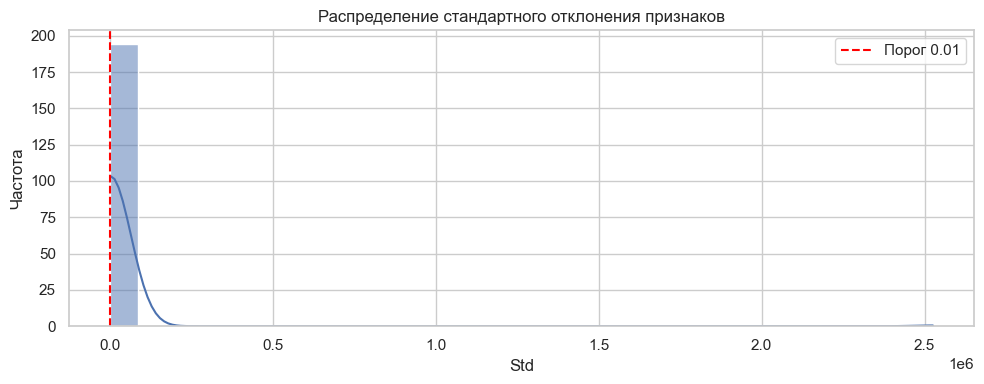

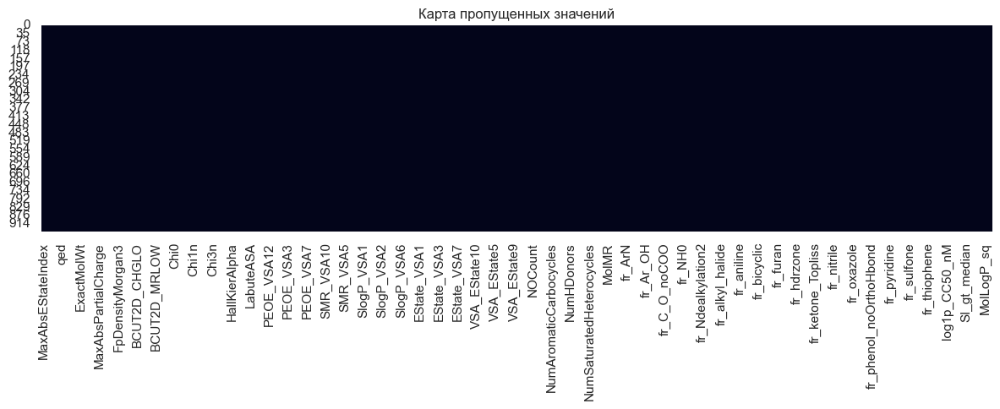

✅ Пропущенных значений в числовых признаках нет.
💾 Сохранено: data/data_clean_pruned.csv


In [19]:
# === ЭТАП 4: Feature Engineering и предварительная фильтрация признаков ===
print("\n=== ЭТАП 4: Feature Engineering и фильтрация признаков ===")

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer

# 📁 Каталоги
os.makedirs("plots/eda/features", exist_ok=True)
os.makedirs("data/features", exist_ok=True)

# 🎯 Целевые переменные (не признаки)
target_cols = [
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"
]

# === 4.1: Feature Engineering ===
print("\n📌 Добавляем новые признаки:")
if "MaxEStateIndex" in df.columns and "MinEStateIndex" in df.columns:
    df["EState_Delta"] = df["MaxEStateIndex"] - df["MinEStateIndex"]
    print("✅ EState_Delta")
if "NumHAcceptors" in df.columns and "NumHDonors" in df.columns:
    df["HAcceptors_to_HDonors_Ratio"] = df["NumHAcceptors"] / (df["NumHDonors"] + 1e-6)
    print("✅ HAcceptors_to_HDonors_Ratio")
if "MolLogP" in df.columns:
    df["MolLogP_sq"] = df["MolLogP"] ** 2
    print("✅ MolLogP_sq")
if "MolWt" in df.columns and "TPSA" in df.columns:
    df["MolWt_x_TPSA"] = df["MolWt"] * df["TPSA"]
    print("✅ MolWt_x_TPSA")

# === 4.2: Предварительный отбор числовых признаков ===
X = df.select_dtypes(include=[np.number]).drop(columns=target_cols, errors="ignore")
print(f"\n🔢 Числовых признаков до фильтрации: {X.shape[1]}")

# === 4.3: Удаление признаков с >30% NaN ===
nan_ratio = X.isna().mean()
nan_features = nan_ratio[nan_ratio > 0.3].index.tolist()
print(f"⚠️ Признаков с >30% NaN: {len(nan_features)}")

# === 4.4: Константные признаки ===
constant_features = X.columns[X.nunique(dropna=False) <= 1].tolist()
print(f"❌ Константные признаки: {len(constant_features)}")

# === 4.5: Низковариативные признаки (std < 0.01) ===
low_variance_features = X.columns[X.std() < 0.01].tolist()
print(f"⚠️ Низковариативные признаки (< 0.01): {len(low_variance_features)}")

# === 4.6: Финальный список к удалению ===
bad_features = sorted(set(nan_features + constant_features + low_variance_features))
print(f"🧹 Удаляется всего: {len(bad_features)} признаков")

with open("data/features/features_to_remove_preliminary.txt", "w") as f:
    for feat in bad_features:
        f.write(f"{feat}\n")

df = df.drop(columns=bad_features, errors="ignore")
print(f"✅ После удаления: {df.shape[1]} колонок")

# === 4.7: Визуализация std распределений ===
plt.figure(figsize=(10, 4))
X_std = df.select_dtypes(include=[np.number]).drop(columns=target_cols, errors="ignore").std()
sns.histplot(X_std, bins=30, kde=True)
plt.axvline(0.01, color='red', linestyle='--', label='Порог 0.01')
plt.title("Распределение стандартного отклонения признаков")
plt.xlabel("Std")
plt.ylabel("Частота")
plt.legend()
plt.tight_layout()
plt.savefig("plots/eda/features/std_distribution.png")
plt.show()

# === 4.8: Heatmap пропусков ===
plt.figure(figsize=(12, 5))
sns.heatmap(df.isnull(), cbar=False)
plt.title("Карта пропущенных значений")
plt.tight_layout()
plt.savefig("plots/eda/features/missing_heatmap.png")
plt.show()

# === 4.9: Импутация NaN средним ===
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
if df[num_cols].isnull().any().any():
    imputer = SimpleImputer(strategy="median")
    df[num_cols] = imputer.fit_transform(df[num_cols])
    print("✅ Пропущенные значения числовых признаков заполнены средним.")
else:
    print("✅ Пропущенных значений в числовых признаках нет.")

# === 4.10: Сохраняем очищенные данные ===
df.to_csv("data/data_clean_pruned.csv", index=False)
print("💾 Сохранено: data/data_clean_pruned.csv")


In [20]:
# Какие признаки остались
remaining_features = df.drop(columns=target_cols, errors='ignore').select_dtypes(include='number').columns.tolist()
print(f"Признаки после фильтрации: {remaining_features}")


Признаки после фильтрации: ['MaxAbsEStateIndex', 'MaxEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'MaxPartialCharge', 'MinPartialCharge', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA7', 'SMR_VSA9', 'SlogP_VSA1', 'SlogP_VSA10', 'SlogP_VSA11', 'S

In [21]:
df

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,log1p_CC50_nM,log1p_SI,IC50_gt_median,CC50_gt_median,SI_gt_median,SI_gt_8,EState_Delta,HAcceptors_to_HDonors_Ratio,MolLogP_sq,MolWt_x_TPSA
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,18.983049,3.371597,0,0,1,1,4.706871,2.000000e+06,50.711489,9508.59744
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,15.502432,2.079442,0,0,1,0,3.427548,9.999995e-01,37.891411,9351.73704
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,18.897799,0.542324,1,0,0,0,2.083887,0.000000e+00,50.825493,0.00000
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,18.496304,4.162553,0,0,1,1,4.706757,2.000000e+06,56.419628,9855.34488
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,18.751932,0.832909,1,0,0,0,4.880034,2.000000e+06,83.079579,11537.14536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
944,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,...,17.370849,0.755660,0,0,0,0,13.411033,5.000000e+06,18.491720,28881.14114
945,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,...,17.341854,0.723911,0,0,0,0,14.334700,5.999994e+00,14.477264,47964.78617
946,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,210,...,17.341855,0.740394,0,0,0,0,14.642480,6.999993e+00,20.594352,53902.93734
947,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,208,...,17.312007,0.708662,0,0,0,0,15.238832,9.000000e+06,11.322552,63902.58145


In [22]:
# === Проверка признаков 
with open("data/features/features_to_remove_preliminary.txt") as f:
    bad_features = [line.strip() for line in f]
print(f"🧾 Удалено признаков: {len(bad_features)}")
print(bad_features[:10])  # посмотри первые 10


# Примеры: просматриваем вручную
for col in bad_features:
    if "VSA" in col or "BCUT" in col or "MolWt" in col or "qed" in col or "fr_" in col:
        print("⚠️ Возможно удалён важный признак:", col)

for col in bad_features:
    print(f"{col} → std = {X[col].std():.6f}, unique = {X[col].nunique()}")



🧾 Удалено признаков: 18
['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine']
⚠️ Возможно удалён важный признак: SMR_VSA8
⚠️ Возможно удалён важный признак: SlogP_VSA9
⚠️ Возможно удалён важный признак: fr_N_O
⚠️ Возможно удалён важный признак: fr_SH
⚠️ Возможно удалён важный признак: fr_azide
⚠️ Возможно удалён важный признак: fr_barbitur
⚠️ Возможно удалён важный признак: fr_benzodiazepine
⚠️ Возможно удалён важный признак: fr_diazo
⚠️ Возможно удалён важный признак: fr_dihydropyridine
⚠️ Возможно удалён важный признак: fr_isocyan
⚠️ Возможно удалён важный признак: fr_isothiocyan
⚠️ Возможно удалён важный признак: fr_lactam
⚠️ Возможно удалён важный признак: fr_nitroso
⚠️ Возможно удалён важный признак: fr_phos_acid
⚠️ Возможно удалён важный признак: fr_phos_ester
⚠️ Возможно удалён важный признак: fr_prisulfonamd
⚠️ Возможно удалён важный признак: fr_thiocyan
NumRadicalElectrons → std = 

✅ Число признаков для MI: 195


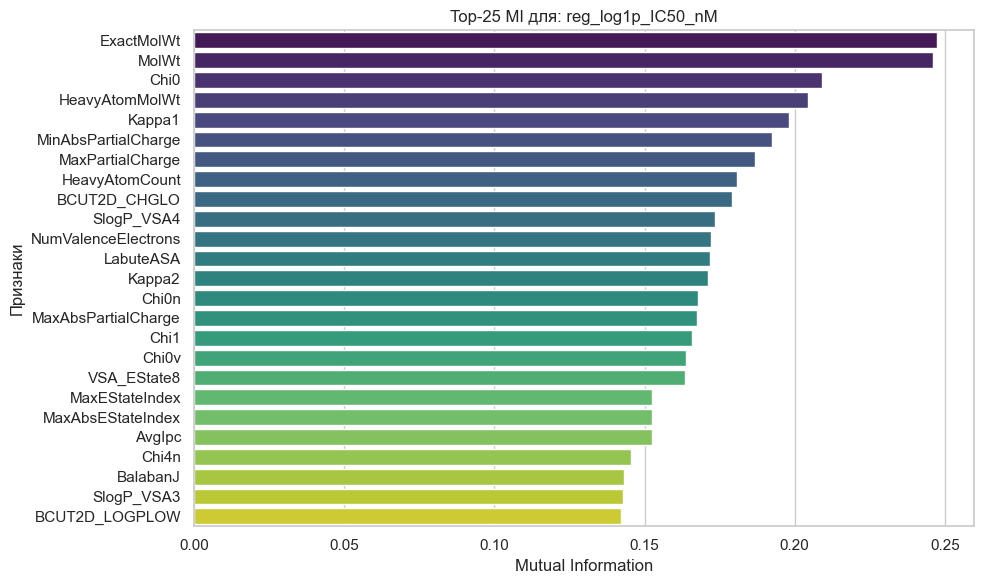

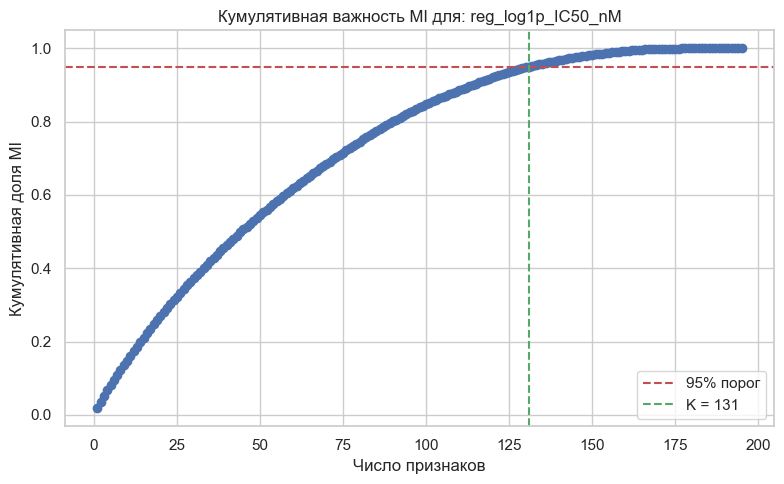

📌 reg_log1p_IC50_nM: выбрано 131 признаков. ✅


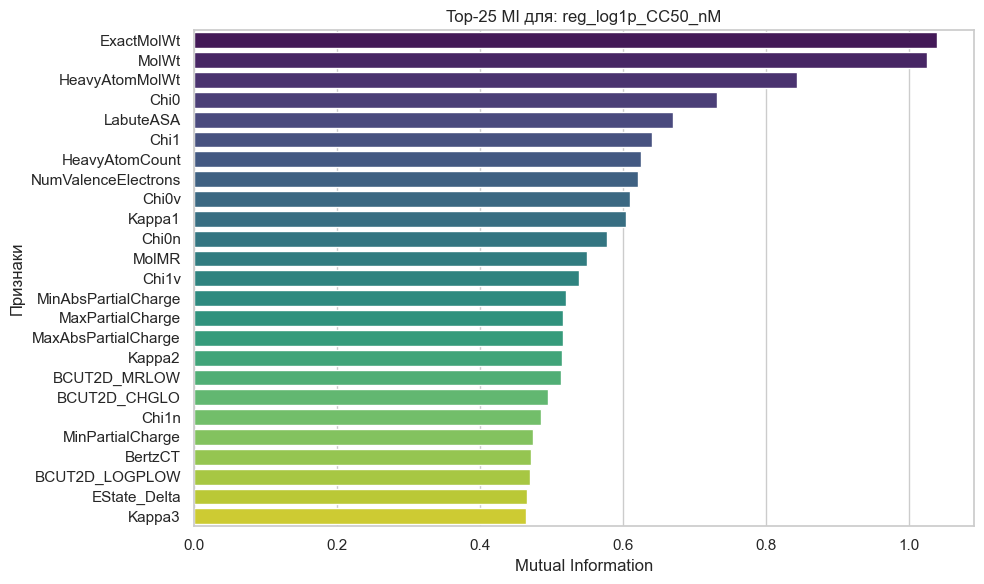

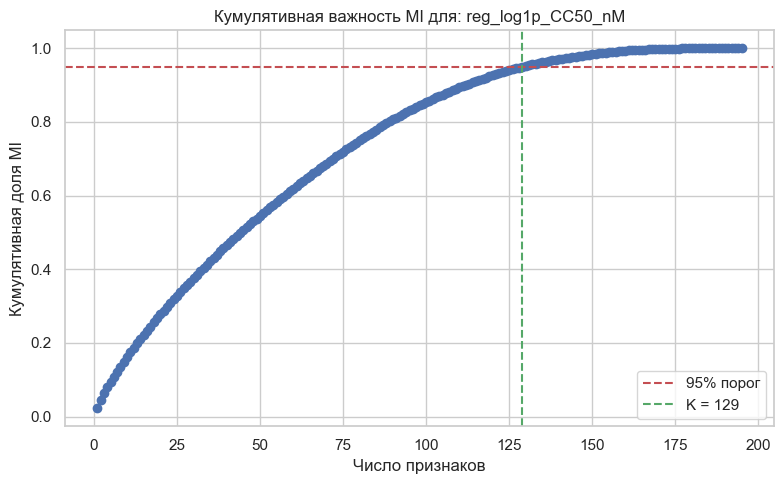

📌 reg_log1p_CC50_nM: выбрано 129 признаков. ✅


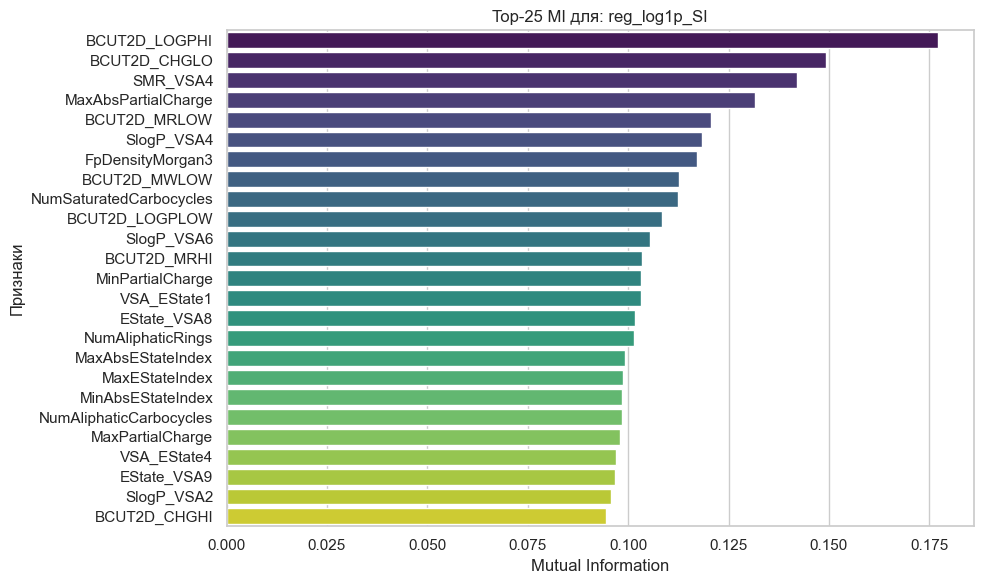

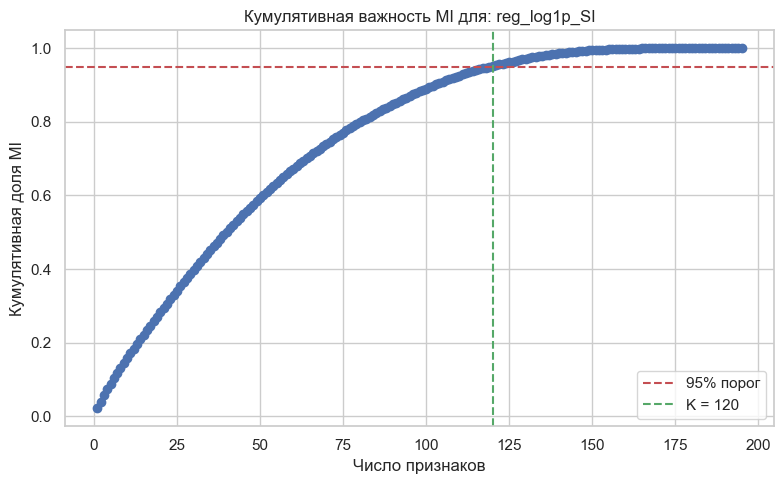

📌 reg_log1p_SI: выбрано 120 признаков. ✅


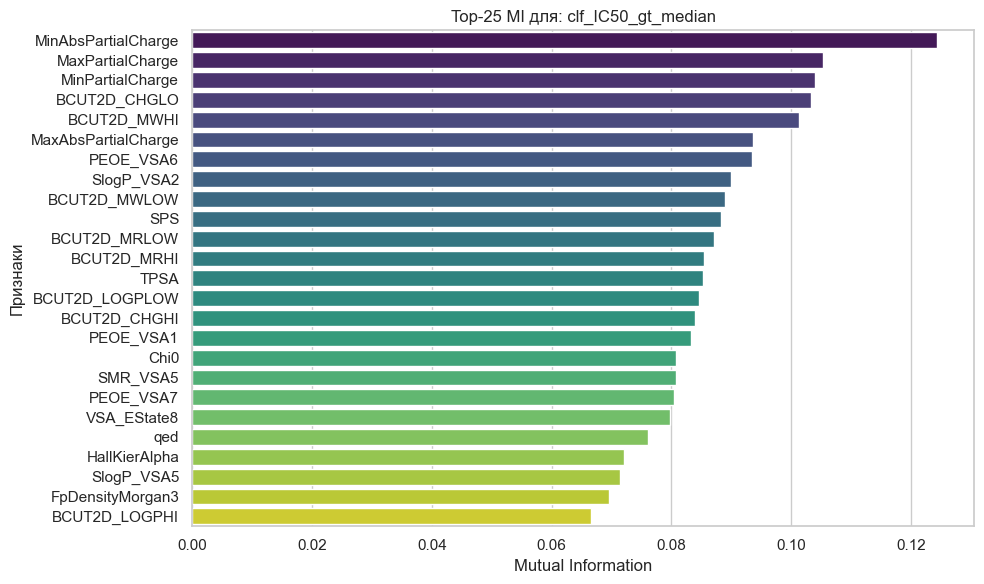

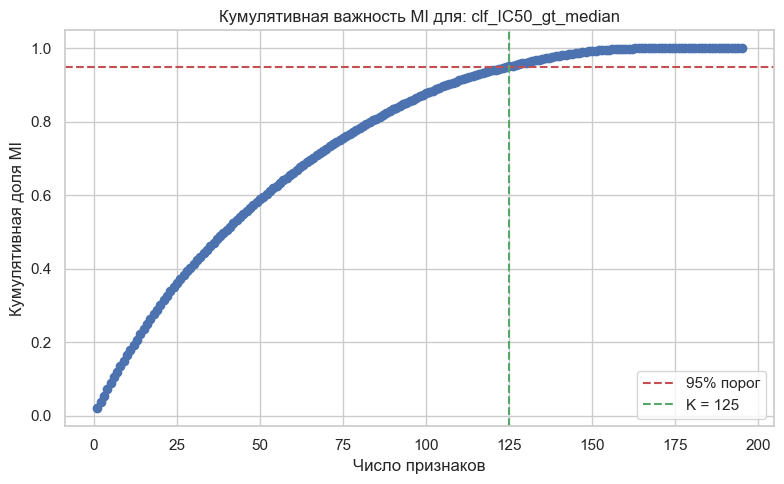

📌 clf_IC50_gt_median: выбрано 125 признаков. ✅


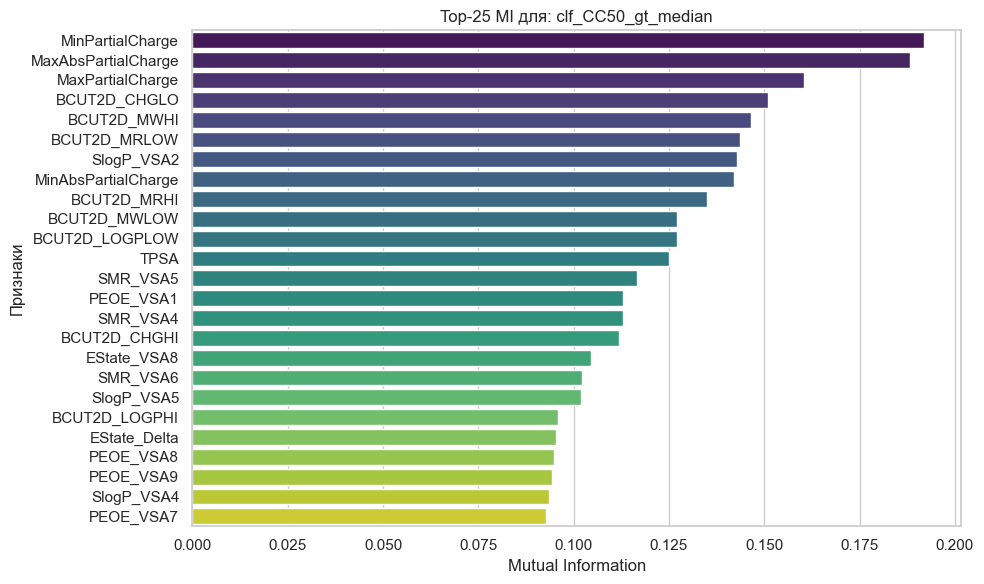

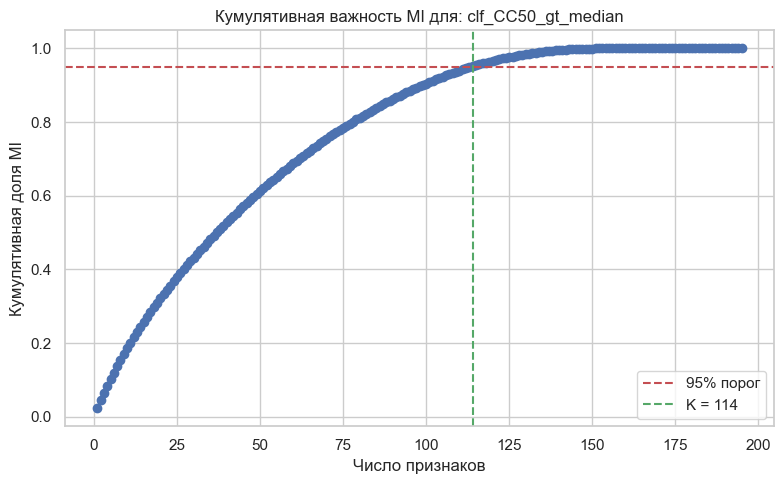

📌 clf_CC50_gt_median: выбрано 114 признаков. ✅


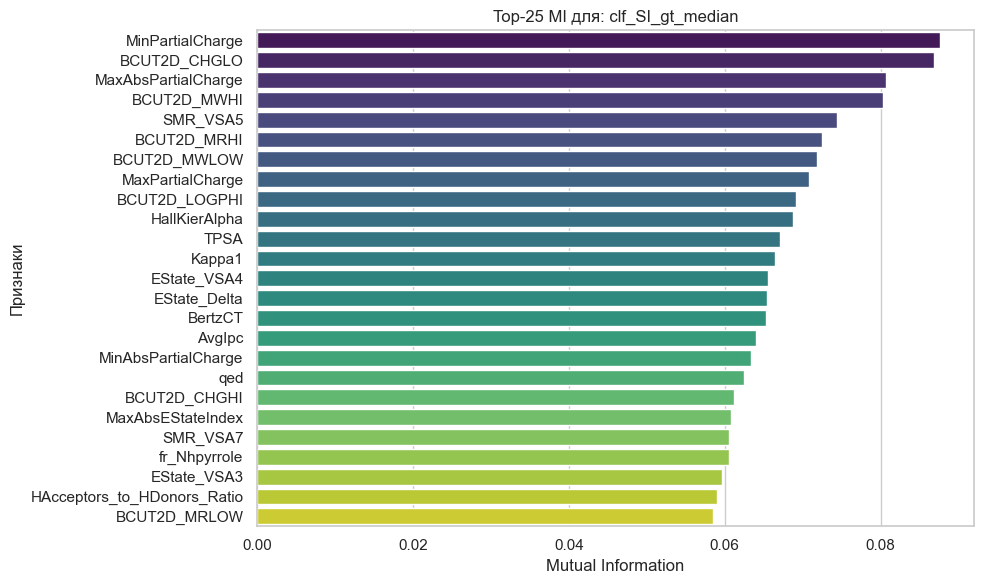

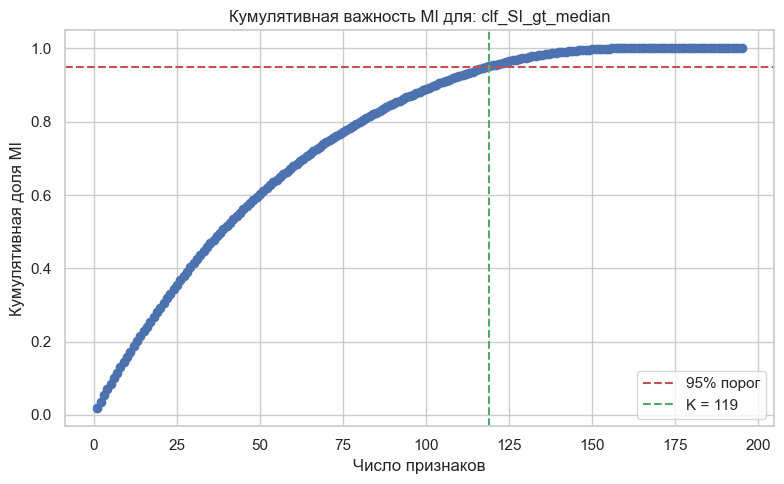

📌 clf_SI_gt_median: выбрано 119 признаков. ✅


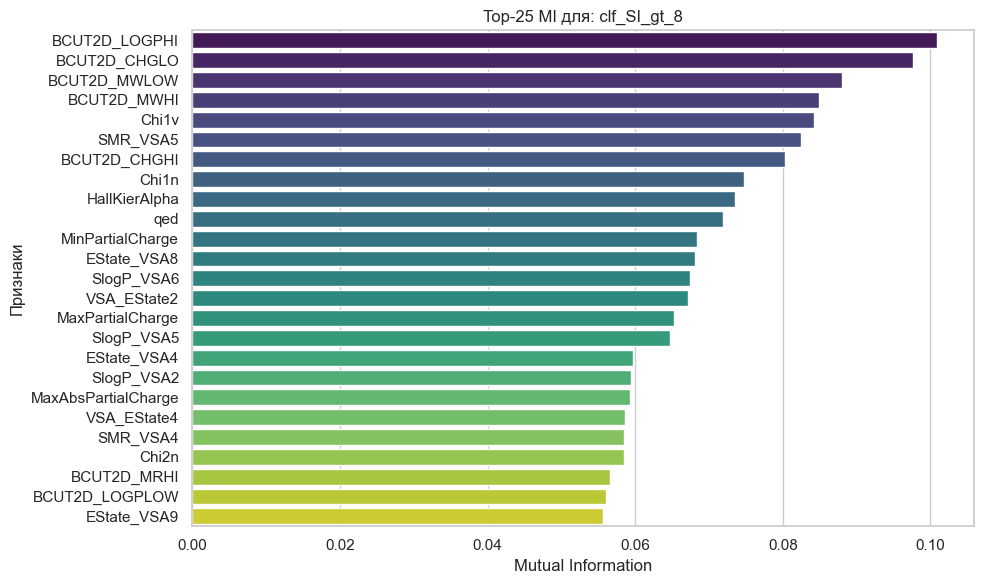

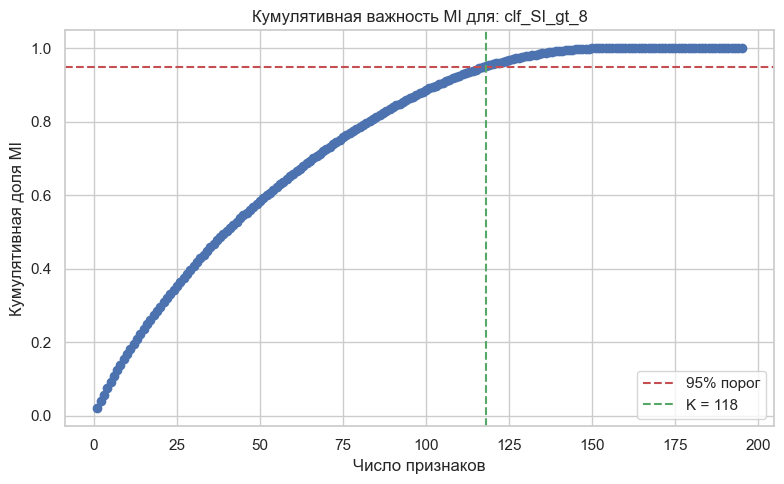

📌 clf_SI_gt_8: выбрано 118 признаков. ✅

=== Сводка по количеству отобранных признаков ===
reg_log1p_IC50_nM: 131 признаков
reg_log1p_CC50_nM: 129 признаков
reg_log1p_SI: 120 признаков
clf_IC50_gt_median: 125 признаков
clf_CC50_gt_median: 114 признаков
clf_SI_gt_median: 119 признаков
clf_SI_gt_8: 118 признаков


In [23]:
# === ЭТАП 5: Автоматический отбор признаков по MI с визуализацией ===

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

# 📁 Каталоги
os.makedirs("plots/eda/feature_importance", exist_ok=True)
os.makedirs("data/features", exist_ok=True)

# === Загрузка ===
df = pd.read_csv("data/data_clean_pruned.csv")

# === Таргеты ===
tasks = {
    "reg_log1p_IC50_nM": df["log1p_IC50_nM"],
    "reg_log1p_CC50_nM": df["log1p_CC50_nM"],
    "reg_log1p_SI": df["log1p_SI"],
    "clf_IC50_gt_median": df["IC50_gt_median"],
    "clf_CC50_gt_median": df["CC50_gt_median"],
    "clf_SI_gt_median": df["SI_gt_median"],
    "clf_SI_gt_8": df["SI_gt_8"],
}

forbidden_cols = [
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8",
    "IC50_nM", "CC50_nM", "SI_corrected"
]

# === X без таргетов ===
X = df.drop(columns=forbidden_cols, errors="ignore")
print(f"✅ Число признаков для MI: {X.shape[1]}")

# === Словарь с результатами MI
mi_all = {}

# === MI-анализ по задачам
for task_name, y in tasks.items():
    is_clf = task_name.startswith("clf_")
    mi = mutual_info_classif(X, y, random_state=42) if is_clf else mutual_info_regression(X, y, random_state=42)
    
    mi_series = pd.Series(mi, index=X.columns).sort_values(ascending=False)
    mi_all[task_name] = mi_series

    cumulative_mi = mi_series.cumsum() / mi_series.sum()
    optimal_k = (cumulative_mi < 0.95).sum() + 1
    top_features = mi_series.head(optimal_k)

    # 💾 Сохраняем
    top_features.to_csv(f"data/features/topMI_{task_name}.csv", header=["mutual_info"])
    with open(f"data/features/{task_name}.txt", "w") as f:
        for feat in top_features.index:
            f.write(f"{feat}\n")

    # 📊 Барплот
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_features.head(25).values, y=top_features.head(25).index, palette="viridis")
    plt.title(f"Top-25 MI для: {task_name}")
    plt.xlabel("Mutual Information")
    plt.ylabel("Признаки")
    plt.tight_layout()
    plt.savefig(f"plots/eda/feature_importance/top25_{task_name}.png")
    plt.show()

    # 📈 Кумулятивная важность
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(cumulative_mi)+1), cumulative_mi.values, marker='o')
    plt.axhline(0.95, color='r', linestyle='--', label='95% порог')
    plt.axvline(optimal_k, color='g', linestyle='--', label=f"K = {optimal_k}")
    plt.title(f"Кумулятивная важность MI для: {task_name}")
    plt.xlabel("Число признаков")
    plt.ylabel("Кумулятивная доля MI")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"plots/eda/feature_importance/cumulative_MI_{task_name}.png")
    plt.show()

    print(f"📌 {task_name}: выбрано {optimal_k} признаков. ✅")

# === Финальная сводка
print("\n=== Сводка по количеству отобранных признаков ===")
for task_name, mi_series in mi_all.items():
    k = (mi_series.cumsum() / mi_series.sum() < 0.95).sum() + 1
    print(f"{task_name}: {k} признаков")


In [24]:
# === Печать top-25 признаков по MI для каждой задачи ===
print("\n=== ТОП-25 признаков по MI для каждой задачи ===")
for task_name, mi_series in mi_all.items():
    print(f"\n📌 {task_name} — top 25 признаков:")
    top25 = mi_series.head(25)
    for i, (feat, score) in enumerate(top25.items(), 1):
        print(f"{i:2d}. {feat:<30} → MI = {score:.4f}")



=== ТОП-25 признаков по MI для каждой задачи ===

📌 reg_log1p_IC50_nM — top 25 признаков:
 1. ExactMolWt                     → MI = 0.2473
 2. MolWt                          → MI = 0.2459
 3. Chi0                           → MI = 0.2091
 4. HeavyAtomMolWt                 → MI = 0.2044
 5. Kappa1                         → MI = 0.1982
 6. MinAbsPartialCharge            → MI = 0.1923
 7. MaxPartialCharge               → MI = 0.1866
 8. HeavyAtomCount                 → MI = 0.1806
 9. BCUT2D_CHGLO                   → MI = 0.1792
10. SlogP_VSA4                     → MI = 0.1733
11. NumValenceElectrons            → MI = 0.1720
12. LabuteASA                      → MI = 0.1717
13. Kappa2                         → MI = 0.1710
14. Chi0n                          → MI = 0.1679
15. MaxAbsPartialCharge            → MI = 0.1673
16. Chi1                           → MI = 0.1657
17. Chi0v                          → MI = 0.1637
18. VSA_EState8                    → MI = 0.1633
19. MaxEStateIndex         

📁 Сохранён общий рейтинг признаков: data/features/mi_rank_all_tasks.csv


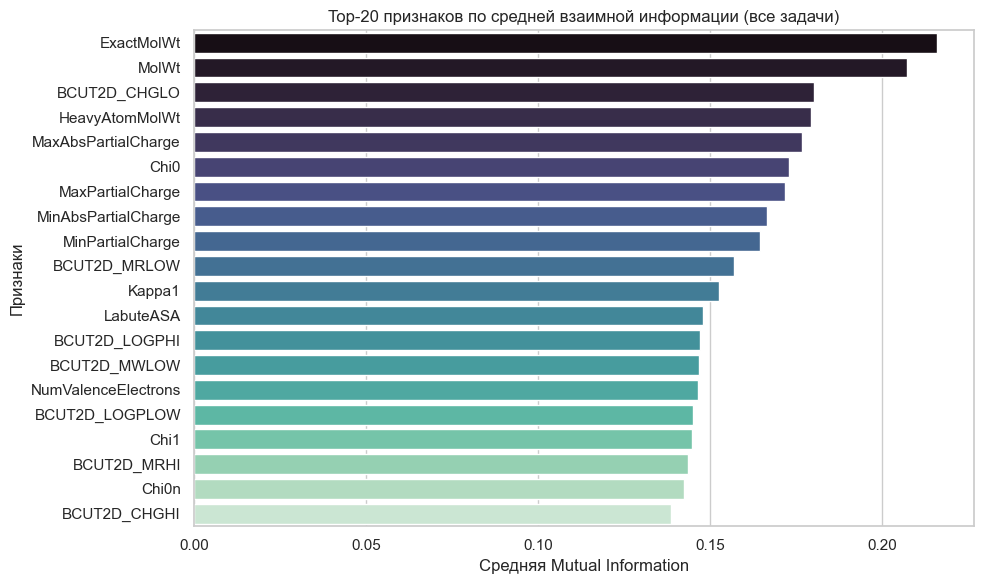

In [25]:
# === ЭТАП 5.2: Общий рейтинг признаков по средней MI (среди всех задач) ===

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# 📁 Создание папки для сохранения графиков
os.makedirs("plots/eda/feature_importance", exist_ok=True)

# === Список таргетов и производных от них, которые должны быть исключены ===
drop_cols = [
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8",
    "IC50_nM", "CC50_nM", "SI_corrected"
]

# === Построение таблицы: строки — признаки, столбцы — задачи ===
mi_df = pd.DataFrame(mi_all)

# === Жёсткая проверка на отсутствие утечек ===
for col in drop_cols:
    assert col not in mi_df.index, f"🚨 Утечка! Признак {col} попал в итоговую таблицу MI."

# ➕ Расчёт средней важности
mi_df["MI_avg"] = mi_df.mean(axis=1)

# 📊 Сортировка по средней MI
mi_ranked = mi_df.sort_values("MI_avg", ascending=False)

# 💾 Сохранение полного рейтинга
mi_ranked.to_csv("data/features/mi_rank_all_tasks.csv")
print("📁 Сохранён общий рейтинг признаков: data/features/mi_rank_all_tasks.csv")

# === Визуализация Top-20 признаков ===
top_features = mi_ranked["MI_avg"].head(20)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_features.values, y=top_features.index, palette="mako")
plt.title("Top-20 признаков по средней взаимной информации (все задачи)")
plt.xlabel("Средняя Mutual Information")
plt.ylabel("Признаки")
plt.tight_layout()
plt.savefig("plots/eda/feature_importance/overall_MI_ranking.png")
plt.show()


In [26]:
df

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,log1p_CC50_nM,log1p_SI,IC50_gt_median,CC50_gt_median,SI_gt_median,SI_gt_8,EState_Delta,HAcceptors_to_HDonors_Ratio,MolLogP_sq,MolWt_x_TPSA
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,18.983049,3.371597,0,0,1,1,4.706871,2.000000e+06,50.711489,9508.59744
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,15.502432,2.079442,0,0,1,0,3.427548,9.999995e-01,37.891411,9351.73704
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,18.897799,0.542324,1,0,0,0,2.083887,0.000000e+00,50.825493,0.00000
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,18.496304,4.162553,0,0,1,1,4.706757,2.000000e+06,56.419628,9855.34488
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,18.751932,0.832909,1,0,0,0,4.880034,2.000000e+06,83.079579,11537.14536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,...,17.370849,0.755660,0,0,0,0,13.411033,5.000000e+06,18.491720,28881.14114
868,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,...,17.341854,0.723911,0,0,0,0,14.334700,5.999994e+00,14.477264,47964.78617
869,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,210,...,17.341855,0.740394,0,0,0,0,14.642480,6.999993e+00,20.594352,53902.93734
870,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,208,...,17.312007,0.708662,0,0,0,0,15.238832,9.000000e+06,11.322552,63902.58145


🔢 Признаков до финальной фильтрации: 195
✅ Средняя MI по всем задачам сохранена: data/features/mi_reg_avg.csv


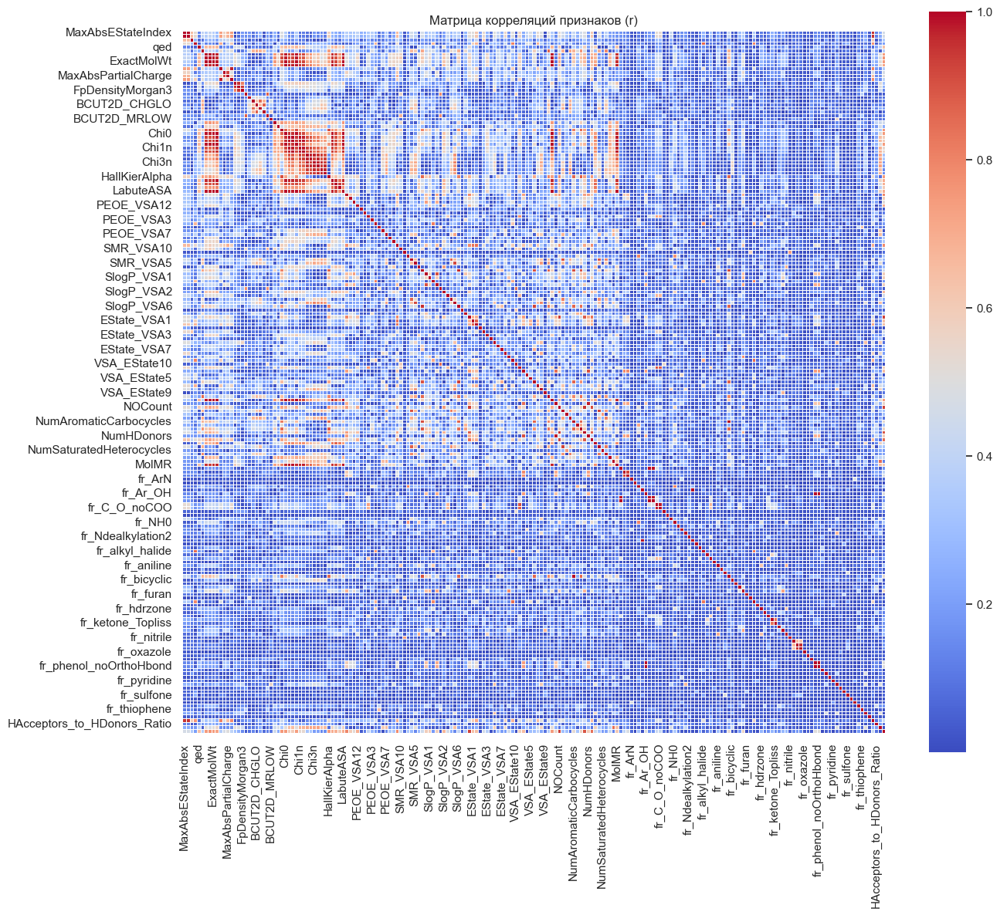

📊 Матрица корреляций сохранена: plots/eda/feature_importance/correlation_matrix.png
🔗 Найдено пар с r > 0.95: 90
🗑️ Финально удаляем по MI: 30 признаков
💾 Финальный датасет сохранён: data/data_final.csv (⏱ 172 признаков)
📝 Таблица удалённых признаков сохранена: data/features/deleted_features_with_reasons.csv

🔎 Пример удалённых признаков:
   dropped_feature         kept_feature  correlation  MI_dropped   MI_kept  \
2            MolWt           ExactMolWt     0.999998    0.207217  0.216028   
3   HeavyAtomMolWt           ExactMolWt     0.996327    0.179505  0.216028   
1   HeavyAtomMolWt                MolWt     0.996359    0.179505  0.207217   
11            Chi0           ExactMolWt     0.986178    0.172882  0.216028   
12            Chi0  NumValenceElectrons     0.993958    0.172882  0.146434   

                                          reason  
2            r = 1.000, MolWt < ExactMolWt по MI  
3   r = 0.996, HeavyAtomMolWt < ExactMolWt по MI  
1        r = 0.996, HeavyAtomMolWt < 

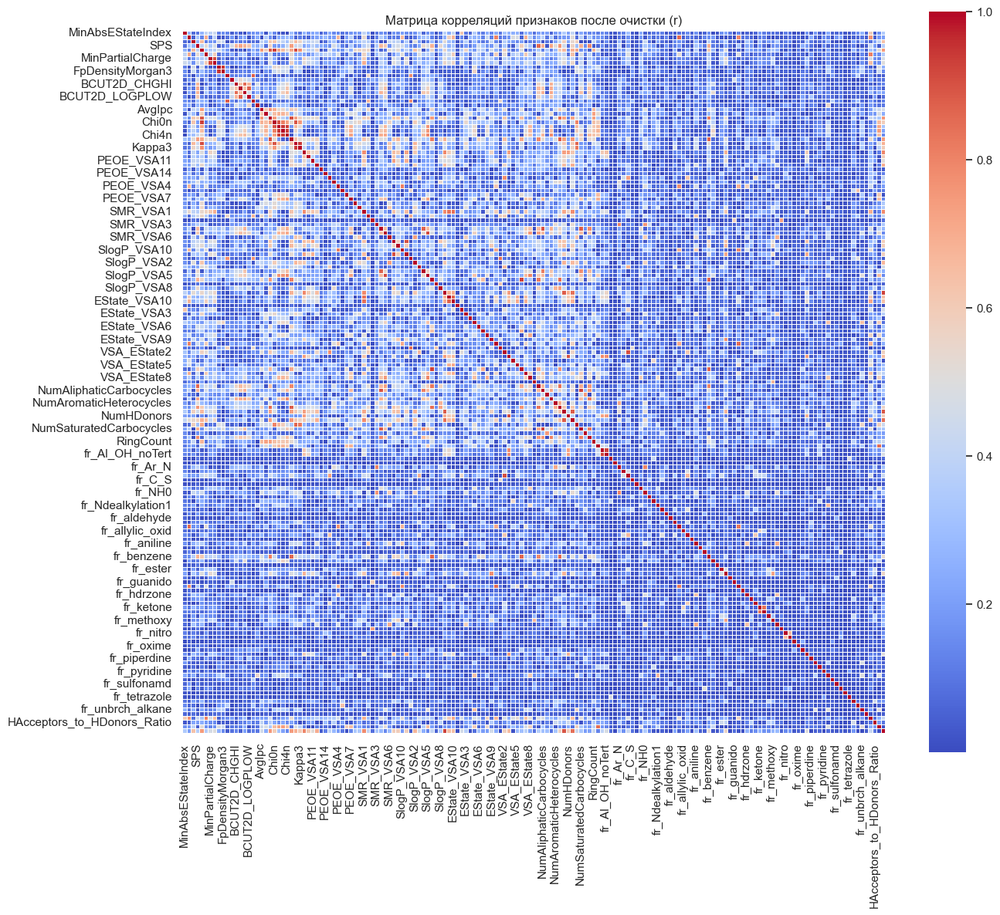

📊 Матрица корреляций сохранена: plots/eda/feature_importance/correlation_matrix_after.png


In [27]:
# === ЭТАП 6: Финальное удаление признаков по высокой корреляции (r > 0.95) с приоритетом MI (по всем задачам) ===

import pandas as pd
import numpy as np
import os
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

# === Загрузка очищенных данных ===
df = pd.read_csv("data/data_clean_pruned.csv")

# === Выделение признаков ===
drop_cols = [
    "IC50_nM", "CC50_nM", "SI_corrected",
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"
]
X = df.drop(columns=drop_cols, errors="ignore")
print(f"🔢 Признаков до финальной фильтрации: {X.shape[1]}")

# === Расчёт MI по 7 задачам ===
mi_df = pd.DataFrame(index=X.columns)
mi_df["reg_IC50"] = mutual_info_regression(X, df["log1p_IC50_nM"], random_state=42)
mi_df["reg_CC50"] = mutual_info_regression(X, df["log1p_CC50_nM"], random_state=42)
mi_df["reg_SI"] = mutual_info_regression(X, df["log1p_SI"], random_state=42)
mi_df["clf_IC50"] = mutual_info_classif(X, df["IC50_gt_median"], random_state=42)
mi_df["clf_CC50"] = mutual_info_classif(X, df["CC50_gt_median"], random_state=42)
mi_df["clf_SI"] = mutual_info_classif(X, df["SI_gt_median"], random_state=42)
mi_df["clf_SI_gt_8"] = mutual_info_classif(X, df["SI_gt_8"], random_state=42)
mi_df["MI_avg"] = mi_df.mean(axis=1)

# 💾 Сохраняем таблицу MI
mi_df.to_csv("data/features/mi_reg_avg.csv")
print("✅ Средняя MI по всем задачам сохранена: data/features/mi_reg_avg.csv")

# === Поиск пар с высокой корреляцией (> 0.95) ===
corr_matrix = X.corr().abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# === 🔥 Визуализация корреляционной матрицы ===
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    annot=False,
    fmt=".2f",
    cbar=True,
    square=True,
    linewidths=0.5
)
plt.title("Матрица корреляций признаков (r)")
plt.tight_layout()
plt.savefig("plots/eda/feature_importance/correlation_matrix.png")
plt.show()
print("📊 Матрица корреляций сохранена: plots/eda/feature_importance/correlation_matrix.png")


high_corr_pairs = [
    (col, row, upper_tri.loc[row, col])
    for col in upper_tri.columns
    for row in upper_tri.index
    if pd.notnull(upper_tri.loc[row, col]) and upper_tri.loc[row, col] > 0.95
]
print(f"🔗 Найдено пар с r > 0.95: {len(high_corr_pairs)}")

# === Удаление признаков на основе MI_avg ===
features_to_drop_final = set()

for a, b, r in high_corr_pairs:
    if a in features_to_drop_final or b in features_to_drop_final:
        continue
    if mi_df.loc[a, "MI_avg"] >= mi_df.loc[b, "MI_avg"]:
        features_to_drop_final.add(b)
    else:
        features_to_drop_final.add(a)

print(f"🗑️ Финально удаляем по MI: {len(features_to_drop_final)} признаков")

# 💾 Сохраняем список удалённых признаков
with open("data/features/high_corr_removed_by_MI.txt", "w") as f:
    for feat in sorted(features_to_drop_final):
        f.write(f"{feat}\n")

# === Обновляем датафрейм и сохраняем финальную версию
df_final = df.drop(columns=features_to_drop_final, errors="ignore")
df_final.to_csv("data/data_final.csv", index=False)
print(f"💾 Финальный датасет сохранён: data/data_final.csv (⏱ {df_final.shape[1]} признаков)")

# === 📋 Таблица удалённых признаков и обоснование ===
deleted_info = []
for a, b, r in high_corr_pairs:
    if a in features_to_drop_final:
        kept, dropped = b, a
    elif b in features_to_drop_final:
        kept, dropped = a, b
    else:
        continue
    deleted_info.append({
        "dropped_feature": dropped,
        "kept_feature": kept,
        "correlation": r,
        "MI_dropped": mi_df.loc[dropped, "MI_avg"],
        "MI_kept": mi_df.loc[kept, "MI_avg"],
        "reason": f"r = {r:.3f}, {dropped} < {kept} по MI"
    })

deleted_df = pd.DataFrame(deleted_info)
deleted_df = deleted_df.sort_values(by="MI_dropped", ascending=False)
deleted_df.to_csv("data/features/deleted_features_with_reasons.csv", index=False)
print("📝 Таблица удалённых признаков сохранена: data/features/deleted_features_with_reasons.csv")
print("\n🔎 Пример удалённых признаков:")
print(deleted_df.head())


# === 🔥 Матрица корреляций ПОСЛЕ удаления высоко коррелирующих признаков ===
import matplotlib.pyplot as plt
import seaborn as sns

corr_matrix_final = df_final.drop(columns=drop_cols, errors="ignore").corr().abs()

plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix_final,
    cmap="coolwarm",
    annot=False,
    fmt=".2f",
    cbar=True,
    square=True,
    linewidths=0.5
)
plt.title("Матрица корреляций признаков после очистки (r)")
plt.tight_layout()
plt.savefig("plots/eda/feature_importance/correlation_matrix_after.png")
plt.show()
print("📊 Матрица корреляций сохранена: plots/eda/feature_importance/correlation_matrix_after.png")


In [28]:
# Дополнительная проверка признакоа с высокой корреляцией > 0.90 - 0.94 

import pandas as pd
import numpy as np

# === Загрузка финального датасета ===
df_final = pd.read_csv("data/data_final.csv")

# === Список таргетов, которые не участвуют в проверке ===
drop_cols = [
    "IC50_nM", "CC50_nM", "SI_corrected",
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"
]

# === Выделение только признаков
X_final = df_final.drop(columns=drop_cols, errors="ignore")

# === Построение матрицы корреляций
corr_matrix = X_final.corr().abs()

# === Поиск пар с корреляцией выше порога
threshold = 0.94
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
high_corr = [
    (row, col, upper.loc[row, col])
    for row in upper.index
    for col in upper.columns
    if pd.notnull(upper.loc[row, col]) and upper.loc[row, col] > threshold
]

# === Вывод
if high_corr:
    print(f"🚨 Обнаружено {len(high_corr)} пар признаков с r > {threshold}:")
    for a, b, r in high_corr:
        print(f"{a} ↔ {b} → r = {r:.3f}")
else:
    print(f"✅ Нет пар признаков с корреляцией выше {threshold}")


# Проверка пар с корреляцией выше 0.9, 0.92, 0.94, 0.96
for threshold in [0.90, 0.91, 0.92, 0.93, 0.94, 0.95]:
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    high_corr = [
        (row, col, upper.loc[row, col])
        for row in upper.index
        for col in upper.columns
        if pd.notnull(upper.loc[row, col]) and upper.loc[row, col] > threshold
    ]
    print(f"\n🔎 Коррелирующие пары при пороге r > {threshold}: {len(high_corr)}")
    if high_corr:
        for a, b, r in high_corr[:5]:
            print(f"→ {a} и {b}: r = {r:.3f}")

🚨 Обнаружено 3 пар признаков с r > 0.94:
FpDensityMorgan2 ↔ FpDensityMorgan3 → r = 0.944
Chi2n ↔ Chi3v → r = 0.947
Kappa2 ↔ Kappa3 → r = 0.942

🔎 Коррелирующие пары при пороге r > 0.9: 17
→ ExactMolWt и Chi0n: r = 0.930
→ ExactMolWt и Kappa2: r = 0.913
→ MinPartialCharge и MaxAbsPartialCharge: r = 0.917
→ FpDensityMorgan2 и FpDensityMorgan3: r = 0.944
→ BertzCT и HallKierAlpha: r = 0.909

🔎 Коррелирующие пары при пороге r > 0.91: 13
→ ExactMolWt и Chi0n: r = 0.930
→ ExactMolWt и Kappa2: r = 0.913
→ MinPartialCharge и MaxAbsPartialCharge: r = 0.917
→ FpDensityMorgan2 и FpDensityMorgan3: r = 0.944
→ Chi2n и Chi3v: r = 0.947

🔎 Коррелирующие пары при пороге r > 0.92: 10
→ ExactMolWt и Chi0n: r = 0.930
→ FpDensityMorgan2 и FpDensityMorgan3: r = 0.944
→ Chi2n и Chi3v: r = 0.947
→ Chi2n и Chi4n: r = 0.931
→ Chi3v и Chi4n: r = 0.937

🔎 Коррелирующие пары при пороге r > 0.93: 5
→ FpDensityMorgan2 и FpDensityMorgan3: r = 0.944
→ Chi2n и Chi3v: r = 0.947
→ Chi2n и Chi4n: r = 0.931
→ Chi3v и Chi4

In [29]:
# === Проверка и удаление выбросов до масштабирования ===

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [30]:
# # === Шаг 1: Загрузка исходных данных ===
# df = pd.read_csv("data/data_final.csv")

# # === Шаг 2: Анализ описательной статистики ===
# desc = df.describe().T.sort_values("max", ascending=False)
# display(desc.head(10))

# # === Шаг 3: Отбор признаков с подозрительно высокими значениями
# suspect_cols = desc[desc["max"] > 900].index.tolist()
# print(f"⚠️ Подозрительные признаки (max > 900): {suspect_cols}")

# # === Шаг 4: Удаление выбросов по 99.5 перцентилю
# df_filtered = df.copy()
# for col in suspect_cols:
#     threshold = df_filtered[col].quantile(0.995)
#     n_before = df_filtered.shape[0]
#     df_filtered = df_filtered[df_filtered[col] < threshold]
#     n_after = df_filtered.shape[0]
#     print(f"🧹 {col}: удалено {n_before - n_after} строк (порог: {threshold:.2f})")

# print(f"✅ Осталось строк после очистки: {df_filtered.shape[0]} из {df.shape[0]}")


# # === Шаг 6: Сохраняем очищенные данные ===
# df_filtered.to_csv("data/data_final.csv", index=False)

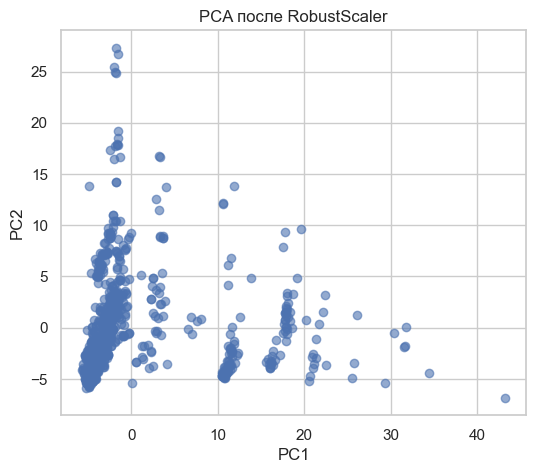

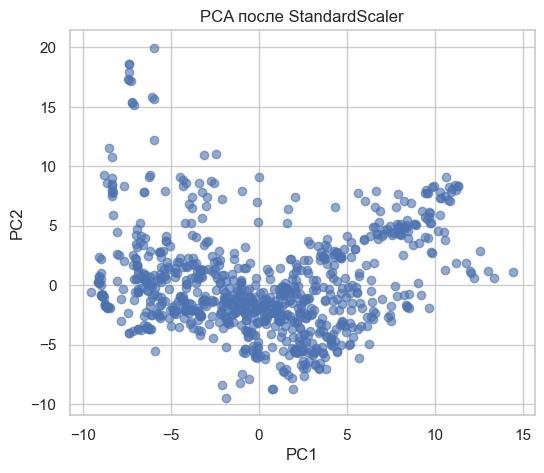

In [31]:
# === Загрузка данных и исключение таргетов ===
df = pd.read_csv("data/data_final.csv")
target_cols = [...]  # как выше
X = df.drop(columns=target_cols, errors="ignore")

# === Разделение на бинарные и не-бинарные признаки ===
binary_features = []
non_binary_features = []
for col in X.columns:
    unique_vals = sorted(X[col].dropna().unique())
    if set(unique_vals).issubset({0, 1}):
        binary_features.append(col)
    else:
        non_binary_features.append((col, len(unique_vals), unique_vals))

scale_features = [col for col, _, _ in non_binary_features]

# === Масштабирование только не-бинарных признаков (Robust) ===
X_robust = X.copy()
X_robust[scale_features] = RobustScaler().fit_transform(X_robust[scale_features])

# === PCA (Robust) ===
X_pca = PCA(n_components=2, random_state=42).fit_transform(X_robust)
plt.figure(figsize=(6, 5))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.6)
plt.title("PCA после RobustScaler")
plt.xlabel("PC1"); plt.ylabel("PC2"); plt.grid(True); plt.show()

# === Масштабирование (Standard) ===
X_standard = X.copy()
X_standard[scale_features] = StandardScaler().fit_transform(X_standard[scale_features])

# === PCA (Standard) ===
X_pca = PCA(n_components=2, random_state=42).fit_transform(X_standard)
plt.figure(figsize=(6, 5))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.6)
plt.title("PCA после StandardScaler")
plt.xlabel("PC1"); plt.ylabel("PC2"); plt.grid(True); plt.show()


✅ Всего признаков: 165
⚪ Бинарные (не масштабируются): 27
🟩 Масштабируемые (небинарные): 138
💾 Масштабированные данные сохранены:
- data/scaled/X_scaled.csv
- data/scaled/X_scaled.npy
- data/scaled/scaler.pkl


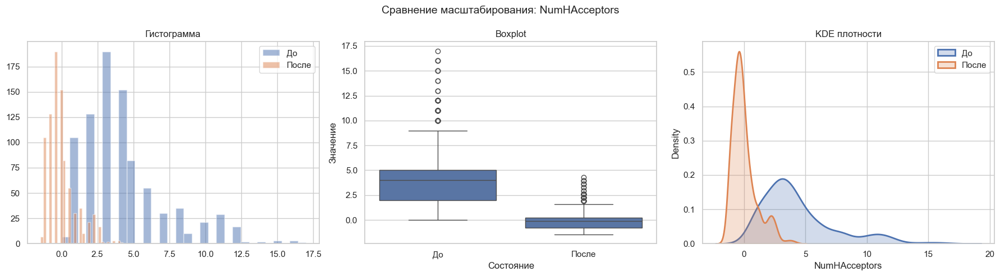

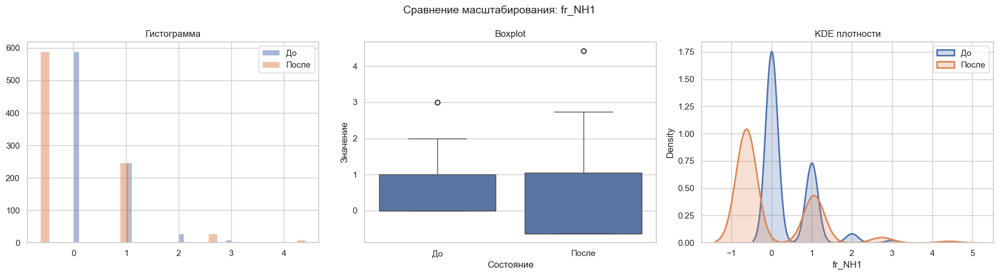

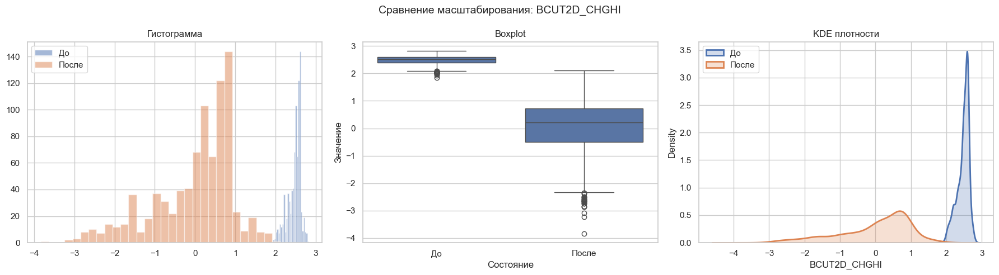

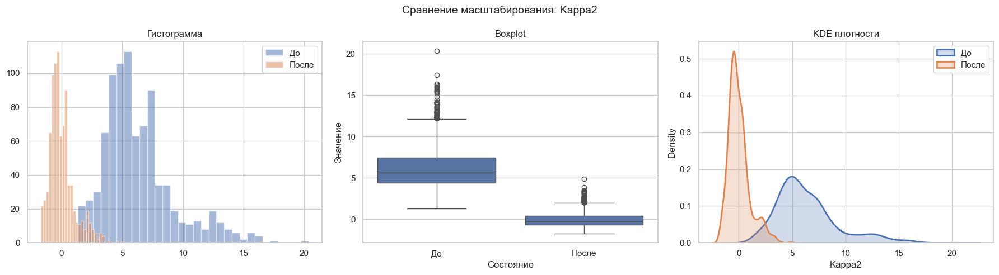

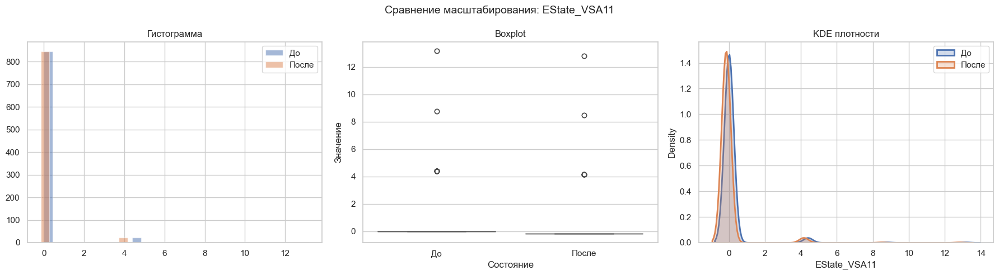

📊 Визуализации сохранены в: plots/eda/scaling_compare/


In [32]:
# === ЭТАП 7: Масштабирование непрерывных признаков (StandardScaler) с визуализацией ===

import pandas as pd
import numpy as np
import os
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# === Шаг 0: Создание необходимых папок ===
os.makedirs("data/scaled", exist_ok=True)
os.makedirs("plots/eda/scaling_compare", exist_ok=True)

# === Шаг 1: Загрузка финального датасета ===
df = pd.read_csv("data/data_final.csv")

# === Шаг 2: Исключаем таргеты ===
target_cols = [
    "IC50_nM", "CC50_nM", "SI_corrected",
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"
]
X = df.drop(columns=target_cols, errors="ignore")

# === Шаг 3: Разделение признаков на бинарные и масштабируемые ===
binary_features = []
scale_features = []

for col in X.columns:
    unique_vals = sorted(X[col].dropna().unique())
    if set(unique_vals).issubset({0, 1}):
        binary_features.append(col)
    else:
        scale_features.append(col)

X_bin = X[binary_features]
X_num = X[scale_features]

print(f"✅ Всего признаков: {X.shape[1]}")
print(f"⚪ Бинарные (не масштабируются): {len(binary_features)}")
print(f"🟩 Масштабируемые (небинарные): {len(scale_features)}")

# === Шаг 4: Масштабирование StandardScaler ===
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_num), columns=scale_features)

# === Шаг 5: Объединение с бинарными признаками ===
X_scaled_df = pd.concat([X_scaled, X_bin.reset_index(drop=True)], axis=1)

# === Шаг 6: Сохранение ===
X_scaled_df.to_csv("data/scaled/X_scaled.csv", index=False)
np.save("data/scaled/X_scaled.npy", X_scaled_df.values)
joblib.dump(scaler, "data/scaled/scaler.pkl")

print("💾 Масштабированные данные сохранены:")
print("- data/scaled/X_scaled.csv")
print("- data/scaled/X_scaled.npy")
print("- data/scaled/scaler.pkl")

# === Шаг 7: Визуализация изменений (5 признаков) ===
np.random.seed(42)
sample_feats = np.random.choice(scale_features, size=5, replace=False)

for feat in sample_feats:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].hist(X_num[feat], bins=30, alpha=0.5, label="До")
    axes[0].hist(X_scaled[feat], bins=30, alpha=0.5, label="После")
    axes[0].set_title("Гистограмма")
    axes[0].legend()

    box_df = pd.DataFrame({"До": X_num[feat], "После": X_scaled[feat]}).melt(var_name="Состояние", value_name="Значение")
    sns.boxplot(data=box_df, x="Состояние", y="Значение", ax=axes[1])
    axes[1].set_title("Boxplot")

    sns.kdeplot(X_num[feat], fill=True, ax=axes[2], label="До", linewidth=2)
    sns.kdeplot(X_scaled[feat], fill=True, ax=axes[2], label="После", linewidth=2)
    axes[2].set_title("KDE плотности")
    axes[2].legend()

    plt.suptitle(f"Сравнение масштабирования: {feat}", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"plots/eda/scaling_compare/{feat}_compare.png")
    plt.show()

print("📊 Визуализации сохранены в: plots/eda/scaling_compare/")


In [33]:
import pandas as pd

df = pd.read_csv("data/data_final.csv")

val_counts = df["fr_furan"].value_counts().sort_index()
print("Распределение значений для fr_furan:")
print(val_counts)


Распределение значений для fr_furan:
fr_furan
0    829
1     39
2      4
Name: count, dtype: int64


In [34]:
df

,MinAbsEStateIndex,MinEStateIndex,qed,SPS,ExactMolWt,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,FpDensityMorgan2,FpDensityMorgan3,...,log1p_CC50_nM,log1p_SI,IC50_gt_median,CC50_gt_median,SI_gt_median,SI_gt_8,EState_Delta,HAcceptors_to_HDonors_Ratio,MolLogP_sq,MolWt_x_TPSA
0,0.387225,0.387225,0.417362,42.928571,384.350449,0.038844,-0.293526,0.293526,1.035714,1.321429,...,18.983049,3.371597,0,0,1,1,4.706871,2.000000e+06,50.711489,9508.59744
1,0.533868,0.533868,0.462473,45.214286,388.381750,0.012887,-0.313407,0.313407,1.000000,1.285714,...,15.502432,2.079442,0,0,1,0,3.427548,9.999995e-01,37.891411,9351.73704
2,0.543231,0.543231,0.260923,42.187500,446.458903,0.094802,-0.325573,0.325573,0.906250,1.156250,...,18.897799,0.542324,1,0,0,0,2.083887,0.000000e+00,50.825493,0.00000
3,0.390603,0.390603,0.377846,41.862069,398.366099,0.038844,-0.293526,0.293526,1.000000,1.310345,...,18.496304,4.162553,0,0,1,1,4.706757,2.000000e+06,56.419628,9855.34488
4,0.270476,0.270476,0.429038,36.514286,466.334799,0.062897,-0.257239,0.257239,0.971429,1.257143,...,18.751932,0.832909,1,0,0,0,4.880034,2.000000e+06,83.079579,11537.14536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867,0.048029,-0.476142,0.382752,49.133333,414.240624,0.317890,-0.468587,0.468587,1.866667,2.533333,...,17.370849,0.755660,0,0,0,0,13.411033,5.000000e+06,18.491720,28881.14114
868,0.030329,-0.699355,0.369425,44.542857,485.277738,0.327562,-0.467493,0.467493,1.800000,2.457143,...,17.341854,0.723911,0,0,0,0,14.334700,5.999994e+00,14.477264,47964.78617
869,0.026535,-0.650790,0.284923,41.973684,545.281109,0.327887,-0.467485,0.467485,1.894737,2.552632,...,17.341855,0.740394,0,0,0,0,14.642480,6.999993e+00,20.594352,53902.93734
870,0.146522,-1.408652,0.381559,39.000000,522.282883,0.312509,-0.468755,0.468755,1.351351,1.864865,...,17.312007,0.708662,0,0,0,0,15.238832,9.000000e+06,11.322552,63902.58145


In [35]:
desc = X_scaled.describe().T
suspects = desc[desc["max"] > 500].index.tolist()
print(f"⚠️ Подозрительные признаки по max > 500: {suspects}")


⚠️ Подозрительные признаки по max > 500: []


In [36]:
# === ЭТАП 8: Проекции признаков (PCA, UMAP, LDA) ===


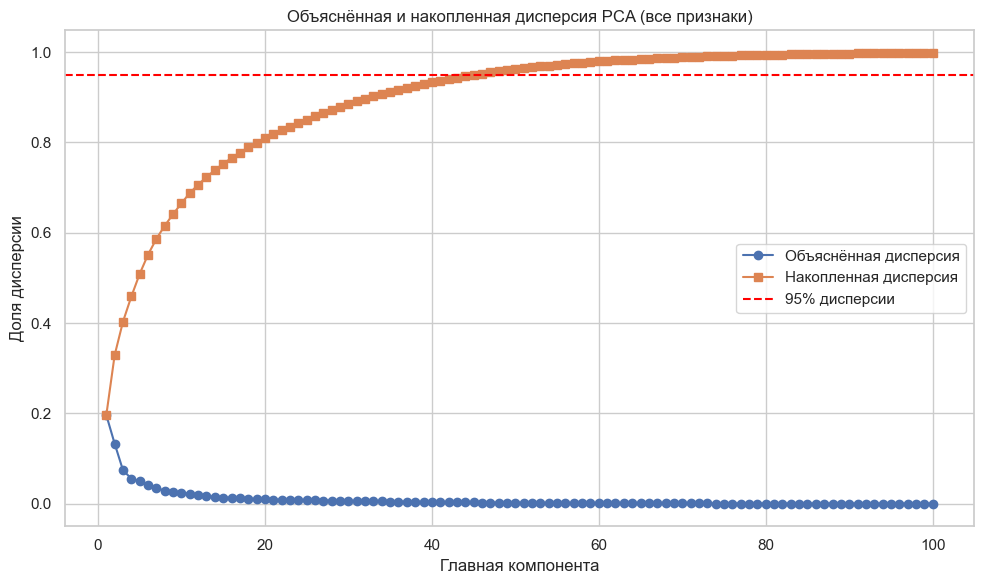

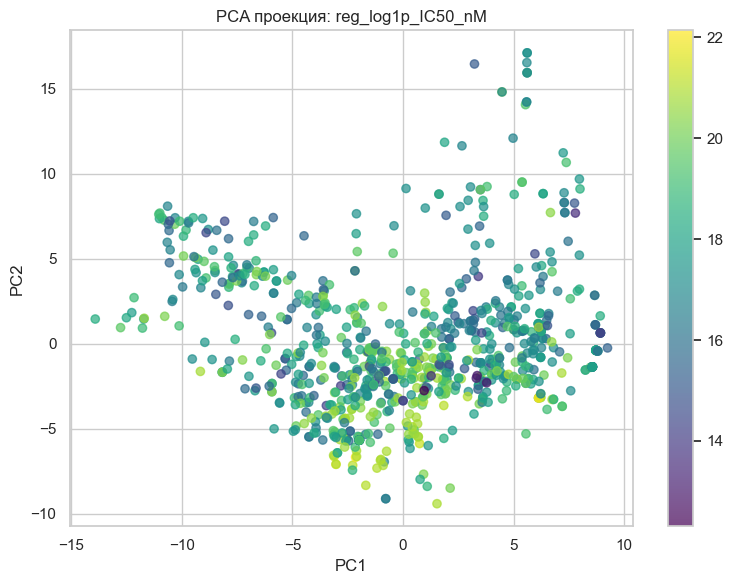

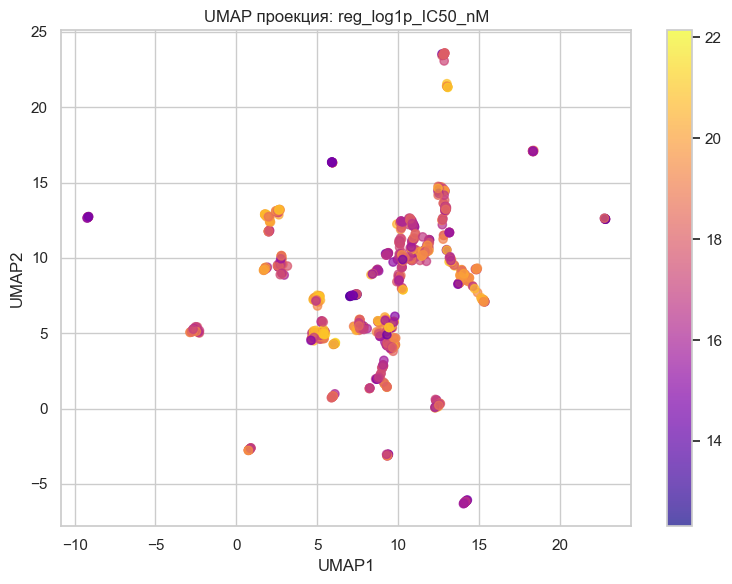

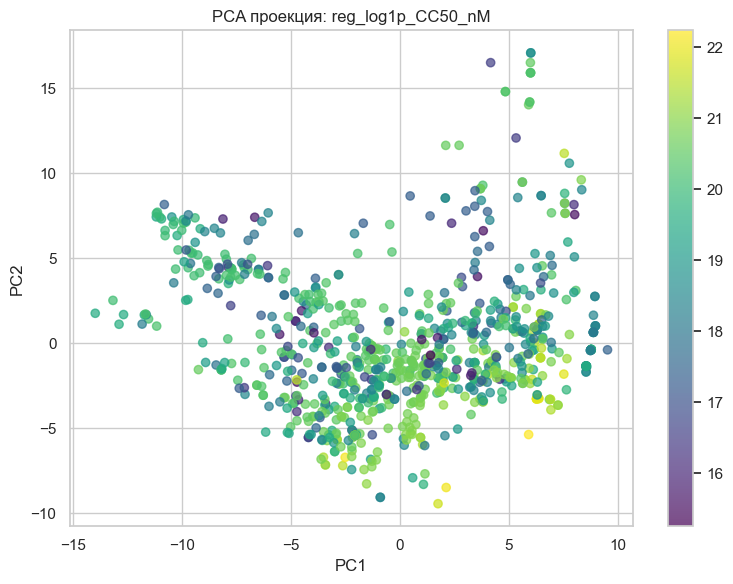

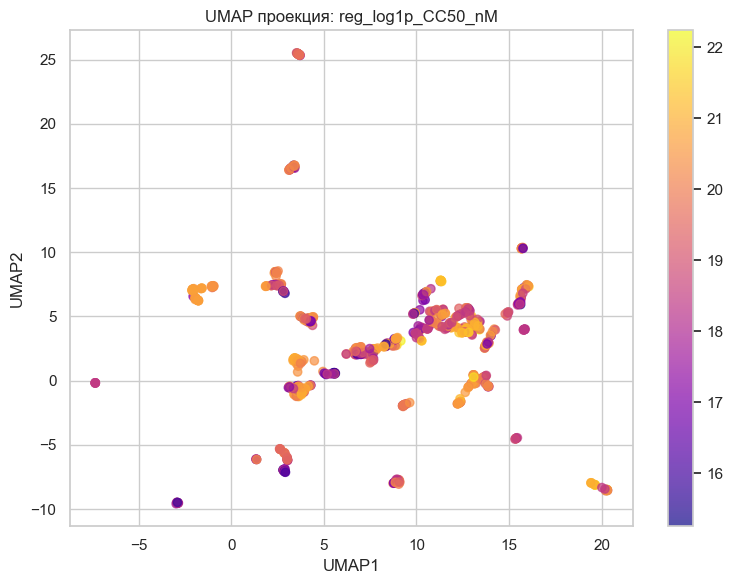

...

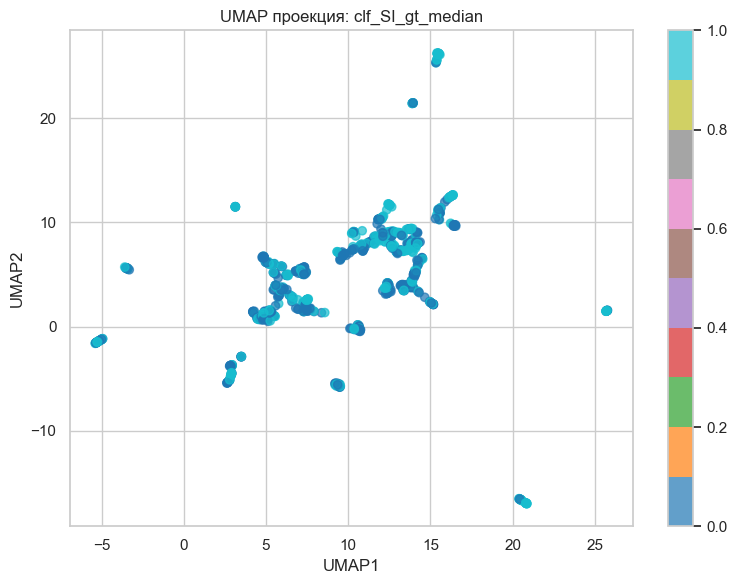

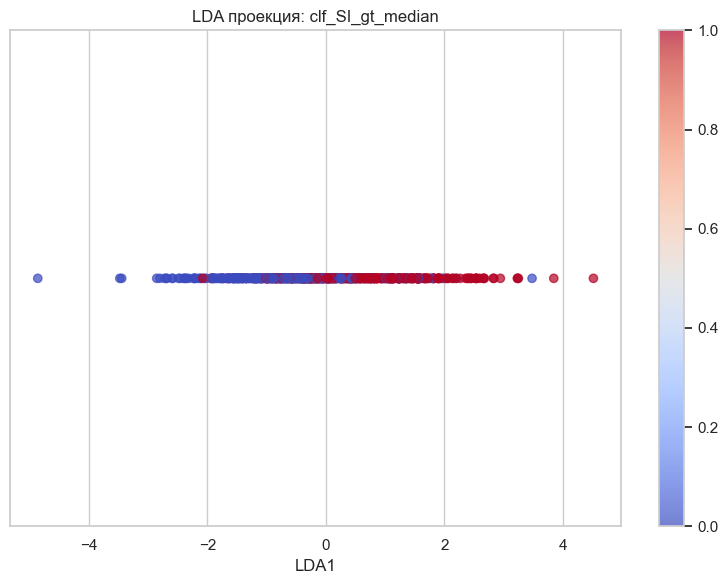

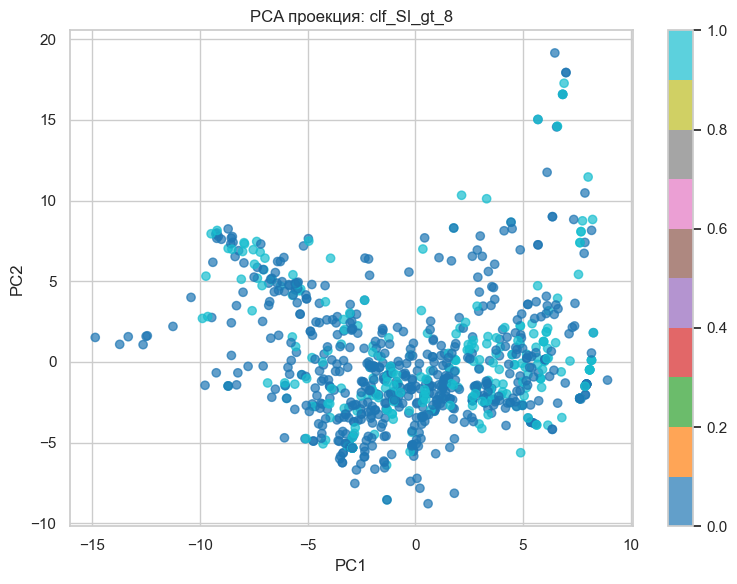

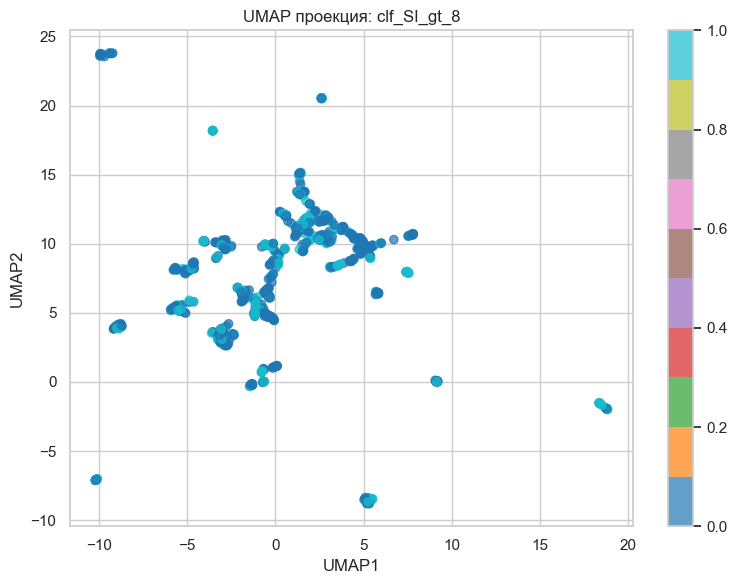

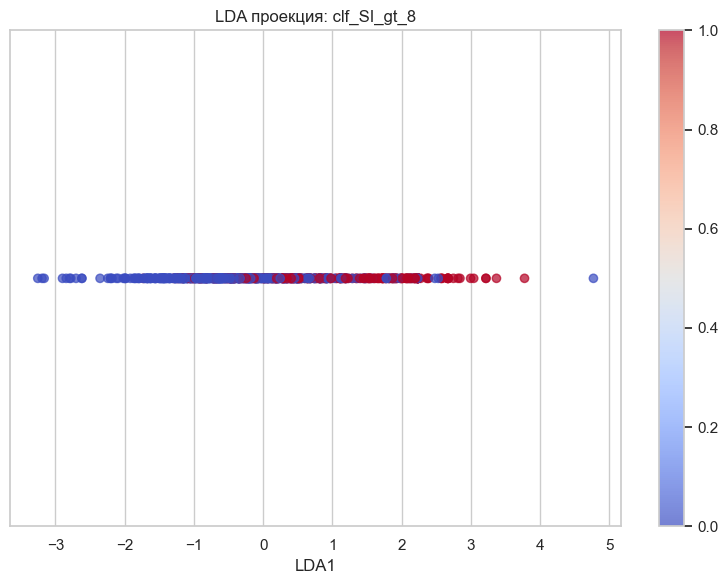

In [37]:
# === ЭТАП 8: Проекции признаков (PCA, UMAP, LDA) по задачам ===

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import umap.umap_ as umap

# === Папки для сохранения ===
os.makedirs("plots/projections_task/pca", exist_ok=True)
os.makedirs("plots/projections_task/umap", exist_ok=True)
os.makedirs("plots/projections_task/lda", exist_ok=True)
os.makedirs("plots/projections_variance", exist_ok=True)

# === Загрузка данных ===
X_scaled = pd.read_csv("data/scaled/X_scaled.csv")
df = pd.read_csv("data/data_final.csv")

# === Определение задач ===
tasks = {
    "reg_log1p_IC50_nM": "log1p_IC50_nM",
    "reg_log1p_CC50_nM": "log1p_CC50_nM",
    "reg_log1p_SI": "log1p_SI",
    "clf_IC50_gt_median": "IC50_gt_median",
    "clf_CC50_gt_median": "CC50_gt_median",
    "clf_SI_gt_median": "SI_gt_median",
    "clf_SI_gt_8": "SI_gt_8"
}

# === Глобальная PCA на всех признаках ===
pca_all = PCA(n_components=100, random_state=42)
X_pca_all = pca_all.fit_transform(X_scaled)
explained_var = pca_all.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

# График объяснённой и накопленной дисперсии
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_var)+1), explained_var, marker='o', label="Объяснённая дисперсия")
plt.plot(range(1, len(cumulative_var)+1), cumulative_var, marker='s', label="Накопленная дисперсия")
plt.axhline(0.95, color='red', linestyle='--', label="95% дисперсии")
plt.xlabel("Главная компонента")
plt.ylabel("Доля дисперсии")
plt.title("Объяснённая и накопленная дисперсия PCA (все признаки)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("plots/projections_variance/pca_explained_variance.png")
plt.show()

# === Генерация проекций по задачам ===
for task, target_col in tasks.items():
    path_txt = f"data/features/{task}.txt"
    if not os.path.exists(path_txt):
        print(f"❌ Нет признаков для задачи: {task}")
        continue

    with open(path_txt) as f:
        features = [line.strip() for line in f.readlines() if line.strip() in X_scaled.columns]

    if len(features) < 2:
        print(f"⚠️ Недостаточно признаков для {task}")
        continue

    X = X_scaled[features]
    y = df[target_col]
    is_clf = task.startswith("clf_")

    # === PCA ===
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X)
    cmap_pca = "tab10" if is_clf else "viridis"
    plt.figure(figsize=(8, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap=cmap_pca, alpha=0.7)
    plt.colorbar()
    plt.title(f"PCA проекция: {task}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.tight_layout()
    plt.savefig(f"plots/projections_task/pca/{task}.png")
    plt.show()

    # === UMAP ===
    reducer = umap.UMAP(n_components=2, random_state=42)
    X_umap = reducer.fit_transform(X)
    cmap_umap = "tab10" if is_clf else "plasma"
    plt.figure(figsize=(8, 6))
    plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap=cmap_umap, alpha=0.7)
    plt.colorbar()
    plt.title(f"UMAP проекция: {task}")
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.tight_layout()
    plt.savefig(f"plots/projections_task/umap/{task}.png")
    plt.show()

    # === LDA (только для классификации) ===
    if is_clf:
        y_array = y.values
        n_classes = len(np.unique(y_array))
        max_components = min(len(features), n_classes - 1)
        if max_components < 1:
            continue
        lda = LinearDiscriminantAnalysis(n_components=max_components)
        X_lda = lda.fit_transform(X, y_array)
        plt.figure(figsize=(8, 6))
        if max_components == 1:
            plt.scatter(X_lda[:, 0], [0]*len(X_lda), c=y_array, cmap="coolwarm", alpha=0.7)
            plt.yticks([])
        else:
            plt.scatter(X_lda[:, 0], X_lda[:, 1], c=y_array, cmap="coolwarm", alpha=0.7)
            plt.ylabel("LDA2")
        plt.xlabel("LDA1")
        plt.title(f"LDA проекция: {task}")
        plt.colorbar()
        plt.tight_layout()
        plt.savefig(f"plots/projections_task/lda/{task}.png")
        plt.show()



=== SHAP для задачи: reg_log1p_IC50_nM ===

📈 Метрики для задачи reg_log1p_IC50_nM:
R²:   0.2793 — коэффициент детерминации (чем ближе к 1, тем лучше объясняет вариацию таргета)
RMSE: 2.2337 — среднеквадратичная ошибка (штрафует большие отклонения сильнее, чувствителен к выбросам)
MAE:  1.1820 — средняя абсолютная ошибка (устойчив к выбросам, хорош для интерпретации в исходных единицах)


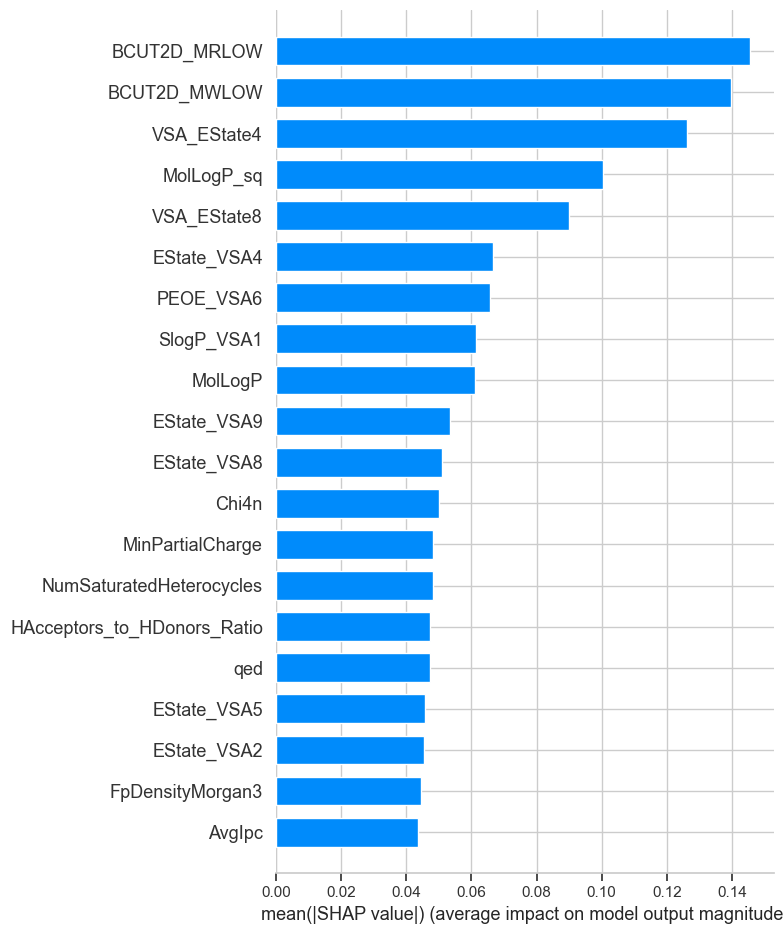

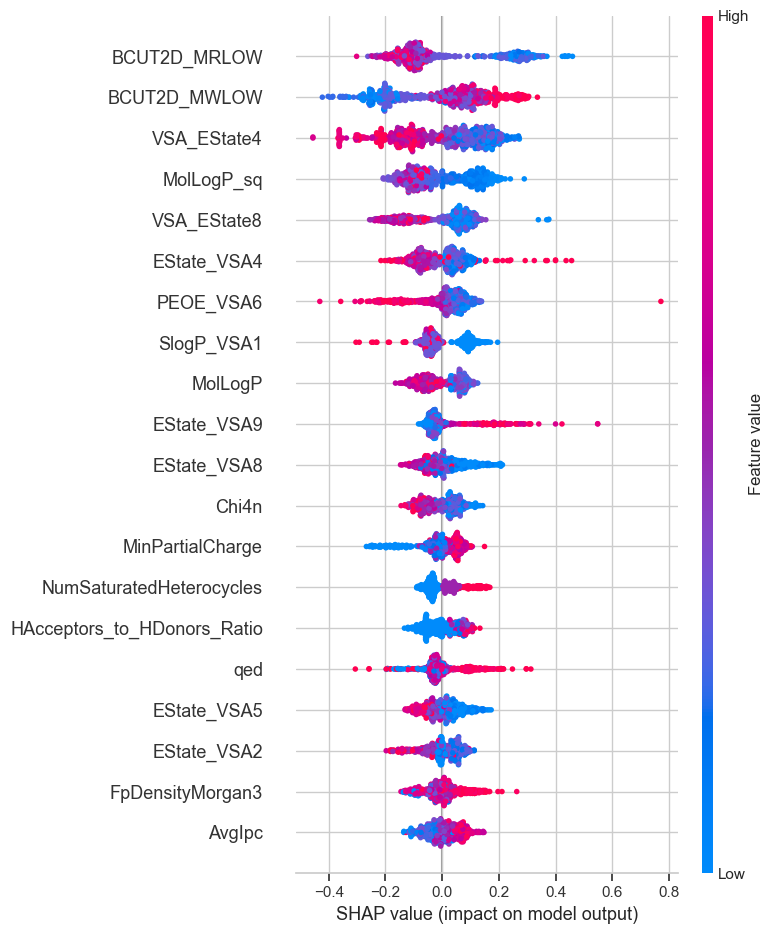

<Figure size 640x480 with 0 Axes>

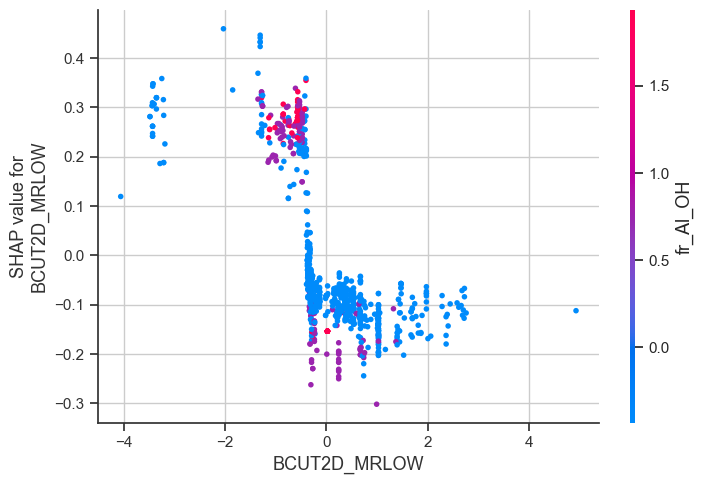

✅ SHAP сохранён для reg_log1p_IC50_nM — top: BCUT2D_MRLOW

=== SHAP для задачи: reg_log1p_CC50_nM ===

📈 Метрики для задачи reg_log1p_CC50_nM:
R²:   0.4601 — коэффициент детерминации (чем ближе к 1, тем лучше объясняет вариацию таргета)
RMSE: 1.0892 — среднеквадратичная ошибка (штрафует большие отклонения сильнее, чувствителен к выбросам)
MAE:  0.8002 — средняя абсолютная ошибка (устойчив к выбросам, хорош для интерпретации в исходных единицах)


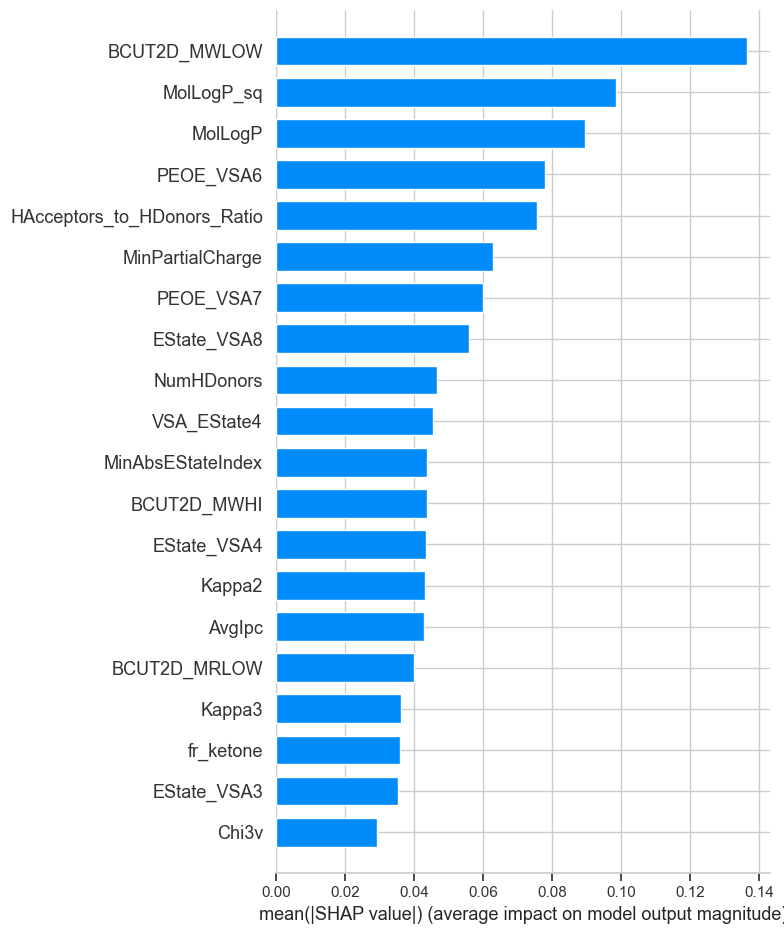

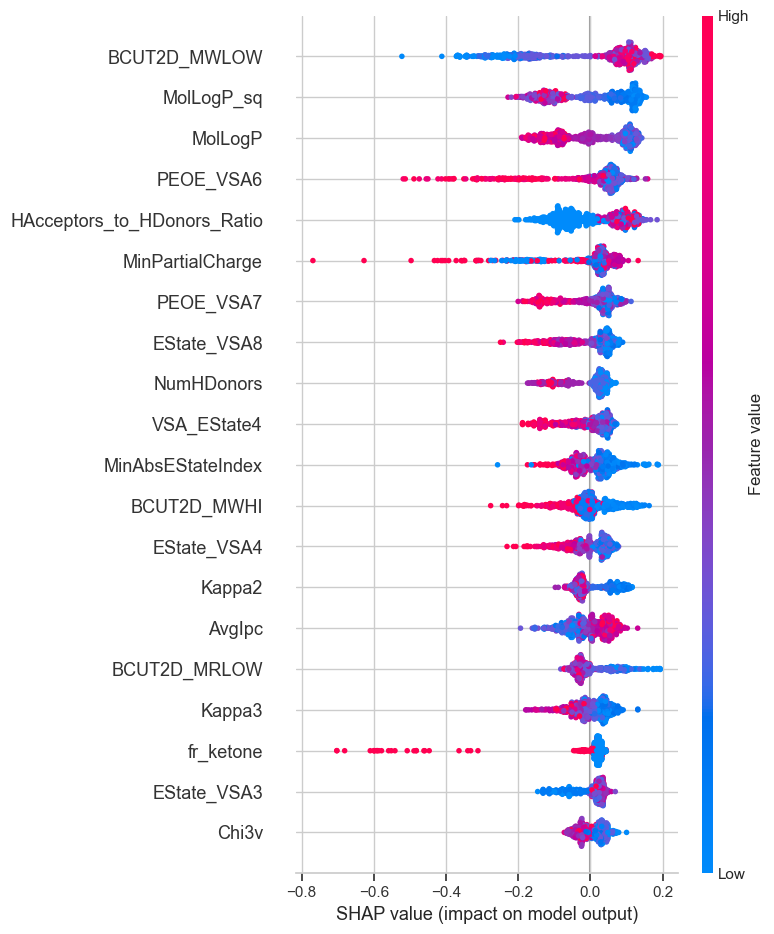

<Figure size 640x480 with 0 Axes>

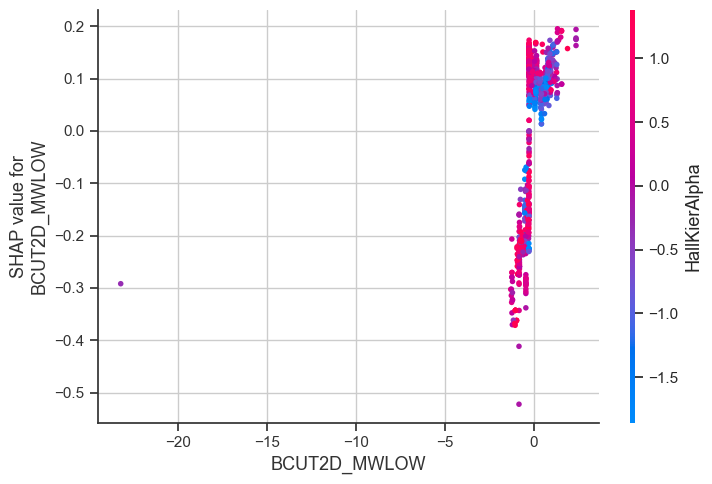

✅ SHAP сохранён для reg_log1p_CC50_nM — top: BCUT2D_MWLOW

=== SHAP для задачи: reg_log1p_SI ===

📈 Метрики для задачи reg_log1p_SI:
R²:   0.0858 — коэффициент детерминации (чем ближе к 1, тем лучше объясняет вариацию таргета)
RMSE: 1.1855 — среднеквадратичная ошибка (штрафует большие отклонения сильнее, чувствителен к выбросам)
MAE:  0.8213 — средняя абсолютная ошибка (устойчив к выбросам, хорош для интерпретации в исходных единицах)


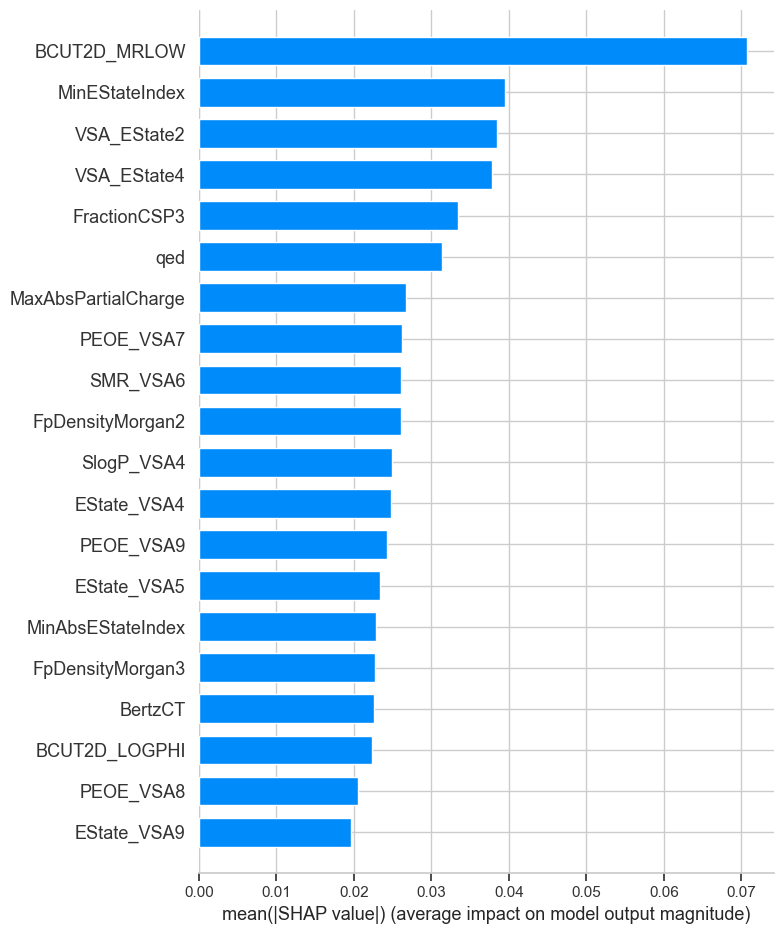

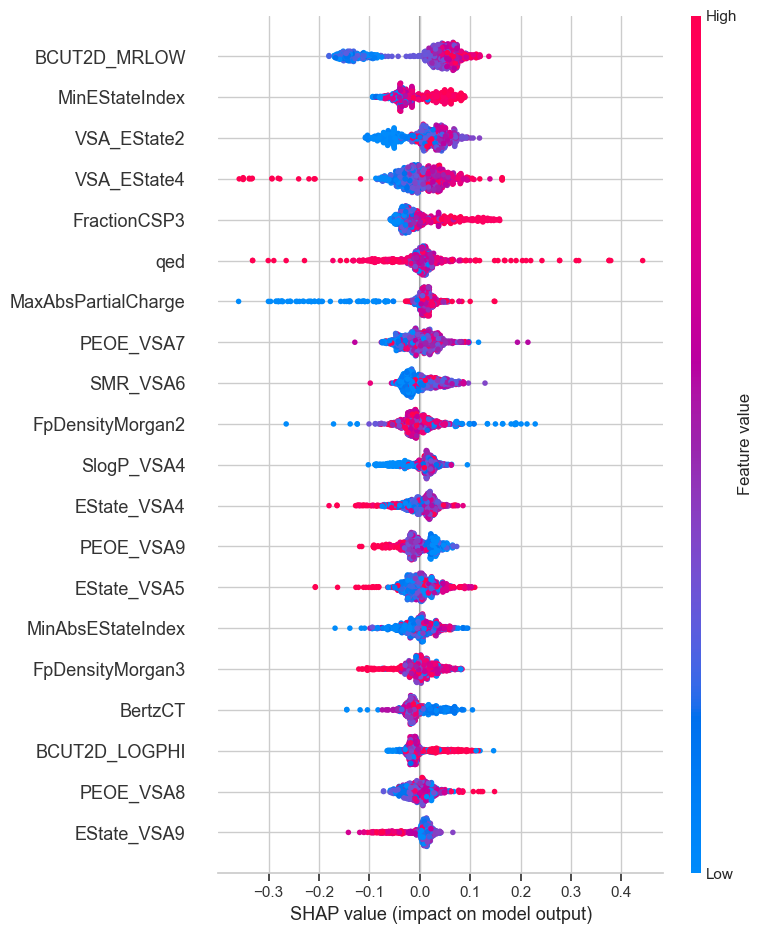

<Figure size 640x480 with 0 Axes>

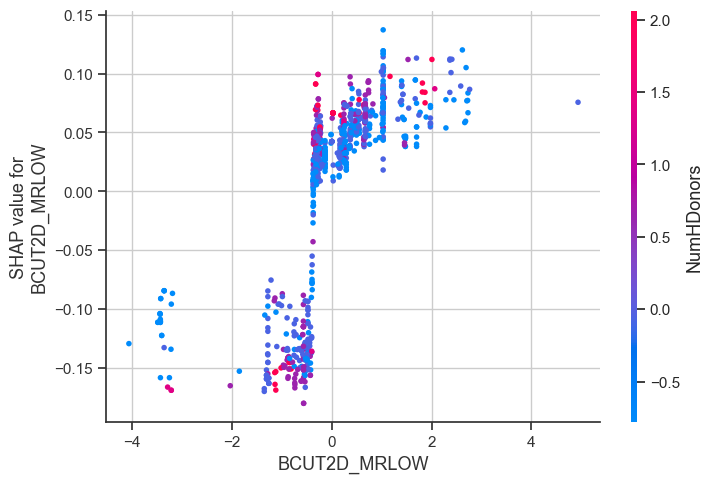

✅ SHAP сохранён для reg_log1p_SI — top: BCUT2D_MRLOW

=== SHAP для задачи: clf_IC50_gt_median ===


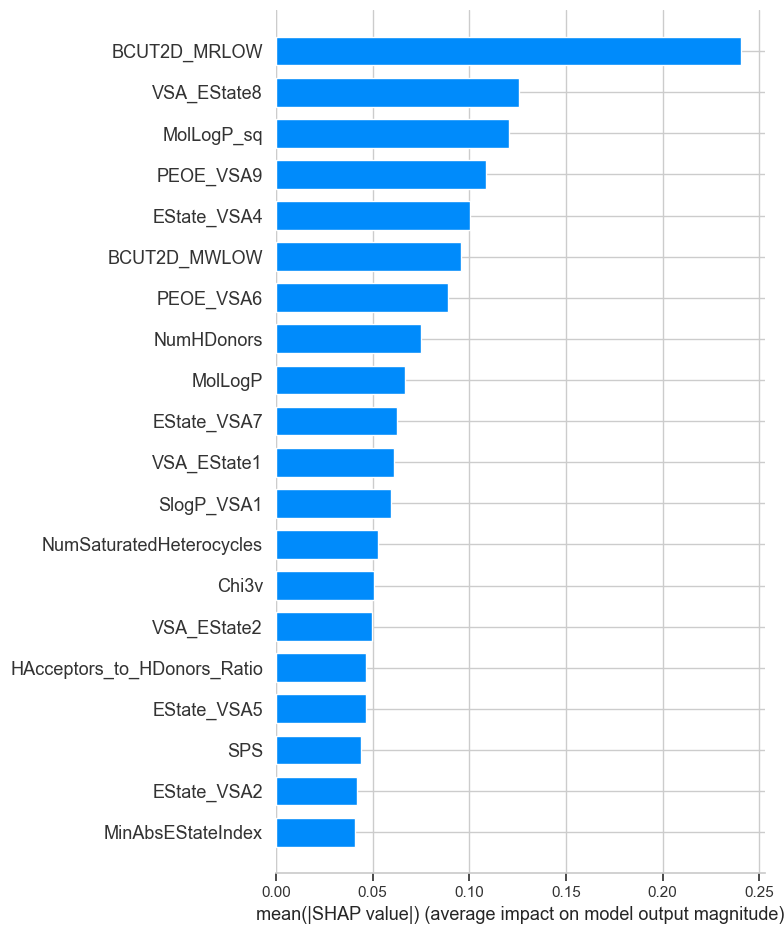

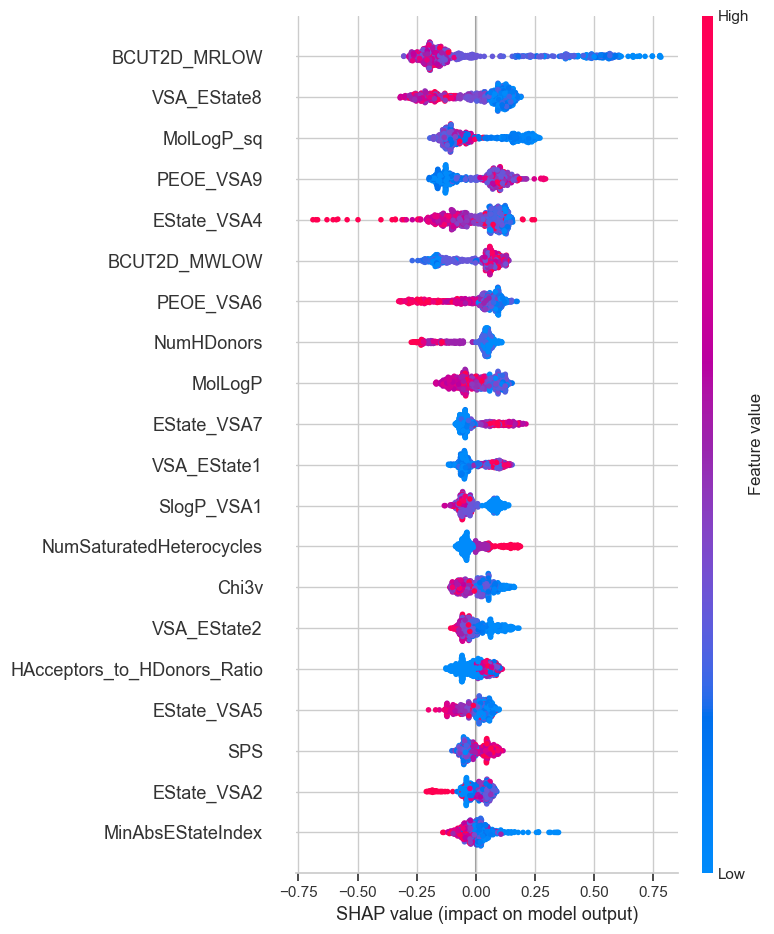

<Figure size 640x480 with 0 Axes>

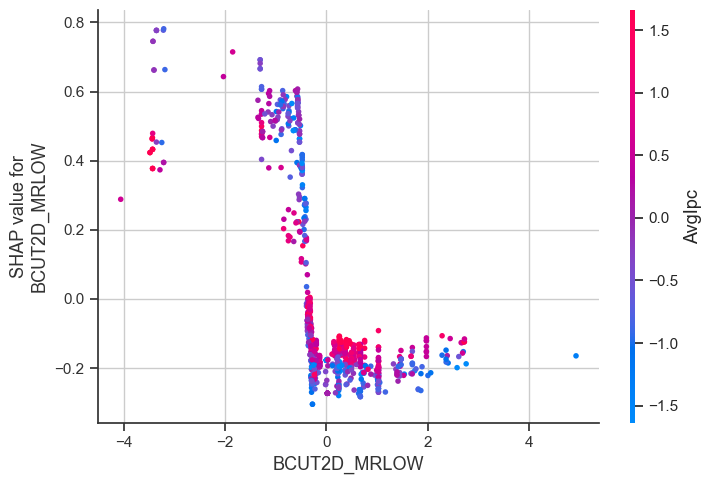

✅ SHAP сохранён для clf_IC50_gt_median — top: BCUT2D_MRLOW

=== SHAP для задачи: clf_CC50_gt_median ===


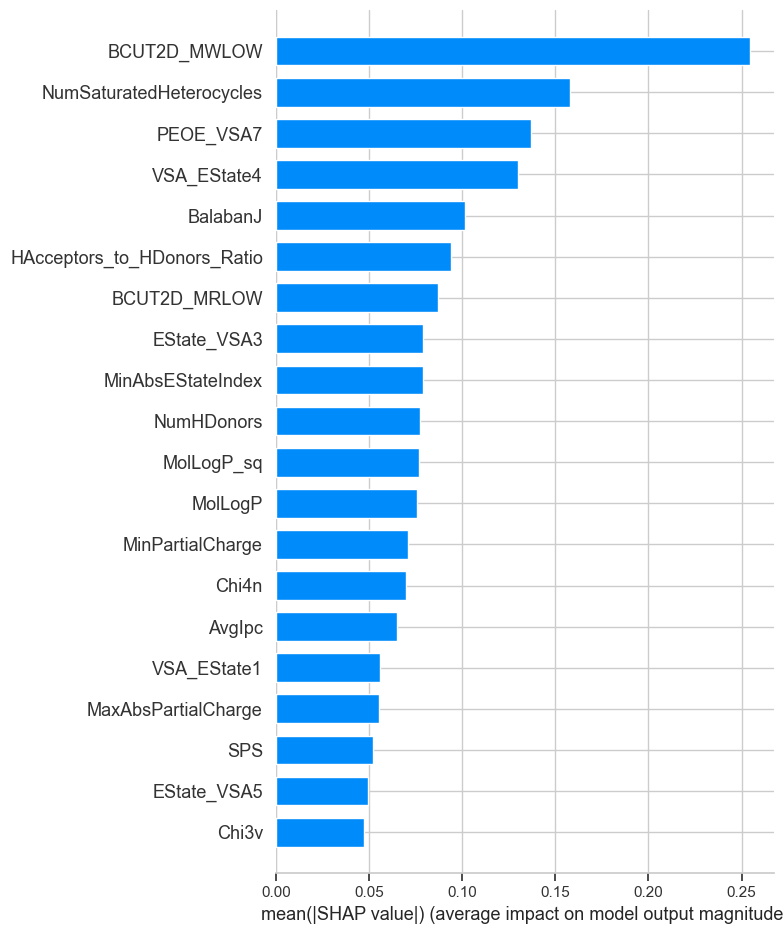

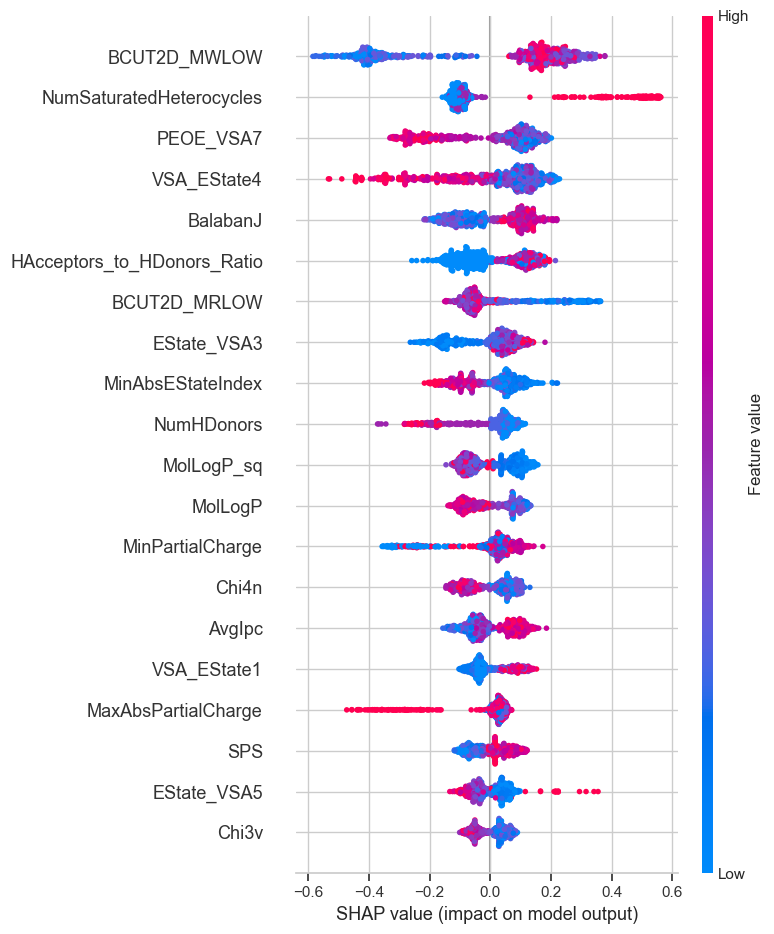

<Figure size 640x480 with 0 Axes>

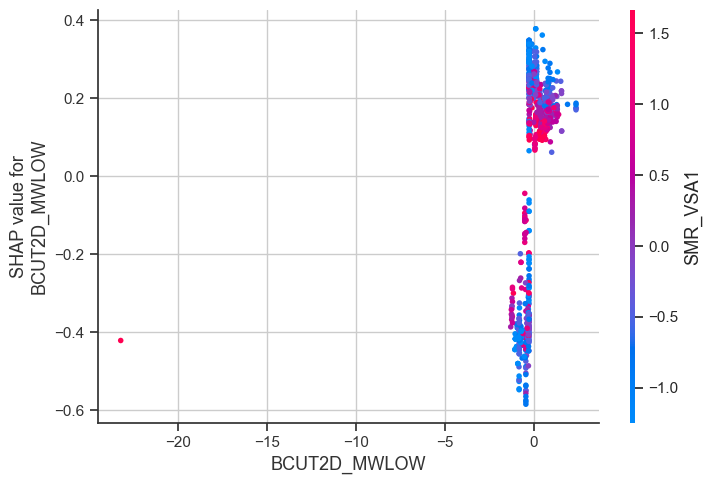

✅ SHAP сохранён для clf_CC50_gt_median — top: BCUT2D_MWLOW

=== SHAP для задачи: clf_SI_gt_median ===


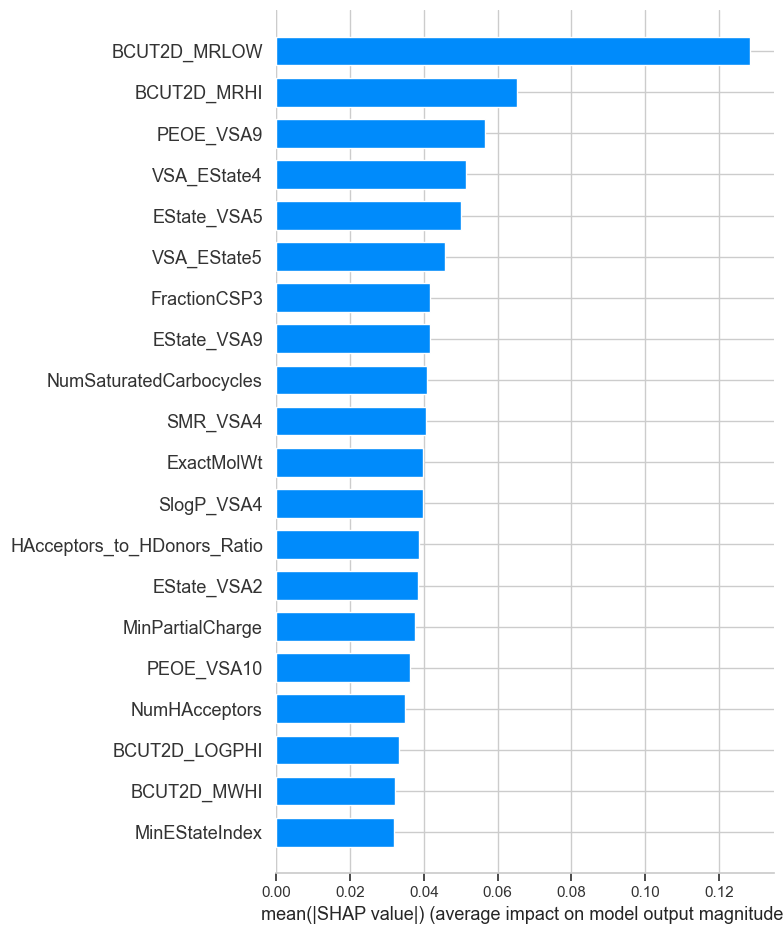

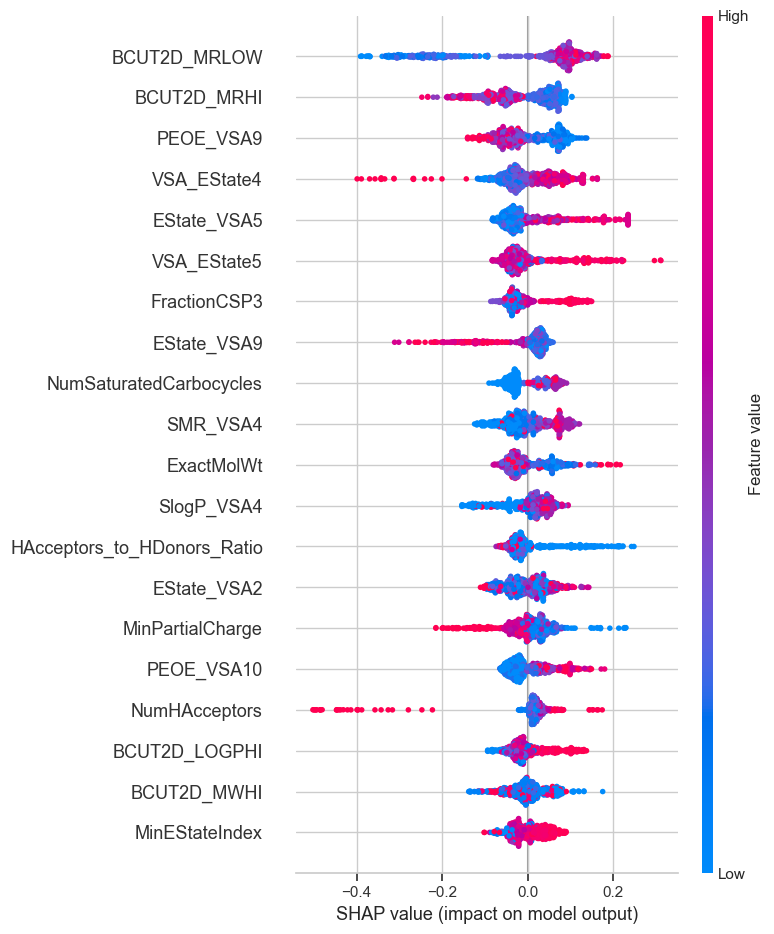

<Figure size 640x480 with 0 Axes>

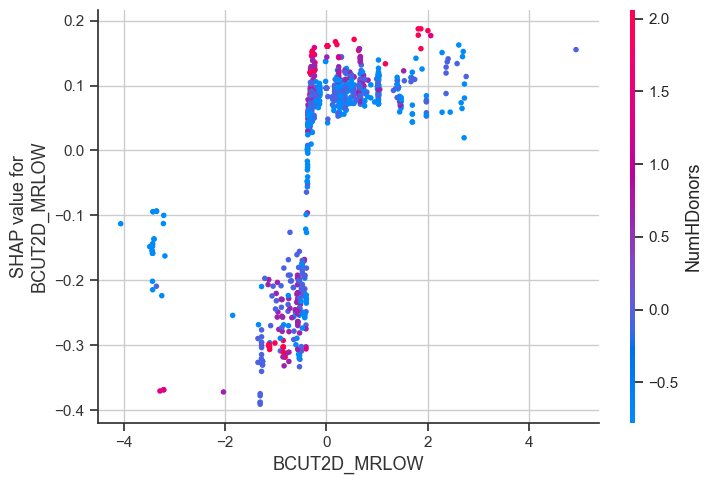

✅ SHAP сохранён для clf_SI_gt_median — top: BCUT2D_MRLOW

=== SHAP для задачи: clf_SI_gt_8 ===


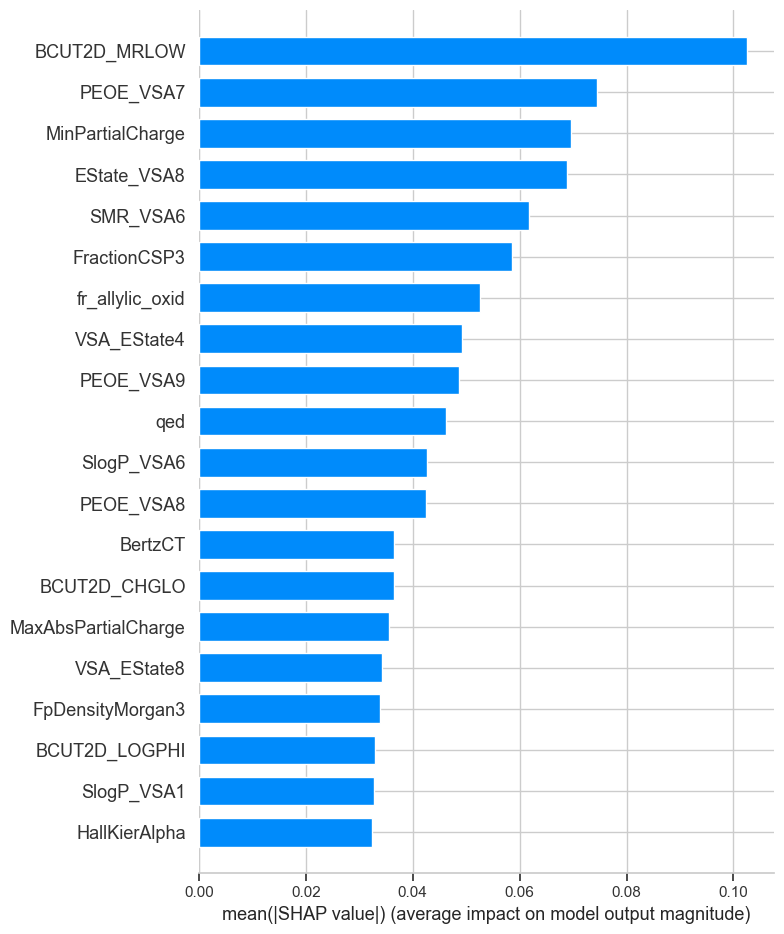

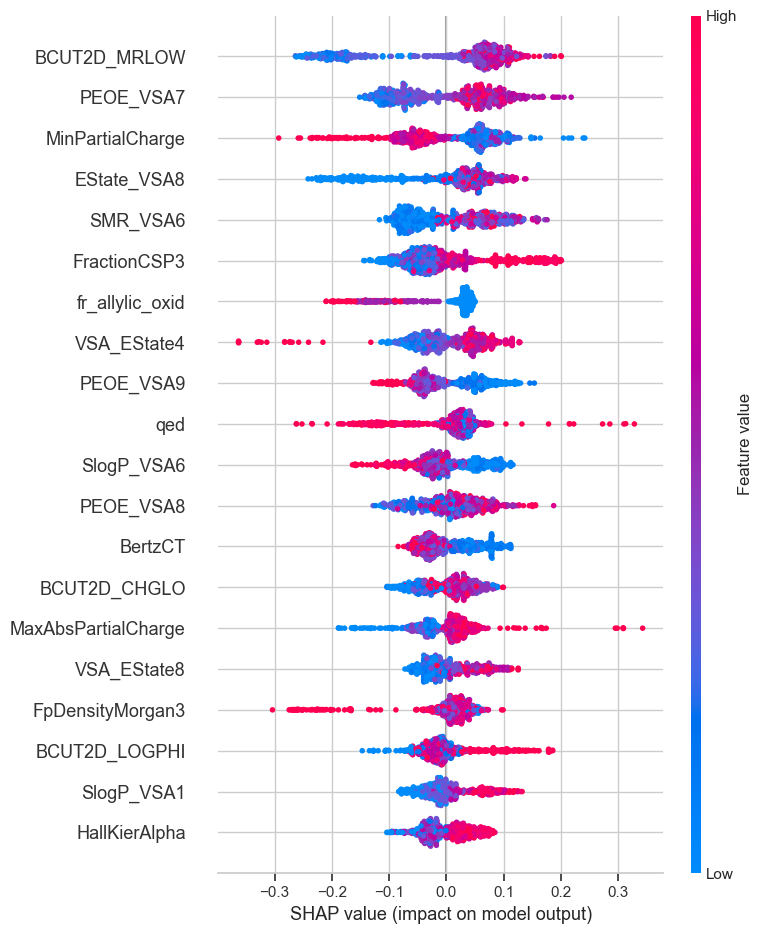

<Figure size 640x480 with 0 Axes>

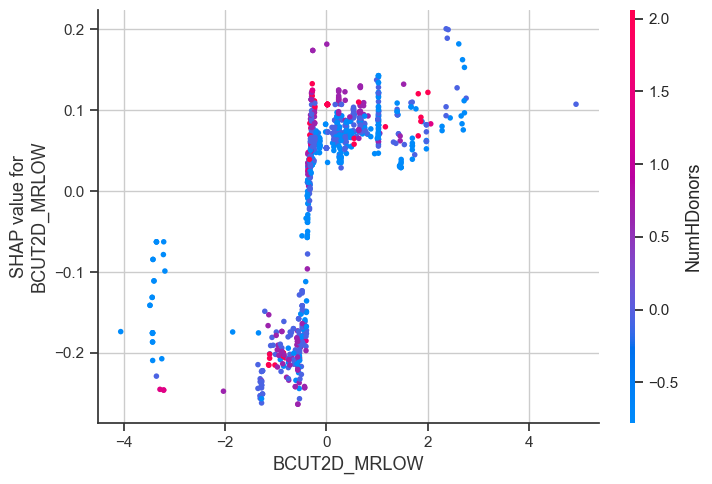

✅ SHAP сохранён для clf_SI_gt_8 — top: BCUT2D_MRLOW


In [40]:
# === ЭТАП 9: SHAP-анализ и интерпретация признаков (все задачи) ===

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 📁 Папки для графиков
os.makedirs("plots/shap/bar", exist_ok=True)
os.makedirs("plots/shap/beeswarm", exist_ok=True)
os.makedirs("plots/shap/dependence", exist_ok=True)

# === Данные ===
df = pd.read_csv("data/data_final.csv")
X_scaled = pd.read_csv("data/scaled/X_scaled.csv")

# === Все задачи курсовой ===
tasks = {
    "reg_log1p_IC50_nM": ("log1p_IC50_nM", "regression"),
    "reg_log1p_CC50_nM": ("log1p_CC50_nM", "regression"),
    "reg_log1p_SI": ("log1p_SI", "regression"),
    "clf_IC50_gt_median": ("IC50_gt_median", "classification"),
    "clf_CC50_gt_median": ("CC50_gt_median", "classification"),
    "clf_SI_gt_median": ("SI_gt_median", "classification"),
    "clf_SI_gt_8": ("SI_gt_8", "classification"),
}

for task_name, (target_col, task_type) in tasks.items():
    print(f"\n=== SHAP для задачи: {task_name} ===")

    path_txt = f"data/features/{task_name}.txt"
    if not os.path.exists(path_txt):
        print(f"❌ Пропущено: нет признаков {path_txt}")
        continue

    with open(path_txt) as f:
        features = [line.strip() for line in f if line.strip() in X_scaled.columns]

    if len(features) < 2:
        print(f"⚠️ Недостаточно признаков: {task_name}")
        continue

    X = X_scaled[features]
    y = df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

    if task_type == "regression":
        model = CatBoostRegressor(verbose=0, random_state=42)
    else:
        model = CatBoostClassifier(verbose=0, random_state=42)

    model.fit(X_train, y_train)

    # === Метрики (только для регрессии) ===
    if task_type == "regression":
        y_pred = model.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        print(f"\n📈 Метрики для задачи {task_name}:")
        print(f"R²:   {r2:.4f} — коэффициент детерминации (чем ближе к 1, тем лучше объясняет вариацию таргета)")
        print(f"RMSE: {rmse:.4f} — среднеквадратичная ошибка (штрафует большие отклонения сильнее, чувствителен к выбросам)")
        print(f"MAE:  {mae:.4f} — средняя абсолютная ошибка (устойчив к выбросам, хорош для интерпретации в исходных единицах)")

    # SHAP анализ
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    if isinstance(shap_values, list):  # для классификации
        shap_values = shap_values[1]

    # === SHAP Bar plot ===
    plt.figure()
    shap.summary_plot(shap_values, X, plot_type="bar", show=False)
    plt.tight_layout()
    plt.savefig(f"plots/shap/bar/{task_name}.png")
    plt.show()

    # === SHAP Beeswarm ===
    plt.figure()
    shap.summary_plot(shap_values, X, show=False)
    plt.tight_layout()
    plt.savefig(f"plots/shap/beeswarm/{task_name}.png")
    plt.show()

    # === SHAP Dependence (top-1 feature) ===
    top_feature = X.columns[np.abs(shap_values).mean(axis=0).argmax()]
    plt.figure()
    shap.dependence_plot(top_feature, shap_values, X, show=False)
    plt.tight_layout()
    plt.savefig(f"plots/shap/dependence/{task_name}_{top_feature}.png")
    plt.show()

    print(f"✅ SHAP сохранён для {task_name} — top: {top_feature}")


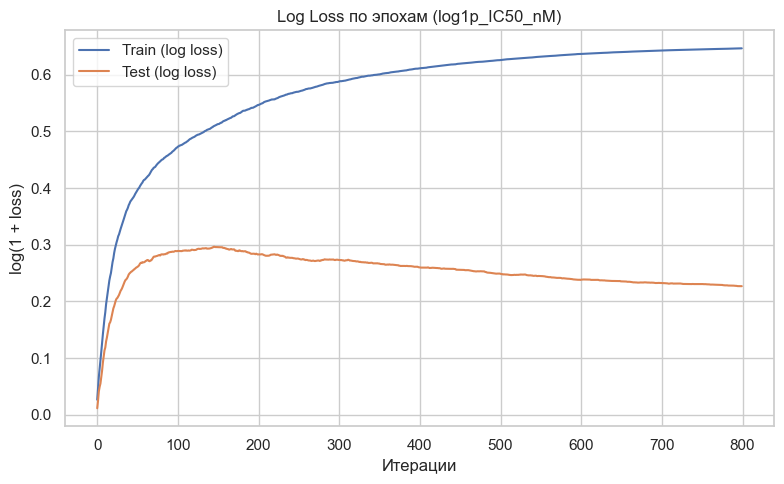

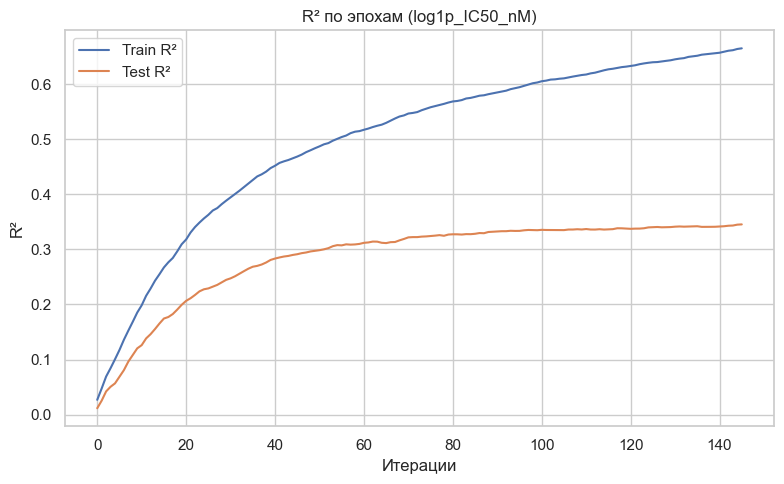

📈 R²:   0.6038
📉 RMSE: 1.2898
📊 MAE:  0.9114


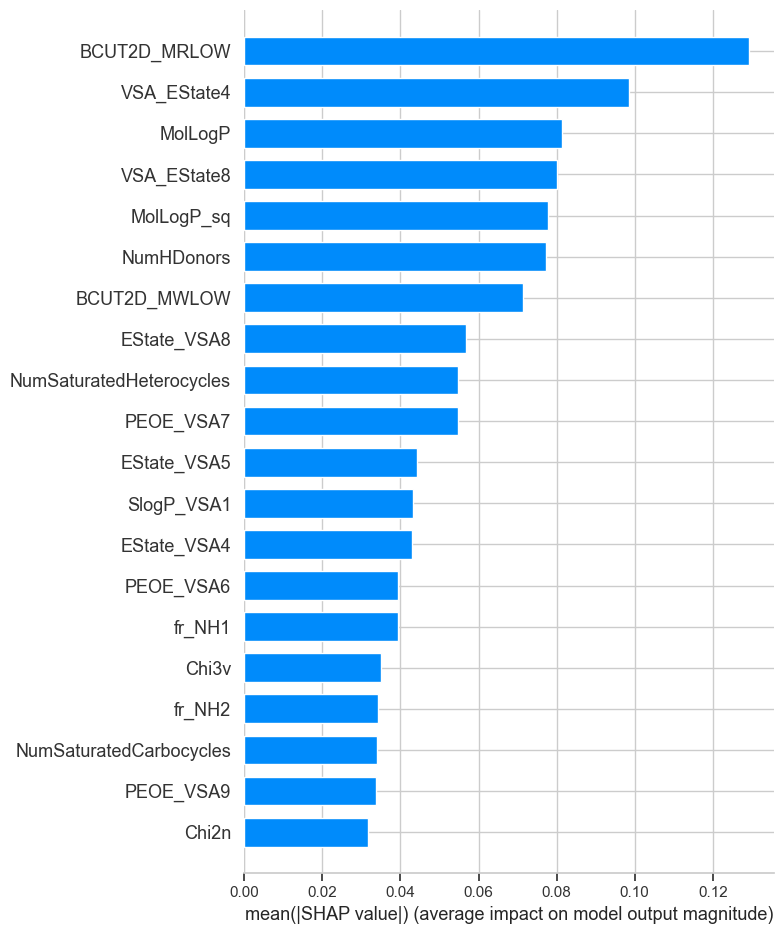

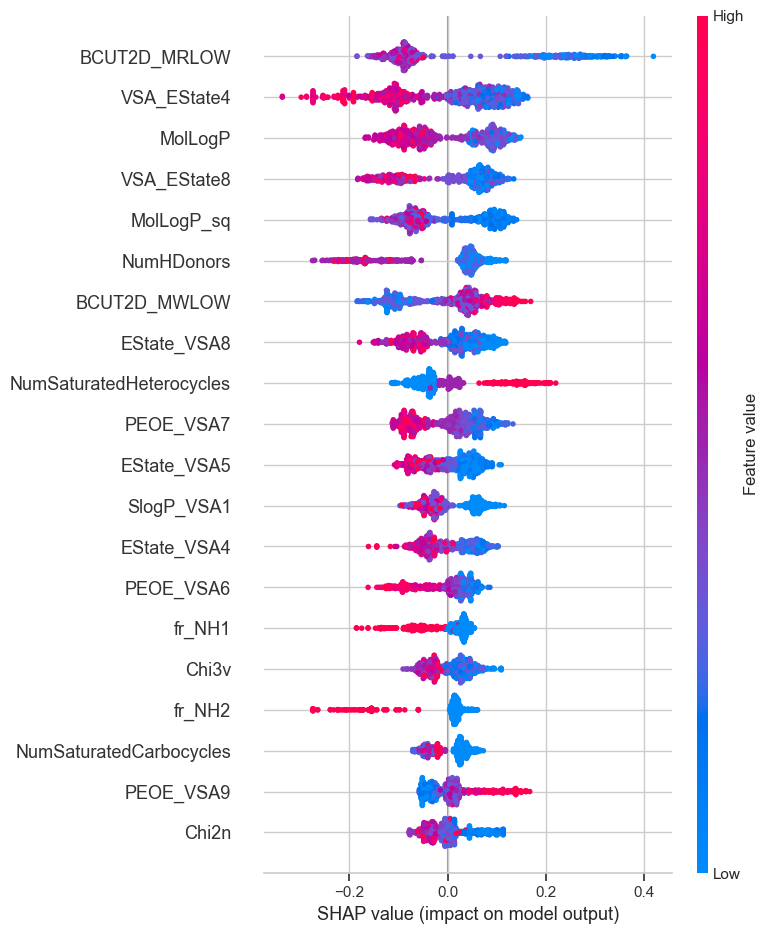

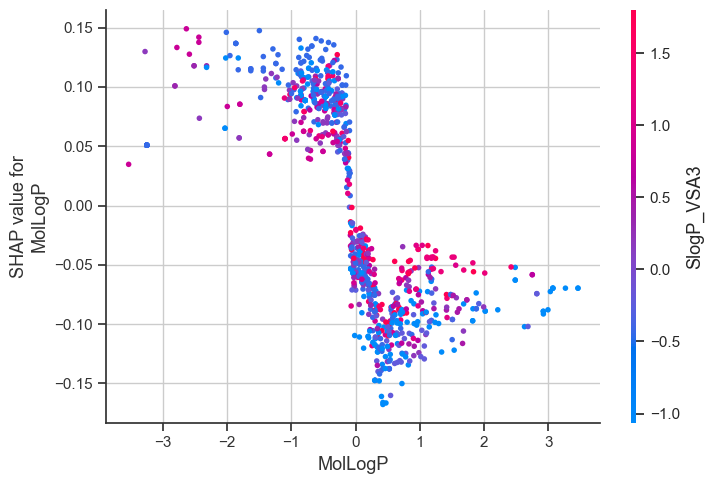

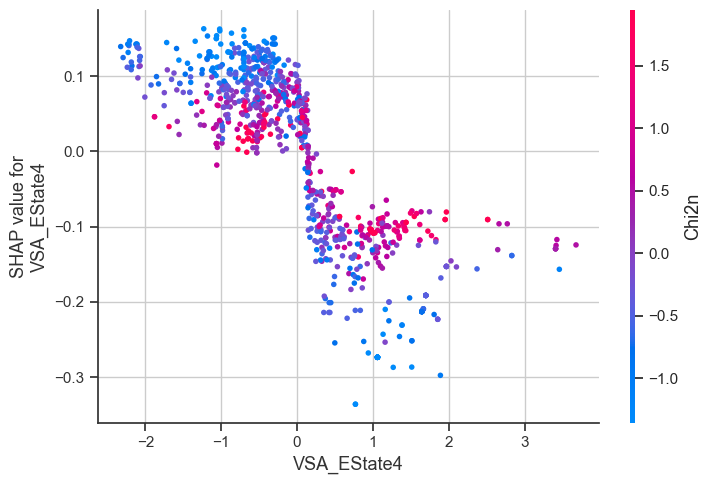

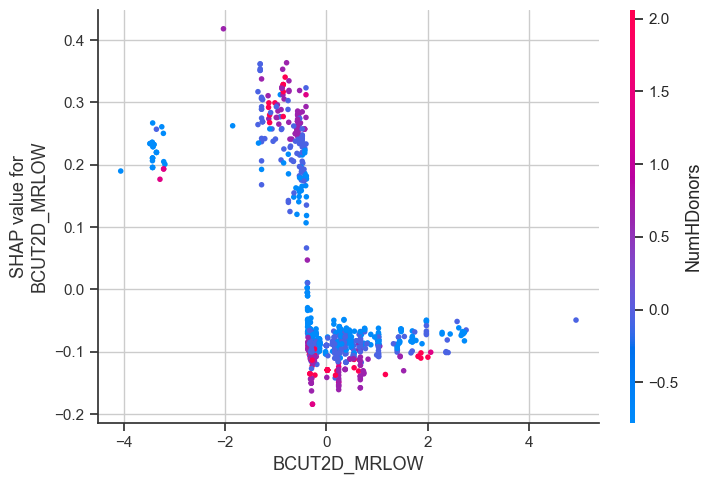

✅ Отобрано признаков: 83
📂 Сохранено: data/features/selected_by_catboost_log1p_IC50_nM.csv


In [38]:
# === ЭТАП 9.1.1: SHAP-анализ для регрессии (log1p_IC50_nM) ===

import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.feature_selection import SelectFromModel

# 📌 Настройки
target_name = "log1p_IC50_nM"
plots_dir = f"plots/shap/{target_name}"
os.makedirs(plots_dir, exist_ok=True)
os.makedirs("data/features", exist_ok=True)

# 📥 Загрузка данных
X = pd.read_csv("data/scaled/X_scaled.csv")
y = pd.read_csv("data/data_final.csv")[target_name]

# 🔀 Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 🧠 Обучение модели
model = CatBoostRegressor(
    iterations=800,
    learning_rate=0.05,
    depth=6,
    eval_metric='R2',
    verbose=0,
    random_state=42
)
model.fit(X_train, y_train, eval_set=(X_test, y_test), use_best_model=True, plot=False)

# 📊 Получение метрик обучения
evals_result = model.get_evals_result()
metric_name = list(evals_result["learn"].keys())[0]

# 📈 График логлосса (log-масштаб)
plt.figure(figsize=(8, 5))
plt.plot(np.log1p(evals_result["learn"][metric_name]), label="Train (log loss)")
plt.plot(np.log1p(evals_result["validation"][metric_name]), label="Test (log loss)")
plt.title(f"Log Loss по эпохам ({target_name})")
plt.xlabel("Итерации")
plt.ylabel("log(1 + loss)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{plots_dir}/log_loss_curve_{target_name}.png")
plt.show()

# 📈 R² по эпохам
train_r2 = []
test_r2 = []
max_trees = model.tree_count_

for i in range(1, max_trees + 1):
    y_train_pred = model.predict(X_train, ntree_end=i)
    y_test_pred = model.predict(X_test, ntree_end=i)
    train_r2.append(r2_score(y_train, y_train_pred))
    test_r2.append(r2_score(y_test, y_test_pred))

plt.figure(figsize=(8, 5))
plt.plot(train_r2, label="Train R²")
plt.plot(test_r2, label="Test R²")
plt.title(f"R² по эпохам ({target_name})")
plt.xlabel("Итерации")
plt.ylabel("R²")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{plots_dir}/r2_curve_{target_name}.png")
plt.show()

# 🧪 Предсказания и метрики
y_pred = model.predict(X)
print(f"📈 R²:   {r2_score(y, y_pred):.4f}")
print(f"📉 RMSE: {mean_squared_error(y, y_pred):.4f}")
print(f"📊 MAE:  {mean_absolute_error(y, y_pred):.4f}")

# 🔍 SHAP-анализ
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# 📊 SHAP bar plot
shap.summary_plot(shap_values, X, plot_type="bar", max_display=20, show=False)
plt.tight_layout()
plt.savefig(f"{plots_dir}/shap_bar_{target_name}_top20.png")
plt.show()

# 🌈 SHAP beeswarm
shap.summary_plot(shap_values, X, max_display=20, show=False)
plt.tight_layout()
plt.savefig(f"{plots_dir}/shap_beeswarm_{target_name}_top20.png")
plt.show()

# 🔁 SHAP dependence plots (top-3)
top_features = X.columns[np.argsort(np.abs(shap_values).mean(0))[-3:]]
for feature in top_features:
    shap.dependence_plot(feature, shap_values, X, show=False)
    plt.tight_layout()
    plt.savefig(f"{plots_dir}/shap_dependence_{target_name}_{feature}.png")
    plt.show()

# 🏋️ Отбор признаков
sfm = SelectFromModel(model, prefit=True, threshold="median")
selected_features = X.columns[sfm.get_support()]
df_selected = pd.DataFrame({"feature": selected_features})
df_selected.to_csv(f"data/features/selected_by_catboost_{target_name}.csv", index=False)

print(f"✅ Отобрано признаков: {len(selected_features)}")
print(f"📂 Сохранено: data/features/selected_by_catboost_{target_name}.csv")


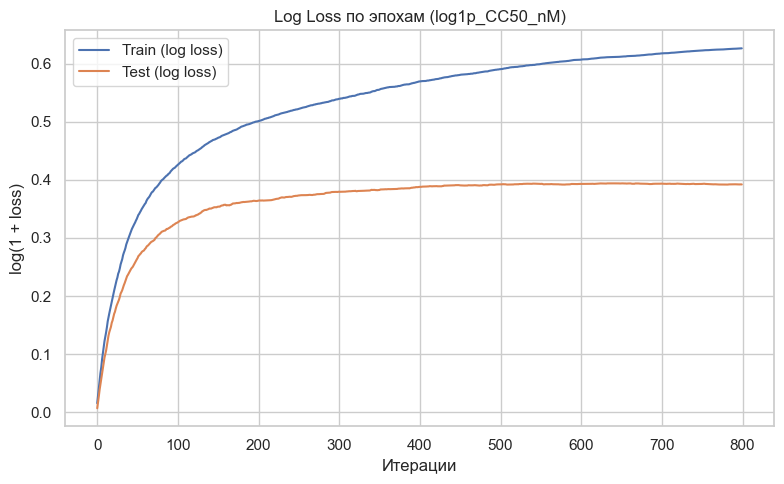

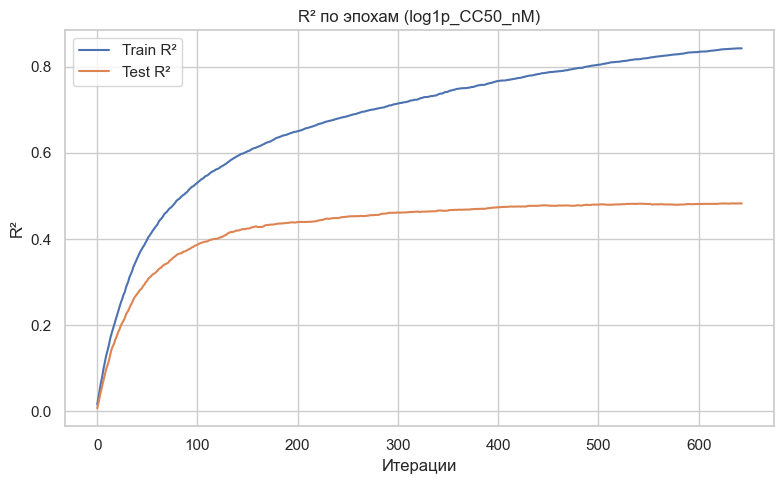

📈 R²:   0.7711
📉 RMSE: 0.4646
📊 MAE:  0.4906


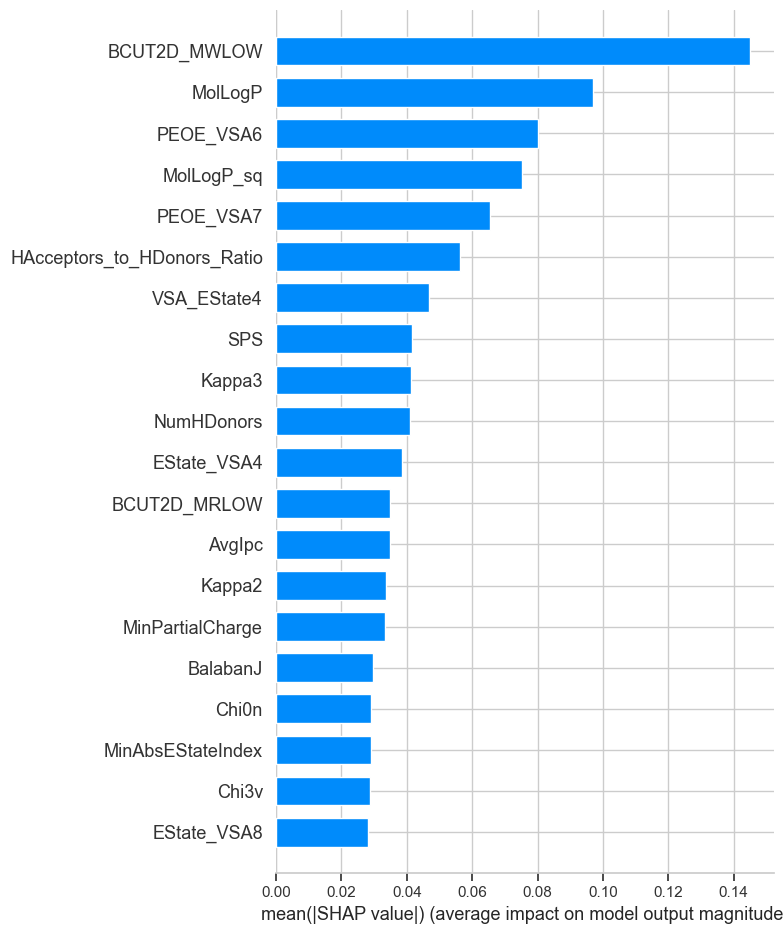

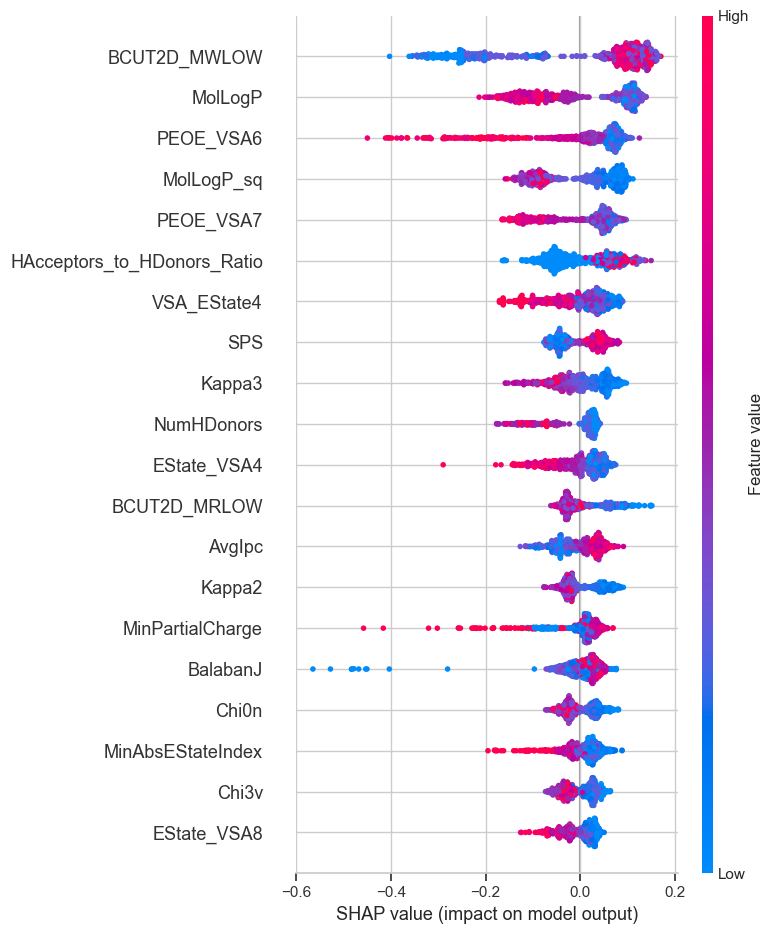

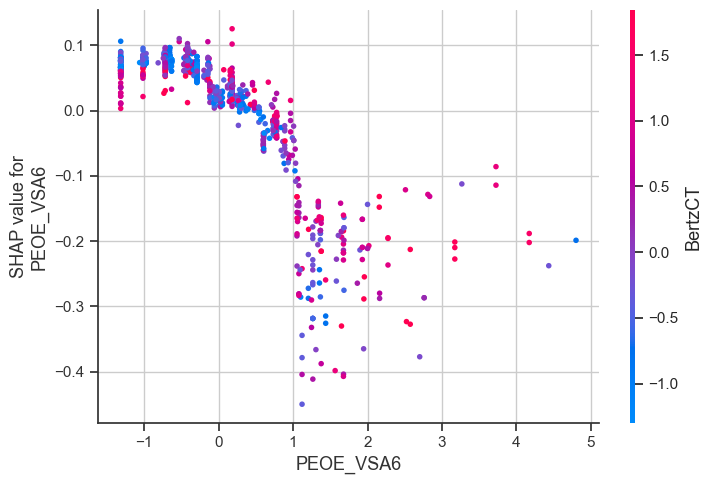

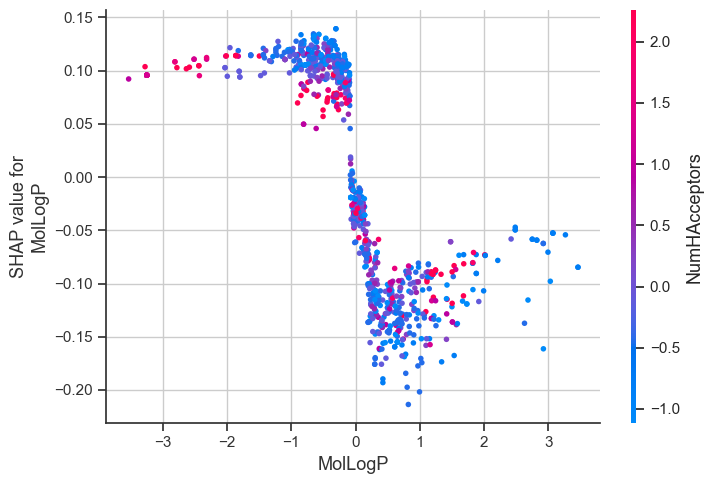

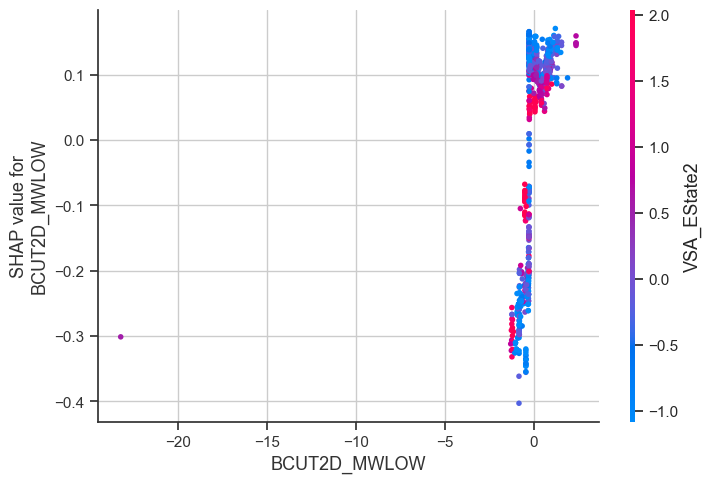

✅ Отобрано признаков: 83
📂 Сохранено: data/features/selected_by_catboost_log1p_CC50_nM.csv


In [39]:
# === ЭТАП 9.1.2: SHAP-анализ для регрессии (log1p_CC50_nM) ===


import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.feature_selection import SelectFromModel

# 📌 Настройки
target_name = "log1p_CC50_nM"
plots_dir = f"plots/shap/{target_name}"
os.makedirs(plots_dir, exist_ok=True)
os.makedirs("data/features", exist_ok=True)

# 📥 Загрузка данных
X = pd.read_csv("data/scaled/X_scaled.csv")
y = pd.read_csv("data/data_final.csv")[target_name]

# 🔀 Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 🧠 Обучение модели
model = CatBoostRegressor(
    iterations=800,
    learning_rate=0.03,
    depth=6,
    eval_metric='R2',
    verbose=0,
    random_state=42
)
model.fit(X_train, y_train, eval_set=(X_test, y_test), use_best_model=True, plot=False)

# 📊 Получение метрик обучения
evals_result = model.get_evals_result()
metric_name = list(evals_result["learn"].keys())[0]

# 📈 График логлосса (log-масштаб)
plt.figure(figsize=(8, 5))
plt.plot(np.log1p(evals_result["learn"][metric_name]), label="Train (log loss)")
plt.plot(np.log1p(evals_result["validation"][metric_name]), label="Test (log loss)")
plt.title(f"Log Loss по эпохам ({target_name})")
plt.xlabel("Итерации")
plt.ylabel("log(1 + loss)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{plots_dir}/log_loss_curve_{target_name}.png")
plt.show()

# 📈 R² по эпохам
train_r2 = []
test_r2 = []
max_trees = model.tree_count_

for i in range(1, max_trees + 1):
    y_train_pred = model.predict(X_train, ntree_end=i)
    y_test_pred = model.predict(X_test, ntree_end=i)
    train_r2.append(r2_score(y_train, y_train_pred))
    test_r2.append(r2_score(y_test, y_test_pred))

plt.figure(figsize=(8, 5))
plt.plot(train_r2, label="Train R²")
plt.plot(test_r2, label="Test R²")
plt.title(f"R² по эпохам ({target_name})")
plt.xlabel("Итерации")
plt.ylabel("R²")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{plots_dir}/r2_curve_{target_name}.png")
plt.show()

# 🧪 Предсказания и метрики
y_pred = model.predict(X)
print(f"📈 R²:   {r2_score(y, y_pred):.4f}")
print(f"📉 RMSE: {mean_squared_error(y, y_pred):.4f}")
print(f"📊 MAE:  {mean_absolute_error(y, y_pred):.4f}")

# 🔍 SHAP-анализ
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# 📊 SHAP bar plot
shap.summary_plot(shap_values, X, plot_type="bar", max_display=20, show=False)
plt.tight_layout()
plt.savefig(f"{plots_dir}/shap_bar_{target_name}_top20.png")
plt.show()

# 🌈 SHAP beeswarm
shap.summary_plot(shap_values, X, max_display=20, show=False)
plt.tight_layout()
plt.savefig(f"{plots_dir}/shap_beeswarm_{target_name}_top20.png")
plt.show()

# 🔁 SHAP dependence plots (top-3)
top_features = X.columns[np.argsort(np.abs(shap_values).mean(0))[-3:]]
for feature in top_features:
    shap.dependence_plot(feature, shap_values, X, show=False)
    plt.tight_layout()
    plt.savefig(f"{plots_dir}/shap_dependence_{target_name}_{feature}.png")
    plt.show()

# 🏋️ Отбор признаков
sfm = SelectFromModel(model, prefit=True, threshold="median")
selected_features = X.columns[sfm.get_support()]
df_selected = pd.DataFrame({"feature": selected_features})
df_selected.to_csv(f"data/features/selected_by_catboost_{target_name}.csv", index=False)

print(f"✅ Отобрано признаков: {len(selected_features)}")
print(f"📂 Сохранено: data/features/selected_by_catboost_{target_name}.csv")


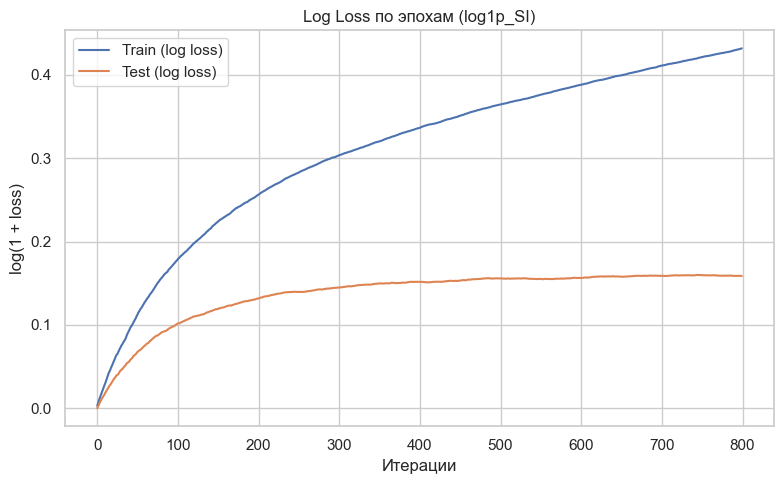

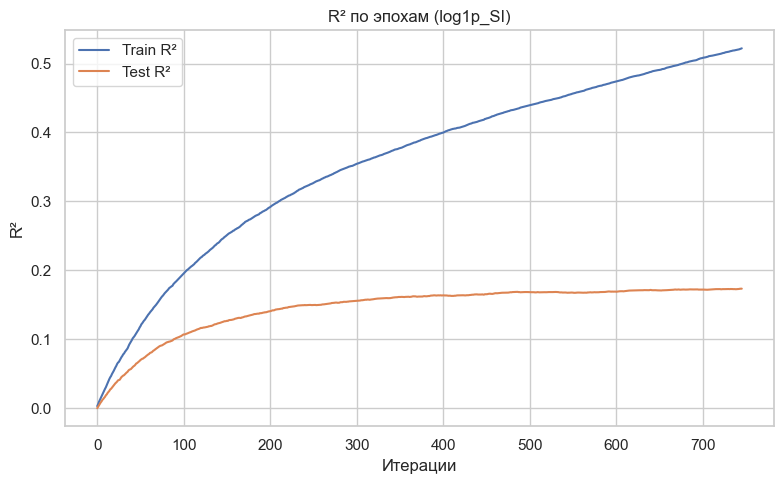

📈 R²:   0.4446
📉 RMSE: 0.6490
📊 MAE:  0.6376


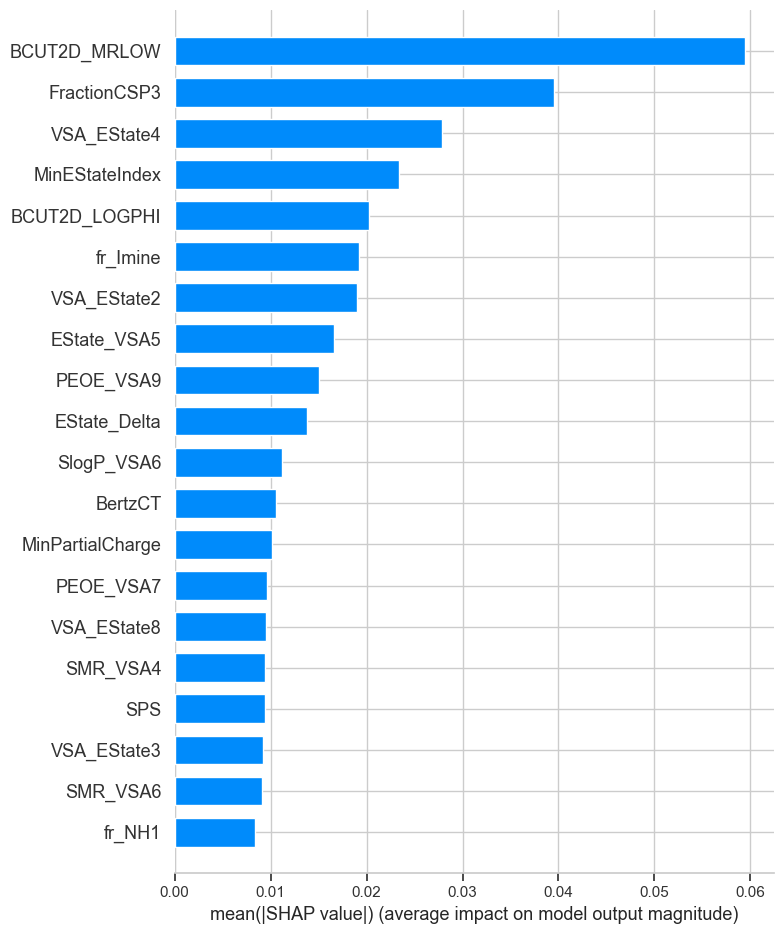

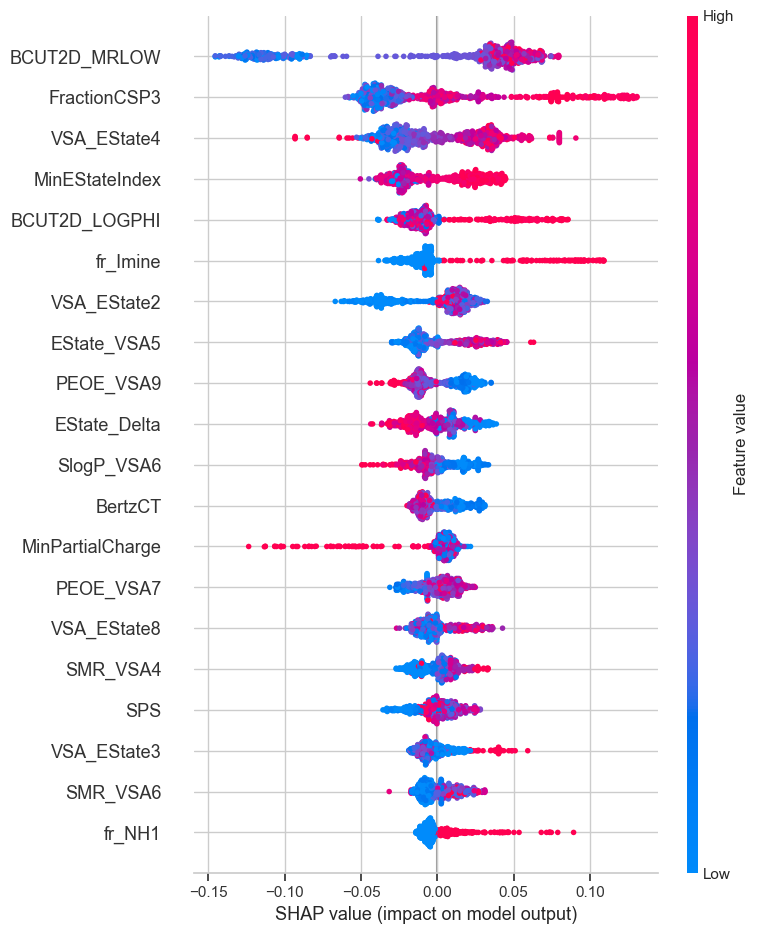

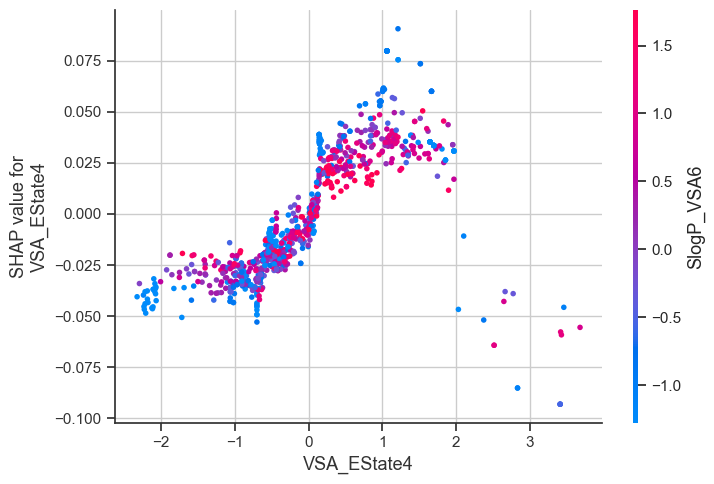

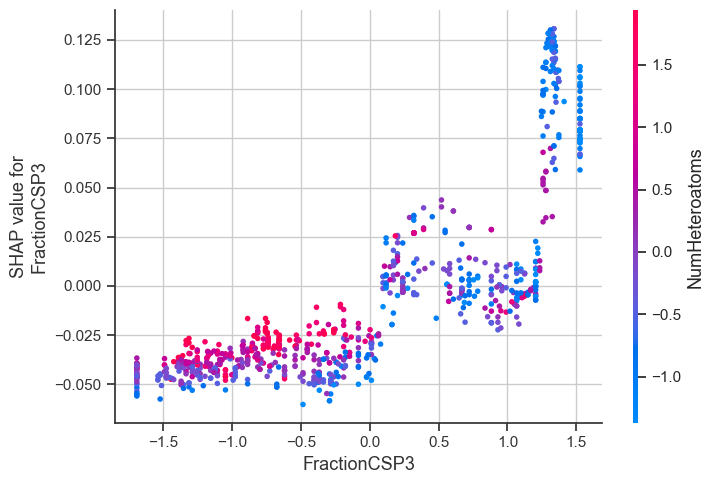

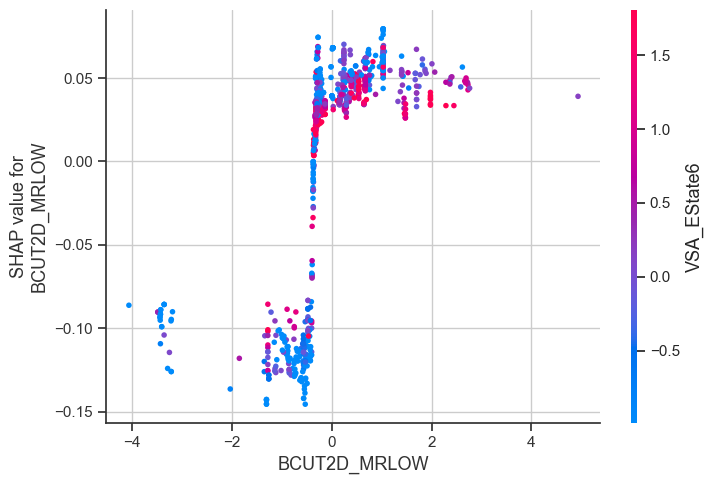

✅ Отобрано признаков: 83
📂 Сохранено: data/features/selected_by_catboost_log1p_SI.csv


In [41]:
# === ЭТАП 9.1.3: SHAP-анализ для регрессии (log1p_SI) ===


import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.feature_selection import SelectFromModel

# 📌 Настройки
target_name = "log1p_SI"
plots_dir = f"plots/shap/{target_name}"
os.makedirs(plots_dir, exist_ok=True)
os.makedirs("data/features", exist_ok=True)

# 📥 Загрузка данных
X = pd.read_csv("data/scaled/X_scaled.csv")
y = pd.read_csv("data/data_final.csv")[target_name]

# 🔀 Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 🧠 Обучение модели
model = CatBoostRegressor(verbose=0, random_state=42)
model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=0)

# 🧠 Обучение модели
model = CatBoostRegressor(
    iterations=800,
    learning_rate=0.01,
    depth=6,
    eval_metric='R2',
    verbose=0,
    random_state=42
    
)
model.fit(X_train, y_train, eval_set=(X_test, y_test), use_best_model=True, plot=False)

# 📊 Получение метрик обучения
evals_result = model.get_evals_result()
metric_name = list(evals_result["learn"].keys())[0]

# 📈 График логлосса (log-масштаб)
plt.figure(figsize=(8, 5))
plt.plot(np.log1p(evals_result["learn"][metric_name]), label="Train (log loss)")
plt.plot(np.log1p(evals_result["validation"][metric_name]), label="Test (log loss)")
plt.title(f"Log Loss по эпохам ({target_name})")
plt.xlabel("Итерации")
plt.ylabel("log(1 + loss)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{plots_dir}/log_loss_curve_{target_name}.png")
plt.show()

# 📈 R² по эпохам
train_r2 = []
test_r2 = []
max_trees = model.tree_count_

for i in range(1, max_trees + 1):
    y_train_pred = model.predict(X_train, ntree_end=i)
    y_test_pred = model.predict(X_test, ntree_end=i)
    train_r2.append(r2_score(y_train, y_train_pred))
    test_r2.append(r2_score(y_test, y_test_pred))

plt.figure(figsize=(8, 5))
plt.plot(train_r2, label="Train R²")
plt.plot(test_r2, label="Test R²")
plt.title(f"R² по эпохам ({target_name})")
plt.xlabel("Итерации")
plt.ylabel("R²")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{plots_dir}/r2_curve_{target_name}.png")
plt.show()

# 🧪 Предсказания и метрики
y_pred = model.predict(X)
print(f"📈 R²:   {r2_score(y, y_pred):.4f}")
print(f"📉 RMSE: {mean_squared_error(y, y_pred):.4f}")
print(f"📊 MAE:  {mean_absolute_error(y, y_pred):.4f}")

# 🔍 SHAP-анализ
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# 📊 SHAP bar plot
shap.summary_plot(shap_values, X, plot_type="bar", max_display=20, show=False)
plt.tight_layout()
plt.savefig(f"{plots_dir}/shap_bar_{target_name}_top20.png")
plt.show()

# 🌈 SHAP beeswarm
shap.summary_plot(shap_values, X, max_display=20, show=False)
plt.tight_layout()
plt.savefig(f"{plots_dir}/shap_beeswarm_{target_name}_top20.png")
plt.show()

# 🔁 SHAP dependence plots (top-3)
top_features = X.columns[np.argsort(np.abs(shap_values).mean(0))[-3:]]
for feature in top_features:
    shap.dependence_plot(feature, shap_values, X, show=False)
    plt.tight_layout()
    plt.savefig(f"{plots_dir}/shap_dependence_{target_name}_{feature}.png")
    plt.show()

# 🏋️ Отбор признаков
sfm = SelectFromModel(model, prefit=True, threshold="median")
selected_features = X.columns[sfm.get_support()]
df_selected = pd.DataFrame({"feature": selected_features})
df_selected.to_csv(f"data/features/selected_by_catboost_{target_name}.csv", index=False)

print(f"✅ Отобрано признаков: {len(selected_features)}")
print(f"📂 Сохранено: data/features/selected_by_catboost_{target_name}.csv")


In [42]:
# # === ЭТАП 9.2: SHAP-анализ (CatBoostClassifier) + метрики ===

# import os
# import shap
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import (
#     classification_report, accuracy_score, balanced_accuracy_score,
#     precision_score, recall_score, f1_score, roc_auc_score,
#     log_loss, matthews_corrcoef, cohen_kappa_score, confusion_matrix
# )
# from sklearn.utils import class_weight
# from sklearn.feature_selection import SelectFromModel
# from catboost import CatBoostClassifier

# # === Каталоги ===
# os.makedirs("plots/shap", exist_ok=True)
# os.makedirs("data/features", exist_ok=True)

# # === Данные ===
# X = pd.read_csv("data/scaled/X_scaled.csv")
# df = pd.read_csv("data/data_final.csv")

# # === Целевые колонки для классификации ===
# class_targets = {
#     "clf_IC50_gt_median": "IC50_gt_median",
#     "clf_CC50_gt_median": "CC50_gt_median",
#     "clf_SI_gt_median": "SI_gt_median",
#     "clf_SI_gt_8": "SI_gt_8"
# }

# # === Обработка каждой задачи ===
# for prefix, target_col in class_targets.items():
#     print(f"\n🔬 Задача классификации: {prefix}")

#     y = df[target_col]

#     # === Балансировка классов ===
#     weights = class_weight.compute_class_weight("balanced", classes=np.unique(y), y=y)
#     class_weights = dict(zip(np.unique(y), weights))

#     # === Train/Test Split ===
#     X_train, X_test, y_train, y_test = train_test_split(
#         X, y, stratify=y, test_size=0.2, random_state=42
#     )

#     # === Обучение модели ===
#     clf = CatBoostClassifier(
#         iterations=800,
#         learning_rate=0.01,
#         random_seed=42,
#         class_weights=class_weights,
#         eval_metric="Logloss",
#         use_best_model=True,
#         verbose=10
#     )

#     clf.fit(X_train, y_train, eval_set=(X_test, y_test), plot=False)

#     # 📈 График обучения (Logloss)
#     evals_result = clf.get_evals_result()
#     metric_name = list(evals_result["learn"].keys())[0]

#     plt.figure(figsize=(8, 5))
#     plt.plot(evals_result["learn"][metric_name], label="Train")
#     plt.plot(evals_result["validation"][metric_name], label="Test")
#     plt.title(f"График обучения модели ({prefix}) — {metric_name}")
#     plt.xlabel("Итерации")
#     plt.ylabel(metric_name)
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.savefig(f"plots/shap/train_val_curve_{prefix}.png")
#     plt.show()


#     # 📈 Accuracy по эпохам
#     train_acc = []
#     test_acc = []
#     for i in range(1, clf.tree_count_ + 1):
#         y_train_pred = clf.predict(X_train, ntree_end=i)
#         y_test_pred = clf.predict(X_test, ntree_end=i)
#         train_acc.append(accuracy_score(y_train, y_train_pred))
#         test_acc.append(accuracy_score(y_test, y_test_pred))

#     plt.figure(figsize=(8, 5))
#     plt.plot(train_acc, label="Train Accuracy")
#     plt.plot(test_acc, label="Test Accuracy")
#     plt.title(f"Accuracy по эпохам ({prefix})")
#     plt.xlabel("Итерации")
#     plt.ylabel("Accuracy")
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.savefig(f"plots/shap/acc_curve_{prefix}.png")
#     plt.show()

#     # 📈 ROC AUC по эпохам
#     train_auc = []
#     test_auc = []
#     for i in range(1, clf.tree_count_ + 1):
#         y_train_proba = clf.predict_proba(X_train, ntree_end=i)[:, 1]
#         y_test_proba = clf.predict_proba(X_test, ntree_end=i)[:, 1]
#         train_auc.append(roc_auc_score(y_train, y_train_proba))
#         test_auc.append(roc_auc_score(y_test, y_test_proba))

#     plt.figure(figsize=(8, 5))
#     plt.plot(train_auc, label="Train ROC AUC")
#     plt.plot(test_auc, label="Test ROC AUC")
#     plt.title(f"ROC AUC по эпохам ({prefix})")
#     plt.xlabel("Итерации")
#     plt.ylabel("ROC AUC")
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.savefig(f"plots/shap/roc_auc_curve_{prefix}.png")
#     plt.show()

#     # === Предсказания ===
#     y_pred = clf.predict(X_test)
#     y_proba = clf.predict_proba(X_test)[:, 1]

#     # === Метрики
#     print(classification_report(y_test, y_pred))
#     print(f"✅ Accuracy:               {accuracy_score(y_test, y_pred):.4f}")
#     print(f"✅ Balanced Accuracy:      {balanced_accuracy_score(y_test, y_pred):.4f}")
#     print(f"✅ Precision:              {precision_score(y_test, y_pred):.4f}")
#     print(f"✅ Recall:                 {recall_score(y_test, y_pred):.4f}")
#     print(f"✅ F1 Score:               {f1_score(y_test, y_pred):.4f}")
#     print(f"✅ ROC AUC:                {roc_auc_score(y_test, y_proba):.4f}")
#     print(f"✅ Log Loss:               {log_loss(y_test, y_proba):.4f}")
#     print(f"✅ MCC:                    {matthews_corrcoef(y_test, y_pred):.4f}")
#     print(f"✅ Cohen Kappa:            {cohen_kappa_score(y_test, y_pred):.4f}")
#     print(f"🧾 Confusion Matrix:\n{confusion_matrix(y_test, y_pred)}")

#     # === SHAP-анализ
#     explainer = shap.TreeExplainer(clf)
#     shap_values = explainer.shap_values(X)
#     if isinstance(shap_values, list):
#         shap_values = shap_values[1]

#     shap.summary_plot(shap_values, X, plot_type="bar", max_display=20, show=False)
#     plt.tight_layout()
#     plt.savefig(f"plots/shap/shap_bar_{prefix}.png")
#     plt.show()

#     shap.summary_plot(shap_values, X, max_display=20, show=False)
#     plt.tight_layout()
#     plt.savefig(f"plots/shap/shap_beeswarm_{prefix}.png")
#     plt.show()

#     top_features = X.columns[np.argsort(np.abs(shap_values).mean(0))[-3:]]
#     for feature in top_features:
#         shap.dependence_plot(feature, shap_values, X, show=False)
#         plt.tight_layout()
#         plt.savefig(f"plots/shap/shap_dependence_{prefix}_{feature}.png")
#         plt.show()

#     plt.figure(figsize=(12, 3))
#     shap.plots._waterfall.waterfall_legacy(
#         explainer.expected_value, shap_values[0],
#         features=X.iloc[0], feature_names=X.columns
#     )
#     plt.tight_layout()
#     plt.savefig(f"plots/shap/force_plot_{prefix}.png")
#     plt.show()

#     # 📦 Отбор признаков
#     sfm = SelectFromModel(clf, prefit=True, threshold="median")
#     selected_features = X.columns[sfm.get_support()]
#     pd.DataFrame({"feature": selected_features}).to_csv(
#         f"data/features/selected_by_catboost_{prefix}.csv", index=False
#     )
#     print(f"📌 Отобрано признаков: {len(selected_features)} → сохранено в data/features/selected_by_catboost_{prefix}.csv")


In [43]:
import os
import pandas as pd

# === Параметры путей ===
features_path = "data/features/selected_by_catboost_log1p_IC50_nM.csv"  # признаки по задаче IC50
data_final_path = "data/data_final.csv"                                  # датафрейм после EDA (до масштабирования)
X_scaled_path = "data/scaled/X_scaled.csv"                               # масштабированные признаки
final_output_path = "data/final/data_final_selected.csv"                 # итоговый датасет (признаки + таргеты)
log_path = "logs/feature_selection.log"

# === Обязательные директории ===
os.makedirs("data/final", exist_ok=True)
os.makedirs("logs", exist_ok=True)

# === Целевые переменные (для всех задач) ===
target_cols = [
    "log1p_IC50_nM", "log1p_CC50_nM", "log1p_SI",
    "IC50_gt_median", "CC50_gt_median", "SI_gt_median", "SI_gt_8"
]

# === ШАГ 1: Проверка X_scaled.csv ===
X_scaled = pd.read_csv(X_scaled_path)
print(f"✅ X_scaled: форма = {X_scaled.shape}")

# === ШАГ 2: Проверка data_final.csv ===
df_final_full = pd.read_csv(data_final_path)
print(f"✅ data_final.csv: форма = {df_final_full.shape}")

# === Проверка соответствия размеров ===
if X_scaled.shape[0] != df_final_full.shape[0]:
    raise ValueError(f"❌ Несовпадение строк: X_scaled = {X_scaled.shape[0]}, data_final = {df_final_full.shape[0]}")
else:
    print("✅ Число строк совпадает между X_scaled и data_final")

# === Проверка наличия всех таргетов ===
missing_targets = [col for col in target_cols if col not in df_final_full.columns]
if missing_targets:
    raise ValueError(f"❌ Отсутствуют таргеты: {missing_targets}")
else:
    print("✅ Все таргеты найдены в data_final")

# === ШАГ 3: Загрузка признаков, отобранных по CatBoost для IC50 ===
selected_features = pd.read_csv(features_path)["feature"].tolist()

# === Проверка признаков ===
missing = [f for f in selected_features if f not in df_final_full.columns]
intersect = set(selected_features) & set(target_cols)

print("\n=== ✅ Финальная проверка перед сохранением ===")
print(f"🔢 Отобрано признаков: {len(selected_features)}")
print(f"✅ Итоговая форма: {(df_final_full[selected_features + target_cols]).shape}")
print("✅ Все признаки присутствуют." if not missing else f"❌ Пропущены признаки: {missing}")
print("✅ Нет пересечений признаков и таргетов." if not intersect else f"❌ Пересекаются: {intersect}")

# === ШАГ 4: Сохранение финального датасета (до масштабирования) ===
df_final = df_final_full[selected_features + target_cols]
df_final.to_csv(final_output_path, index=False)
print(f"💾 Финальный датасет сохранён: {final_output_path}")

# === ШАГ 5: Финальный лог ===
with open(log_path, "w") as log:
    log.write("✅ ЭТАП 10: EDA завершён\n")
    log.write(f"X_scaled: {X_scaled.shape}\n")
    log.write(f"data_final.csv: {df_final_full.shape}\n")
    log.write(f"Финальный датасет: {df_final.shape}\n")
    log.write(f"Целевые переменные: {target_cols}\n")
    log.write(f"Признаков: {len(selected_features)}\n")
    if missing:
        log.write(f"❌ Отсутствуют признаки: {missing}\n")
    if intersect:
        log.write(f"❌ Пересечения с таргетами: {intersect}\n")

# === 🧾 Описание всех ключевых датасетов ===
print("\n📘 === ФИНАЛЬНОЕ ОПИСАНИЕ ДАТАСЕТОВ ===")
datasets = [
    ("data/data_final.csv", df_final_full.shape, "⏮️ Финальный датасет до масштабирования: признаки + таргеты (EDA)"),
    ("data/scaled/X_scaled.csv", X_scaled.shape, "📐 Признаки после масштабирования (для подачи в модели)"),
    ("data/final/data_final_selected.csv", df_final.shape, "✅ Отобранные признаки для IC50 + все таргеты (до масштабирования)"),
]
for path, shape, desc in datasets:
    print(f"{path:<40} → {shape} | {desc}")

print("\n🚀 EDA завершён. Можно закрывать ноутбук. Все данные подготовлены для моделирования.")



✅ X_scaled: форма = (872, 165)
✅ data_final.csv: форма = (872, 172)
✅ Число строк совпадает между X_scaled и data_final
✅ Все таргеты найдены в data_final

=== ✅ Финальная проверка перед сохранением ===
🔢 Отобрано признаков: 83
✅ Итоговая форма: (872, 90)
✅ Все признаки присутствуют.
✅ Нет пересечений признаков и таргетов.
💾 Финальный датасет сохранён: data/final/data_final_selected.csv

📘 === ФИНАЛЬНОЕ ОПИСАНИЕ ДАТАСЕТОВ ===
data/data_final.csv                      → (872, 172) | ⏮️ Финальный датасет до масштабирования: признаки + таргеты (EDA)
data/scaled/X_scaled.csv                 → (872, 165) | 📐 Признаки после масштабирования (для подачи в модели)
data/final/data_final_selected.csv       → (872, 90) | ✅ Отобранные признаки для IC50 + все таргеты (до масштабирования)

🚀 EDA завершён. Можно закрывать ноутбук. Все данные подготовлены для моделирования.
